<a href="https://www.kaggle.com/code/mateusbaldamota/eeg-psychiatric-disorders-using-ann?scriptVersionId=208869244" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

| Description

Authors of notebook: Mateus Balda and Alessandro Bof

Reference paper and dataset: https://www.frontiersin.org/journals/psychiatry/articles/10.3389/fpsyt.2021.707581/full

| Notebook structure
0. Setup and Imports  
1. Utility Functions  
2. Data Loading and Preprocessing  
3. Data Preparation for Training  
4. Model Definition  
5. Training and Evaluation  
6. Results
7. Conclusions, Problems, and Limitations

| Training
1. Multiclass classification for `y` main.disorder
2. Balancing using BorderlineSMOTE for minority classes
3. Training across the 21 subsets

## | 0. Setup and Imports

In [1]:
!pip install -q torchsummary;
!pip install -q torchviz;
!pip install -q imbalanced-learn==0.12.4;

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.6 MB/s eta 0:00:0000:01:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.2 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have 

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from IPython.display import FileLink, display, HTML
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.impute import KNNImputer

import torch
import torch.nn as nn
import torch.nn.init as init
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchsummary import summary
from torchviz import make_dot

from imblearn.over_sampling import BorderlineSMOTE

from warnings import filterwarnings
filterwarnings('ignore')

torch.__version__

'2.5.1+cu124'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
np.random.seed(123)
torch.manual_seed(123)

## | 1. Utility Functions

### 1. OUTLIERS

In [ ]:
def detect_outliers_summary(df):
    outliers_summary = {}

    for col in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_limit) | (df[col] > upper_limit)][col]
        
        outliers_summary[col] = {
            'num_outliers': len(outliers),
            'percent_outliers': len(outliers) / len(df) * 100,
            'outliers': outliers.tolist(),
            'lower_limit': lower_limit,
            'upper_limit': upper_limit
        }

    return pd.DataFrame(outliers_summary).T


def treat_outliers_iqr(df, column, factor=1.5):
    Q1 = np.percentile(df[column], 25)
    Q3 = np.percentile(df[column], 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    
    df[column] = np.clip(df[column], lower_bound, upper_bound)
        
    return _, outliers

### 2. NANS

In [ ]:
def remove_missing_columns(df, threshold=0.5):
    limit = int(threshold * len(df))
    df = df.dropna(thresh=limit, axis=1)
    return df
    
def find_most_null_column(df, threshold=0.5):
    null_ratios = df.isnull().mean()
    for col, ration in null_ratios.items():
        if ration > threshold:
            return col
    return None

def analyze_missing_values(df):
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0]
    total_number_nans = df.isnull().sum().sum()
    
    return missing_values, total_number_nans

def handle_nans(df):
    columns_with_nans = df.columns[df.isnull().any()].tolist()
    
    knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    
    df_imputed = pd.DataFrame(knn_imputer.fit_transform(df[columns_with_nans]),
                                columns=columns_with_nans)
    
    df[columns_with_nans] = df_imputed[columns_with_nans]
    
    return df

### 3. SETS & SUBSETS

In [7]:
class Sets:
    # AB = PSD (Power Spectral Density) 19 * 6
    # COH = FC (Functional Connectivity) 171 * 6
    
    def __init__(self, 
                 dataframe: pd.DataFrame,
                 quantitative_features: list[str],
                #  qualitative_features: list[str],
                 target_main: str,
                #  target_specific: str
                 ):
        
        if not isinstance(dataframe, pd.DataFrame):
            raise ValueError("The parameter must be a pandas DataFrame")
        
        self.df = dataframe.copy()
        self.quantitative_features = self.df[quantitative_features]
        # self.qualitative_features = self.df[qualitative_features]
        self.target_main = self.df[[target_main]]
        # self.target_specific = self.df[[target_specific]]
        self.df_ab_psd = None
        self.df_coh_fc = None
        self.df_ab_psd_coh_fc = None
        #self.dfs_bands = {}
        
        self.__create_df_psd()
        self.__create_df_fc()
        self.__create_union_psd_fc()

    # 19 (6 bands)
    def __create_df_psd(self):
        columns_AB = [col for col in self.df.columns if col.startswith('AB')]
        self.df_ab_psd = self.df[columns_AB]
    
    # 171 (6 bands)
    def __create_df_fc(self):
        columns_COH = [col for col in self.df.columns if col.startswith('COH')]
        self.df_coh_fc = self.df[columns_COH]
        
    def __create_union_psd_fc(self):
        if self.df_ab_psd is not None and self.df_coh_fc is not None:
            self.df_ab_psd_coh_fc = pd.concat([self.df_ab_psd, self.df_coh_fc], axis=1)
        else:
            raise ValueError("Subsets AB and COH were not created correctly")

    def create_dfs_bands(self, bands: list[str] = None, df: pd.DataFrame = None):
        dfs_bands = {}
        
        if bands is None:
            bands = ['delta', 'theta', 'alpha', 'beta', 'highbeta','gamma']
        
        for band in bands:
            columns_band = [col for col in df.columns if f'.{band}.' in col]
            if columns_band:
                dfs_bands[band] = df[columns_band]
        
        return dfs_bands


## | 2. Data Loading and Preprocessing

In [8]:
df = pd.read_csv('../input/eeg-psychiatric-disorders-dataset/EEG.machinelearing_data_BRMH.csv')
df.shape

(945, 1149)

In [9]:
# Checking / imputing Nan

output1 = analyze_missing_values(df)
output2 = find_most_null_column(df)
df = remove_missing_columns(df)
output3 = analyze_missing_values(df)
df = handle_nans(df)

display(output1)
display(HTML('<hr>'))
display(output2)
display(HTML('<hr>'))
display(output3)
display(df.shape)
display(HTML('<hr>'))
display(df.isna().sum().sum())
display(df)

(education        15
 IQ               13
 Unnamed: 122    945
 dtype: int64,
 973)

'Unnamed: 122'

(education    15
 IQ           13
 dtype: int64,
 28)

(945, 1148)

0

,no.,sex,age,eeg.date,education,IQ,main.disorder,specific.disorder,AB.A.delta.a.FP1,AB.A.delta.b.FP2,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,1,M,57.0,2012.8.30,13.43871,101.580472,Addictive disorder,Alcohol use disorder,35.998557,21.717375,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,2,M,37.0,2012.9.6,6.00000,120.000000,Addictive disorder,Alcohol use disorder,13.425118,11.002916,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,3,M,32.0,2012.9.10,16.00000,113.000000,Addictive disorder,Alcohol use disorder,29.941780,27.544684,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,4,M,35.0,2012.10.8,18.00000,126.000000,Addictive disorder,Alcohol use disorder,21.496226,21.846832,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,5,M,36.0,2012.10.18,16.00000,112.000000,Addictive disorder,Alcohol use disorder,37.775667,33.607679,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,941,M,22.0,2014.8.28,13.00000,116.000000,Healthy control,Healthy control,41.851823,36.771496,...,82.905657,34.850706,63.970519,63.982003,51.244725,62.203684,62.062237,31.013031,31.183413,98.325230
941,942,M,26.0,2014.9.19,13.00000,118.000000,Healthy control,Healthy control,18.986856,19.401387,...,65.917918,66.700117,44.756285,49.787513,98.905995,54.021304,93.902401,52.740396,92.807331,56.320868
942,943,M,26.0,2014.9.27,16.00000,113.000000,Healthy control,Healthy control,28.781317,32.369230,...,61.040959,27.632209,45.552852,33.638817,46.690983,19.382928,41.050717,7.045821,41.962451,19.092111
943,944,M,24.0,2014.9.20,13.00000,107.000000,Healthy control,Healthy control,19.929100,25.196375,...,99.113664,48.328934,41.248470,28.192238,48.665743,42.007147,28.735945,27.176500,27.529522,20.028446


In [10]:
# detecting outliers

outliers_summary = detect_outliers_summary(df)
outliers_summary.to_csv('outliers_summary.csv', index=True)
outliers_summary['num_outliers'].sum()

26452

In [ ]:
X = df.iloc[:,8:]
target_main = df['main.disorder']
target_specific = df['specific.disorder']
quantitative_features = df.loc[:, ['age', 'education', 'IQ']]
sex = df['sex']

X.shape, target_main.shape, target_specific.shape, quantitative_features.shape, sex.shape

((945, 1140), (945,), (945,), (945, 3), (945,))

In [12]:
column_names = np.unique(target_main).tolist()
pd.DataFrame(np.unique(target_main))

,0
0,Addictive disorder
1,Anxiety disorder
2,Healthy control
3,Mood disorder
4,Obsessive compulsive disorder
5,Schizophrenia
6,Trauma and stress related disorder


In [13]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(target_main)
y_encoded = y_encoded.astype(np.float32)
(pd.DataFrame(y_encoded)).value_counts()

0  
3.0    266
0.0    186
6.0    128
5.0    117
1.0    107
2.0     95
4.0     46
Name: count, dtype: int64

In [14]:
X_concated = pd.concat([quantitative_features, X], axis=1)
X_concated

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,57.0,13.43871,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,37.0,6.00000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,32.0,16.00000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,35.0,18.00000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,36.0,16.00000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,22.0,13.00000,116.000000,41.851823,36.771496,43.671792,36.860889,24.732236,23.607823,23.288260,...,82.905657,34.850706,63.970519,63.982003,51.244725,62.203684,62.062237,31.013031,31.183413,98.325230
941,26.0,13.00000,118.000000,18.986856,19.401387,27.586436,20.194732,19.407491,20.216570,16.465027,...,65.917918,66.700117,44.756285,49.787513,98.905995,54.021304,93.902401,52.740396,92.807331,56.320868
942,26.0,16.00000,113.000000,28.781317,32.369230,11.717778,23.134370,26.209302,25.484497,22.586688,...,61.040959,27.632209,45.552852,33.638817,46.690983,19.382928,41.050717,7.045821,41.962451,19.092111
943,24.0,13.00000,107.000000,19.929100,25.196375,14.445391,16.453456,16.590649,16.007279,18.909188,...,99.113664,48.328934,41.248470,28.192238,48.665743,42.007147,28.735945,27.176500,27.529522,20.028446


In [15]:
# class balancing 

borderline_smote = BorderlineSMOTE(k_neighbors=3, random_state=42)
X_resampled, y_resampled = borderline_smote.fit_resample(X_concated, y_encoded)

display(X_resampled)
display((pd.DataFrame(y_resampled)).value_counts())

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,57.000000,13.438710,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,37.000000,6.000000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,32.000000,16.000000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,35.000000,18.000000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,36.000000,16.000000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1857,25.316734,16.000000,122.590560,18.848215,17.953192,18.124769,17.798791,17.155828,19.501348,18.809150,...,90.649213,59.274382,57.996010,65.906688,74.424361,51.600495,72.481835,37.669746,70.393744,59.026147
1858,37.910967,15.206766,119.717294,22.475810,37.214201,22.666290,23.451906,25.555333,24.532122,22.737343,...,77.966235,51.807610,58.152599,56.323073,74.984977,50.960234,69.986686,38.314046,70.768974,52.070437
1859,48.281079,12.254164,90.254164,28.445129,18.053016,19.203409,18.843402,20.442576,19.893870,16.028124,...,75.444990,42.442354,52.766711,44.048382,69.067053,42.758237,52.427951,28.734816,47.995477,59.294021
1860,42.111736,8.476453,94.771744,15.903714,14.886987,12.303060,13.781029,15.076520,17.184864,12.620410,...,79.225446,42.568994,42.391061,45.600630,67.811362,35.011289,54.835830,23.835465,50.603209,52.778712


0  
0.0    266
1.0    266
2.0    266
3.0    266
4.0    266
5.0    266
6.0    266
Name: count, dtype: int64

In [16]:
y_resampled = pd.Series(y_resampled, name='main.disorder')
display(y_resampled)
display(pd.DataFrame(y_resampled).value_counts())


0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1857    6.0
1858    6.0
1859    6.0
1860    6.0
1861    6.0
Name: main.disorder, Length: 1862, dtype: float32

main.disorder
0.0              266
1.0              266
2.0              266
3.0              266
4.0              266
5.0              266
6.0              266
Name: count, dtype: int64

In [17]:
df_union = pd.concat([X_resampled, pd.DataFrame(y_resampled)], axis=1)

display(df_union.shape)
display(df_union.head())
display(df.isna().sum().sum())

(1862, 1144)

,age,education,IQ,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,...,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2,main.disorder
0,57.0,13.43871,101.580472,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,...,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029,0.0
1,37.0,6.00000,120.000000,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,...,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261,0.0
2,32.0,16.00000,113.000000,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,...,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799,0.0
3,35.0,18.00000,126.000000,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,...,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873,0.0
4,36.0,16.00000,112.000000,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,...,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662,0.0


0

In [18]:
# set and subset separation

sets = Sets(dataframe=df_union, 
            quantitative_features=['age', 'education', 'IQ'], 
            target_main='main.disorder',
            )

In [19]:
df_psd_all_bands = sets.df_ab_psd
df_fc_all_bands = sets.df_coh_fc
df_psd_fc_all_bands = sets.df_ab_psd_coh_fc
quantitative_features = sets.quantitative_features
target_main = sets.target_main

dfs_bands_psd = sets.create_dfs_bands(df=df_psd_all_bands)
dfs_bands_fc = sets.create_dfs_bands(df=df_fc_all_bands)
dfs_bands_psd_fc = sets.create_dfs_bands(df=df_psd_fc_all_bands)

In [20]:
df_dict_psd_all_band = {
    'psd_all_bands': df_psd_all_bands,
}

df_dict_fc_all_band = {
    'fc_all_bands': df_fc_all_bands,
}

df_dict_psd_fc_all_band = {
    'psd_fc_all_bands': df_psd_fc_all_bands,
}

df_dict_psd_band = {
    'psd_delta': dfs_bands_psd['delta'],
    'psd_theta': dfs_bands_psd['theta'],
    'psd_alpha': dfs_bands_psd['alpha'],
    'psd_beta': dfs_bands_psd['beta'],
    'psd_highbeta': dfs_bands_psd['highbeta'],
    'psd_gamma': dfs_bands_psd['gamma'],
}

df_dict_fc_band = {
    'fc_delta': dfs_bands_fc['delta'],
    'fc_theta': dfs_bands_fc['theta'],
    'fc_alpha': dfs_bands_fc['alpha'],
    'fc_beta': dfs_bands_fc['beta'],
    'fc_highbeta': dfs_bands_fc['highbeta'],
    'fc_gamma': dfs_bands_fc['gamma'],
}

df_dict_psd_fc_band = {
    'psd_fc_delta': dfs_bands_psd_fc['delta'],
    'psd_fc_theta': dfs_bands_psd_fc['theta'],
    'psd_fc_alpha': dfs_bands_psd_fc['alpha'],
    'psd_fc_beta': dfs_bands_psd_fc['beta'],
    'psd_fc_highbeta': dfs_bands_psd_fc['highbeta'],
    'psd_fc_gamma': dfs_bands_psd_fc['gamma'],
}

In [21]:
for dataset_name, df in df_dict_psd_all_band.items():
    print(f"{dataset_name}: {df.shape} shape")
    display(df.head())
    print("\n")

psd_all_bands: (1862, 114) shape


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


## | 3. Data Preparation for Training

In [22]:
class EEGDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [ ]:
train_ratio = 0.7
val_ratio = 0.15

output_dim = len(np.unique(y_encoded))

# params 
neurons_psd_all_bands = [
    [456, 228, 114, 57, 28],
    [256, 128, 64, 32, 16],
    [114, 57, 28, 14, 7], #
    [96, 48, 24, 12, 6],
]
neurons_fc_all_bands = [
    [2048, 1024, 512, 256, 128],
    [1536, 768, 384, 192, 96],
    [1026, 513, 256, 128, 64], #
    [896, 448, 224, 112, 56],
]
neurons_psd_fc_all_bands = [
    [2048, 1024, 512, 256, 128],
    [1536, 768, 384, 192, 96],
    [1140, 570, 285, 142, 71], #
    [896, 448, 224, 112, 56],
]
neurons_psd_per_band = [
    [95, 64, 32, 16, 8],
    [64, 32, 16, 8, 4],
    [48, 24, 12, 6, 3],
    [19, 16, 8, 4, 2], #
]
neurons_fc_per_band = [
    [684, 342, 171, 85, 42],
    [171, 114, 76, 38, 19], #
    [128, 85, 57, 28, 14],
]
neurons_psd_fc_per_band = [
    [760, 380, 190, 95, 48],
    [256, 128, 64, 32, 16],
    [190, 127, 85, 42, 21], #
    [128, 85, 57, 28, 14],
]

neurons = [
    [64, 32, 32, 16, 8]
]

dropout_rates = [0.10, 0.20, 0.30]
learning_rates = [0.0001, 0.001, 0.01, 0.1]
batch_sizes = [32, 64, 128]
weight_decays = [0.0001, 0.001, 0.01]  

num_epochs = 500

In [24]:
# Method to prepare datasets

def prepare_datasets(
    X, y, 
    train_ratio = train_ratio,
    val_ratio = val_ratio,
    batch_size = batch_sizes[0], 
    scaler = None
):
    
    if scaler is None:
        scaler = StandardScaler() 
    
    X_scaled = scaler.fit_transform(X)

    dataset = EEGDataset(X_scaled, y)
    
    total_size = len(dataset)
    train_size = int(train_ratio * total_size) # 70% train
    val_size = int(val_ratio * total_size) # 15% val
    test_size = total_size - train_size - val_size # 15% test

    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size]
    )
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    return {
        'loaders': {
            'train': train_loader,
            'val': val_loader,
            'test': test_loader,
        },
        'shape_X_scaled': X_scaled.shape
    }

## | 4. Model Definition 
Neural network architecture

In [25]:
class EEGANNClassifier(nn.Module):
    def __init__(self, input_dim, output_dim, neurons, dropout=0.10):
        super(EEGANNClassifier, self).__init__()
        
        self.layer1 = nn.Linear(input_dim, neurons[0])
        self.layer2 = nn.Linear(neurons[0], neurons[1])
        self.layer3 = nn.Linear(neurons[1], neurons[2])
        self.layer4 = nn.Linear(neurons[2], neurons[3])
        self.layer5 = nn.Linear(neurons[3], neurons[4])
        self.output_layer = nn.Linear(neurons[4], output_dim)

        self.bn1 = nn.BatchNorm1d(neurons[0])
        self.bn2 = nn.BatchNorm1d(neurons[1])
        self.bn3 = nn.BatchNorm1d(neurons[2])
        self.bn4 = nn.BatchNorm1d(neurons[3])
        self.bn5 = nn.BatchNorm1d(neurons[4])

        self.gelu = nn.GELU()

        self.dropout = nn.Dropout(p=dropout)
        
        init.xavier_uniform_(self.layer1.weight)
        init.xavier_uniform_(self.layer2.weight)
        init.xavier_uniform_(self.layer3.weight)
        init.xavier_uniform_(self.layer4.weight)
        init.xavier_uniform_(self.layer5.weight)
        init.xavier_uniform_(self.output_layer.weight)

    def forward(self, x):
        x = self.gelu(self.bn1(self.layer1(x))) 
        x = self.dropout(x)
        
        x = self.gelu(self.bn2(self.layer2(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn3(self.layer3(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn4(self.layer4(x)))
        x = self.dropout(x)
        
        x = self.gelu(self.bn5(self.layer5(x)))
        
        x = self.output_layer(x)
        
        return x

## | 5. Training and Evaluation  

In [26]:
# Method for train

def train_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer, 
    scheduler, 
    num_epochs = num_epochs,
    patience = 20,
    min_delta = 0.01
):
    
    best_loss = float('inf')
    early_stop_counter = 0
    train_losses = []
    val_losses = []
    val_accs = []
    final_epoch = 0

    for epoch in range(num_epochs):
        
        # ------------------- Train -------------------
        model.train()
        running_loss = 0.0

        for data in train_loader:
            inputs, labels = data
            inputs = inputs.to(device)
            
            optimizer.zero_grad()  # zero gradients

            # Forward pass
            outputs = model(inputs)
            labels = labels.to(device).long()

            # Calculate a loss
            loss = criterion(outputs, labels)
            loss.backward()  # Calculate gradients
            optimizer.step()  # Update weights

            running_loss += loss.item()

        # Average training loss
        epoch_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {epoch_loss:.4f}")
        train_losses.append(epoch_loss)

        # ------------------- Val -------------------
        model.eval() 
        val_loss = 0.0
        val_accuracy = 0.0

        with torch.no_grad():
            for data in val_loader:
                inputs, labels = data
                inputs = inputs.to(device)
                
                outputs = model(inputs)
                
                labels = labels.to(device).long()

                loss = criterion(outputs, labels)
                val_loss += loss.item()

                # Calculate accuracy
                _, predicted = torch.max(outputs.data, 1)
                accuracy = (predicted == labels).float().mean()
                val_accuracy += accuracy.item()

        val_loss /= len(val_loader)
        val_accuracy /= len(val_loader)

        print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}\n")
        val_losses.append(val_loss)
        val_accs.append(val_accuracy)

        # ------------------- Early Stopping -------------------
        if val_loss < best_loss - min_delta:
            best_loss = val_loss
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        if early_stop_counter >= patience:
            print(f"Early stopping at epoch {epoch + 1}.")
            final_epoch = epoch + 1
            break 

        # update scheduler
        scheduler.step(val_loss)

    return train_losses, val_losses, val_accs, final_epoch

In [27]:
criterion = nn.CrossEntropyLoss()

In [28]:
# Methods for evaluation

def plot_training_curves(train_losses, val_losses, val_accs):
    if not (train_losses and val_losses and val_accs):
        return None

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(train_losses, label='Training Loss')
    axs[0].plot(val_losses, label='Validation Loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    axs[1].plot(val_accs, label='Validation Accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy (%)')
    axs[1].legend()

    fig.suptitle('Training & Validation Metrics')
    fig.tight_layout()
    return fig

def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)))
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title('Confusion Matrix')
    fig.tight_layout()
    return fig

def plot_roc_curves(y_true, y_probs, class_names):
    fig, ax = plt.subplots(figsize=(10, 8))
    for i, class_name in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true == i, y_probs[:, i])
        auc = roc_auc_score(y_true == i, y_probs[:, i])
        ax.plot(fpr, tpr, label=f'{class_name} (AUC = {auc:.4f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curves by Class')
    ax.legend(loc='lower right')
    fig.tight_layout()
    return fig

def compute_auc_scores(y_true, y_probs, num_classes, verbose=True):
    if num_classes is None:
        return None, None

    aucs = [roc_auc_score(y_true == i, y_probs[:, i]) for i in range(num_classes)]
    mean_auc = np.mean(aucs)

    if verbose:
        # print(f"\n📈 AUC per class: {aucs}")
        print(f"📊 Mean AUC: {mean_auc:.4f}")

    return aucs, mean_auc

def print_accuracy_report(accuracy, y_true, y_pred, class_names, verbose=True):
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4)
    if verbose:
        print(f"\n✅ Test Accuracy: {accuracy:.2f}%")
        print("\n📋 Classification Report:\n", report)
    return report

In [29]:
# Method to evaluate the model

import matplotlib
matplotlib.use('Agg')

def evaluate_model(
    model,
    test_loader,
    class_names,
    train_losses=None,
    val_losses=None,
    val_accs=None,
    num_classes=None
):
    model.eval()

    fig_curves = plot_training_curves(train_losses, val_losses, val_accs)

    all_probs, all_labels = [], []
    correct, total = 0, 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)
            _, predicted = torch.max(probs, 1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)
    pred_classes = np.argmax(all_probs, axis=1)
    accuracy = 100 * correct / total

    report = print_accuracy_report(accuracy, all_labels, pred_classes, class_names)
    fig_conf = plot_confusion_matrix(all_labels, pred_classes, class_names)
    fig_roc = plot_roc_curves(all_labels, all_probs, class_names)
    aucs, mean_auc = compute_auc_scores(all_labels, all_probs, num_classes)

    return {
        "accuracy": accuracy,
        "classification_report": report,
        "aucs": aucs,
        "mean_auc": mean_auc,
        "fig_curves": fig_curves,
        "fig_conf_matrix": fig_conf,
        "fig_roc": fig_roc
    }

In [30]:
# Method for random search

import random

def random_search(
    num_trials=10,
    neurons=None,
    dropout_rates=None,
    learning_rates=None,
    batch_sizes=None,
    weight_decays=None,
    train_ratio=None,
    val_ratio=None,
    X=None,
    y_encoded=None,
    input_dim=None,
    output_dim=None,
    num_epochs=None,
    criterion=None,
):
    
    best_accuracy = 0
    best_params = {}
    best_results = {}
    training_values = {}
    
    for _ in range(num_trials):
        # Randomly select parameters
        neurons_choice = random.choice(neurons)
        dropout_choice = random.choice(dropout_rates)
        learning_rate_choice = random.choice(learning_rates)
        batch_size_choice = random.choice(batch_sizes)
        weight_decay_choice = random.choice(weight_decays)

        # Prepare datasets
        datasets = prepare_datasets(
            X=X, y=y_encoded,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            batch_size=batch_size_choice
        )

        # Create model
        model = EEGANNClassifier(
            input_dim=input_dim, 
            output_dim=output_dim, 
            neurons=neurons_choice, 
            dropout=dropout_choice
        ).to(device)

        optimizer = optim.Adam(
            model.parameters(), 
            lr=learning_rate_choice,
            weight_decay=weight_decay_choice
        )
        
        scheduler = ReduceLROnPlateau(
            optimizer,
            mode='min',
            factor = 0.1,
            patience = 3,
            min_lr = 1e-6, 
            verbose = True
        )

        # Train model
        train_losses, val_losses, val_accs, final_epoch = train_model(
            model=model,
            train_loader=datasets['loaders']['train'],
            val_loader=datasets['loaders']['val'],
            criterion=criterion,
            optimizer=optimizer,
            scheduler=scheduler,
            num_epochs=num_epochs
        )
        
        print(f'{neurons_choice} neurons, {dropout_choice} dropout, {learning_rate_choice} learning rate, {batch_size_choice} batch size, {weight_decay_choice} weight decay')

        # Evaluate model on test set
        test_results = evaluate_model(
            model=model, 
            test_loader=datasets['loaders']['test'],
            class_names=column_names,
            train_losses=train_losses,
            val_losses=val_losses,
            val_accs=val_accs,
            num_classes=output_dim,
        )
        
        display(HTML('<hr>'))
        display(datasets['shape_X_scaled'])
        display(HTML('<hr>'))
        
        if test_results['accuracy'] > best_accuracy:
            best_accuracy = test_results['accuracy']
            
            best_params = {
                'neurons': neurons_choice,
                'dropout': dropout_choice,
                'learning_rate': learning_rate_choice,
                'batch_size': batch_size_choice,
                'weight_decay': weight_decay_choice
            }
            
            best_results = {
                'final_epoch': final_epoch,
                'best_accuracy': test_results['accuracy'],
                'mean_auc': test_results['mean_auc'],
                'classification_report': test_results['classification_report'],
                'aucs': test_results['aucs'],
                'fig_curves': test_results['fig_curves'],
                'fig_conf_matrix': test_results['fig_conf_matrix'],
                'fig_roc': test_results['fig_roc']
            }
            
            training_values = {
                'train_losses': train_losses,
                'val_losses': val_losses,
                'val_accs': val_accs
            }
    
    return best_params, best_results, training_values

In [31]:
from sklearn.preprocessing import RobustScaler

scaler2 = RobustScaler()

quantitative_features_scaled = scaler2.fit_transform(quantitative_features)

quantitative_features = pd.DataFrame(quantitative_features_scaled, columns=quantitative_features.columns)

quantitative_features

,age,education,IQ
0,2.556680,0.060827,-0.118573
1,0.873993,-1.950991,0.784104
2,0.453321,0.753534,0.441059
3,0.705724,1.294439,1.078143
4,0.789859,0.753534,0.392052
...,...,...,...
1857,-0.108971,0.753534,0.911058
1858,0.950637,0.539002,0.770250
1859,1.823119,-0.259537,-0.673635
1860,1.304066,-1.281228,-0.452245


In [32]:
# Method for training all subsets

def train_all_subsets(
    df_dict: dict,
    num_trials: int = 10,
    train_ratio = 0.7,
    val_ratio = 0.15,
    y=None,
    quantitative_features=None,
    neurons=None,
    dropout_rates=None,
    learning_rates=None,
    batch_sizes=None,
    weight_decays=None,
    num_epochs=500,
    criterion=nn.CrossEntropyLoss(),
):
    all_results = {}
    
    for dataset_name, df in df_dict.items():
        print(f"Training on {dataset_name}...")
        print(f"Dataset shape: {df.shape}")
        
        display(HTML('<hr>'))
        display(df.head())
        display(HTML('<hr>'))
        
        df_quantitative_features = pd.concat([quantitative_features, df], axis=1)
        
        best_params, best_results, training_values = random_search(
            num_trials=num_trials,
            neurons=neurons,
            dropout_rates=dropout_rates,
            learning_rates=learning_rates,
            batch_sizes=batch_sizes,
            weight_decays=weight_decays,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            X=df_quantitative_features,
            y_encoded=y,
            input_dim=df_quantitative_features.shape[1],
            output_dim=len(np.unique(y)),
            num_epochs=num_epochs,
            criterion=criterion
        )
        
        all_results[dataset_name] = {
            'best_params': best_params,
            'best_results': best_results,
            'training_values': training_values
        }
        
    return all_results

In [33]:
# training

all_results = train_all_subsets(
    df_dict=df_dict_psd_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results2 = train_all_subsets(
    df_dict=df_dict_fc_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_fc_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results3 = train_all_subsets(
    df_dict=df_dict_psd_fc_all_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_fc_all_bands,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results4 = train_all_subsets(
    df_dict=df_dict_psd_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results5 = train_all_subsets(
    df_dict=df_dict_fc_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_fc_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

all_results6 =  train_all_subsets(
    df_dict=df_dict_psd_fc_band,
    num_trials=10,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    y=y_resampled,
    neurons=neurons_psd_fc_per_band,
    dropout_rates=dropout_rates,
    learning_rates=learning_rates,
    batch_sizes=batch_sizes,
    weight_decays=weight_decays,
    num_epochs=num_epochs
)

Training on psd_all_bands...
Dataset shape: (1862, 114)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


Epoch [1/500], Loss: 1.9784
Validation Loss: 1.9097, Validation Accuracy: 0.2060

Epoch [2/500], Loss: 1.9123
Validation Loss: 1.8879, Validation Accuracy: 0.2664

Epoch [3/500], Loss: 1.8471
Validation Loss: 1.8777, Validation Accuracy: 0.2602

Epoch [4/500], Loss: 1.8485
Validation Loss: 1.8610, Validation Accuracy: 0.2821

Epoch [5/500], Loss: 1.7960
Validation Loss: 1.8311, Validation Accuracy: 0.2977

Epoch [6/500], Loss: 1.7835
Validation Loss: 1.8235, Validation Accuracy: 0.2859

Epoch [7/500], Loss: 1.7554
Validation Loss: 1.8090, Validation Accuracy: 0.3008

Epoch [8/500], Loss: 1.7460
Validation Loss: 1.7963, Validation Accuracy: 0.3151

Epoch [9/500], Loss: 1.7135
Validation Loss: 1.7802, Validation Accuracy: 0.2970

Epoch [10/500], Loss: 1.6814
Validation Loss: 1.7610, Validation Accuracy: 0.3015

Epoch [11/500], Loss: 1.6627
Validation Loss: 1.7323, Validation Accuracy: 0.3477

Epoch [12/500], Loss: 1.6657
Validation Loss: 1.7150, Validation Accuracy: 0.3463

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.1922
Validation Loss: 1.9179, Validation Accuracy: 0.1848

Epoch [2/500], Loss: 2.0998
Validation Loss: 1.9081, Validation Accuracy: 0.2257

Epoch [3/500], Loss: 2.0946
Validation Loss: 1.8979, Validation Accuracy: 0.2506

Epoch [4/500], Loss: 2.0660
Validation Loss: 1.8898, Validation Accuracy: 0.2454

Epoch [5/500], Loss: 2.0413
Validation Loss: 1.8849, Validation Accuracy: 0.2454

Epoch [6/500], Loss: 2.0407
Validation Loss: 1.8797, Validation Accuracy: 0.2688

Epoch [7/500], Loss: 2.0280
Validation Loss: 1.8748, Validation Accuracy: 0.2569

Epoch [8/500], Loss: 2.0153
Validation Loss: 1.8735, Validation Accuracy: 0.2528

Epoch [9/500], Loss: 2.0000
Validation Loss: 1.8752, Validation Accuracy: 0.2647

Epoch [10/500], Loss: 1.9847
Validation Loss: 1.8748, Validation Accuracy: 0.2134

Epoch [11/500], Loss: 1.9781
Validation Loss: 1.8695, Validation Accuracy: 0.2094

Epoch [12/500], Loss: 1.9761
Validation Loss: 1.8684, Validation Accuracy: 0.2120

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 1.9990
Validation Loss: 1.9542, Validation Accuracy: 0.1534

Epoch [2/500], Loss: 1.9498
Validation Loss: 1.9532, Validation Accuracy: 0.1464

Epoch [3/500], Loss: 1.9564
Validation Loss: 1.9580, Validation Accuracy: 0.1464

Epoch [4/500], Loss: 1.9558
Validation Loss: 1.9599, Validation Accuracy: 0.1264

Epoch [5/500], Loss: 1.9428
Validation Loss: 1.9478, Validation Accuracy: 0.1611

Epoch [6/500], Loss: 1.9589
Validation Loss: 1.9631, Validation Accuracy: 0.1416

Epoch [7/500], Loss: 1.9530
Validation Loss: 1.9477, Validation Accuracy: 0.1596

Epoch [8/500], Loss: 1.9554
Validation Loss: 2.8910, Validation Accuracy: 0.1221

Epoch [9/500], Loss: 1.9562
Validation Loss: 1.9492, Validation Accuracy: 0.1534

Epoch [10/500], Loss: 1.9466
Validation Loss: 1.9468, Validation Accuracy: 0.1520

Epoch [11/500], Loss: 1.9280
Validation Loss: 2.1956, Validation Accuracy: 0.1895

Epoch [12/500], Loss: 1.9107
Validation Loss: 1.9166, Validation Accuracy: 0.1950

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.1165
Validation Loss: 2.0495, Validation Accuracy: 0.1540

Epoch [2/500], Loss: 2.0937
Validation Loss: 2.0588, Validation Accuracy: 0.1457

Epoch [3/500], Loss: 2.0980
Validation Loss: 2.0246, Validation Accuracy: 0.1561

Epoch [4/500], Loss: 2.0712
Validation Loss: 2.0376, Validation Accuracy: 0.1665

Epoch [5/500], Loss: 2.0652
Validation Loss: 2.0300, Validation Accuracy: 0.1561

Epoch [6/500], Loss: 2.0654
Validation Loss: 2.0360, Validation Accuracy: 0.1679

Epoch [7/500], Loss: 2.0638
Validation Loss: 2.0188, Validation Accuracy: 0.1665

Epoch [8/500], Loss: 2.0233
Validation Loss: 2.0086, Validation Accuracy: 0.1665

Epoch [9/500], Loss: 2.0200
Validation Loss: 1.9953, Validation Accuracy: 0.1617

Epoch [10/500], Loss: 2.0132
Validation Loss: 2.0043, Validation Accuracy: 0.1700

Epoch [11/500], Loss: 1.9961
Validation Loss: 1.9937, Validation Accuracy: 0.1735

Epoch [12/500], Loss: 1.9948
Validation Loss: 1.9776, Validation Accuracy: 0.1735

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.1309
Validation Loss: 1.9153, Validation Accuracy: 0.1291

Epoch [2/500], Loss: 2.0110
Validation Loss: 1.8874, Validation Accuracy: 0.1893

Epoch [3/500], Loss: 1.9935
Validation Loss: 1.8619, Validation Accuracy: 0.1919

Epoch [4/500], Loss: 1.9316
Validation Loss: 1.8369, Validation Accuracy: 0.2391

Epoch [5/500], Loss: 1.8533
Validation Loss: 1.8017, Validation Accuracy: 0.2916

Epoch [6/500], Loss: 1.8090
Validation Loss: 1.7854, Validation Accuracy: 0.3060

Epoch [7/500], Loss: 1.8151
Validation Loss: 1.7667, Validation Accuracy: 0.3481

Epoch [8/500], Loss: 1.7895
Validation Loss: 1.7405, Validation Accuracy: 0.3165

Epoch [9/500], Loss: 1.7543
Validation Loss: 1.7395, Validation Accuracy: 0.3217

Epoch [10/500], Loss: 1.7441
Validation Loss: 1.7324, Validation Accuracy: 0.3440

Epoch [11/500], Loss: 1.6939
Validation Loss: 1.7090, Validation Accuracy: 0.3637

Epoch [12/500], Loss: 1.6802
Validation Loss: 1.6707, Validation Accuracy: 0.3466

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.2664
Validation Loss: 2.0083, Validation Accuracy: 0.1598

Epoch [2/500], Loss: 2.2311
Validation Loss: 1.9964, Validation Accuracy: 0.1785

Epoch [3/500], Loss: 2.1166
Validation Loss: 1.9697, Validation Accuracy: 0.1879

Epoch [4/500], Loss: 2.0628
Validation Loss: 1.9452, Validation Accuracy: 0.2004

Epoch [5/500], Loss: 2.0740
Validation Loss: 1.9270, Validation Accuracy: 0.2004

Epoch [6/500], Loss: 2.0131
Validation Loss: 1.9065, Validation Accuracy: 0.2067

Epoch [7/500], Loss: 2.0025
Validation Loss: 1.8940, Validation Accuracy: 0.2154

Epoch [8/500], Loss: 1.9479
Validation Loss: 1.8661, Validation Accuracy: 0.2348

Epoch [9/500], Loss: 1.9864
Validation Loss: 1.8511, Validation Accuracy: 0.2285

Epoch [10/500], Loss: 1.9425
Validation Loss: 1.8533, Validation Accuracy: 0.2254

Epoch [11/500], Loss: 1.9482
Validation Loss: 1.8381, Validation Accuracy: 0.2497

Epoch [12/500], Loss: 1.8785
Validation Loss: 1.8287, Validation Accuracy: 0.2410

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 1.9899
Validation Loss: 1.9723, Validation Accuracy: 0.1104

Epoch [2/500], Loss: 1.9595
Validation Loss: 1.9599, Validation Accuracy: 0.1318

Epoch [3/500], Loss: 1.9578
Validation Loss: 2.0356, Validation Accuracy: 0.1409

Epoch [4/500], Loss: 1.9581
Validation Loss: 3.8089, Validation Accuracy: 0.1700

Epoch [5/500], Loss: 1.9611
Validation Loss: 2.1321, Validation Accuracy: 0.1505

Epoch [6/500], Loss: 1.9601
Validation Loss: 1.9536, Validation Accuracy: 0.1270

Epoch [7/500], Loss: 1.9636
Validation Loss: 1.9597, Validation Accuracy: 0.1611

Epoch [8/500], Loss: 1.9585
Validation Loss: 1.9527, Validation Accuracy: 0.1443

Epoch [9/500], Loss: 1.9639
Validation Loss: 2.2679, Validation Accuracy: 0.1721

Epoch [10/500], Loss: 1.9663
Validation Loss: 1.9635, Validation Accuracy: 0.1596

Epoch [11/500], Loss: 1.9694
Validation Loss: 1.9536, Validation Accuracy: 0.1401

Epoch [12/500], Loss: 1.9590
Validation Loss: 1.9509, Validation Accuracy: 0.1470

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.0925
Validation Loss: 2.0447, Validation Accuracy: 0.1868

Epoch [2/500], Loss: 2.0686
Validation Loss: 2.0897, Validation Accuracy: 0.1868

Epoch [3/500], Loss: 2.0742
Validation Loss: 2.0695, Validation Accuracy: 0.1774

Epoch [4/500], Loss: 2.0579
Validation Loss: 2.0818, Validation Accuracy: 0.1931

Epoch [5/500], Loss: 2.0383
Validation Loss: 2.0610, Validation Accuracy: 0.1962

Epoch [6/500], Loss: 2.0419
Validation Loss: 2.0718, Validation Accuracy: 0.1962

Epoch [7/500], Loss: 2.0394
Validation Loss: 2.0533, Validation Accuracy: 0.1868

Epoch [8/500], Loss: 2.0290
Validation Loss: 2.0542, Validation Accuracy: 0.1993

Epoch [9/500], Loss: 2.0292
Validation Loss: 2.0623, Validation Accuracy: 0.2087

Epoch [10/500], Loss: 2.0474
Validation Loss: 2.0621, Validation Accuracy: 0.1899

Epoch [11/500], Loss: 2.0252
Validation Loss: 2.0609, Validation Accuracy: 0.2149

Epoch [12/500], Loss: 2.0198
Validation Loss: 2.0551, Validation Accuracy: 0.1931

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 2.2249
Validation Loss: 1.9389, Validation Accuracy: 0.2383

Epoch [2/500], Loss: 2.1054
Validation Loss: 1.9350, Validation Accuracy: 0.2303

Epoch [3/500], Loss: 2.0745
Validation Loss: 1.9052, Validation Accuracy: 0.2247

Epoch [4/500], Loss: 2.0414
Validation Loss: 1.8800, Validation Accuracy: 0.2216

Epoch [5/500], Loss: 2.0288
Validation Loss: 1.8760, Validation Accuracy: 0.2584

Epoch [6/500], Loss: 1.9602
Validation Loss: 1.8470, Validation Accuracy: 0.2671

Epoch [7/500], Loss: 1.9452
Validation Loss: 1.8474, Validation Accuracy: 0.2803

Epoch [8/500], Loss: 1.9336
Validation Loss: 1.8178, Validation Accuracy: 0.3533

Epoch [9/500], Loss: 1.8890
Validation Loss: 1.8254, Validation Accuracy: 0.3234

Epoch [10/500], Loss: 1.9006
Validation Loss: 1.8010, Validation Accuracy: 0.3727

Epoch [11/500], Loss: 1.8824
Validation Loss: 1.7864, Validation Accuracy: 0.3845

Epoch [12/500], Loss: 1.8474
Validation Loss: 1.7706, Validation Accuracy: 0.3727

Epoch [13/500

(1862, 114)

Epoch [1/500], Loss: 1.9518
Validation Loss: 1.8713, Validation Accuracy: 0.2547

Epoch [2/500], Loss: 1.8787
Validation Loss: 1.8325, Validation Accuracy: 0.2665

Epoch [3/500], Loss: 1.8384
Validation Loss: 1.7982, Validation Accuracy: 0.2671

Epoch [4/500], Loss: 1.8240
Validation Loss: 1.7847, Validation Accuracy: 0.2616

Epoch [5/500], Loss: 1.8041
Validation Loss: 1.7643, Validation Accuracy: 0.2678

Epoch [6/500], Loss: 1.7499
Validation Loss: 1.7315, Validation Accuracy: 0.2997

Epoch [7/500], Loss: 1.7659
Validation Loss: 1.7200, Validation Accuracy: 0.3302

Epoch [8/500], Loss: 1.7130
Validation Loss: 1.6316, Validation Accuracy: 0.3705

Epoch [9/500], Loss: 1.7094
Validation Loss: 1.6757, Validation Accuracy: 0.3191

Epoch [10/500], Loss: 1.6584
Validation Loss: 1.5920, Validation Accuracy: 0.3830

Epoch [11/500], Loss: 1.6645
Validation Loss: 1.7175, Validation Accuracy: 0.3462

Epoch [12/500], Loss: 1.6650
Validation Loss: 1.5943, Validation Accuracy: 0.3587

Epoch [13/500

(1862, 114)

Training on fc_all_bands...
Dataset shape: (1862, 1026)


,COH.A.delta.a.FP1.b.FP2,COH.A.delta.a.FP1.c.F7,COH.A.delta.a.FP1.d.F3,COH.A.delta.a.FP1.e.Fz,COH.A.delta.a.FP1.f.F4,COH.A.delta.a.FP1.g.F8,COH.A.delta.a.FP1.h.T3,COH.A.delta.a.FP1.i.C3,COH.A.delta.a.FP1.j.Cz,COH.A.delta.a.FP1.k.C4,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,49.346741,40.235120,56.181835,49.858714,28.297071,18.089521,22.598544,28.328151,29.067040,27.911928,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,76.950968,60.256175,77.374983,72.895431,61.492831,38.103992,41.007326,53.906695,54.375496,37.615250,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,74.336922,79.309590,73.301047,77.045829,47.553073,29.114105,37.764503,40.502080,34.727810,19.250300,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,29.631700,41.589723,66.176221,44.577578,60.429280,19.669577,34.926288,24.364206,24.165479,20.759497,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,66.392189,41.839478,64.619452,65.225754,47.783486,31.993546,21.655290,43.369933,46.444416,19.057848,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.0201
Validation Loss: 1.9469, Validation Accuracy: 0.1561

Epoch [2/500], Loss: 1.8869
Validation Loss: 1.9343, Validation Accuracy: 0.1790

Epoch [3/500], Loss: 1.8586
Validation Loss: 1.9149, Validation Accuracy: 0.1603

Epoch [4/500], Loss: 1.8569
Validation Loss: 1.8633, Validation Accuracy: 0.2402

Epoch [5/500], Loss: 1.8720
Validation Loss: 1.9083, Validation Accuracy: 0.1630

Epoch [6/500], Loss: 1.8571
Validation Loss: 1.8793, Validation Accuracy: 0.1860

Epoch [7/500], Loss: 1.8541
Validation Loss: 1.8225, Validation Accuracy: 0.2784

Epoch [8/500], Loss: 1.8632
Validation Loss: 1.8452, Validation Accuracy: 0.2686

Epoch [9/500], Loss: 1.8596
Validation Loss: 1.9404, Validation Accuracy: 0.2089

Epoch [10/500], Loss: 1.8606
Validation Loss: 1.8258, Validation Accuracy: 0.2477

Epoch [11/500], Loss: 1.8575
Validation Loss: 1.9195, Validation Accuracy: 0.1873

Epoch [12/500], Loss: 1.8267
Validation Loss: 1.8508, Validation Accuracy: 0.2512

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.0067
Validation Loss: 1.8564, Validation Accuracy: 0.2935

Epoch [2/500], Loss: 1.7442
Validation Loss: 1.7158, Validation Accuracy: 0.3410

Epoch [3/500], Loss: 1.5568
Validation Loss: 1.6145, Validation Accuracy: 0.4060

Epoch [4/500], Loss: 1.4364
Validation Loss: 1.5303, Validation Accuracy: 0.4609

Epoch [5/500], Loss: 1.3172
Validation Loss: 1.4490, Validation Accuracy: 0.4564

Epoch [6/500], Loss: 1.1973
Validation Loss: 1.4630, Validation Accuracy: 0.4664

Epoch [7/500], Loss: 1.1707
Validation Loss: 1.3878, Validation Accuracy: 0.5133

Epoch [8/500], Loss: 1.0561
Validation Loss: 1.4415, Validation Accuracy: 0.4473

Epoch [9/500], Loss: 1.0015
Validation Loss: 1.5331, Validation Accuracy: 0.4865

Epoch [10/500], Loss: 0.9577
Validation Loss: 1.3126, Validation Accuracy: 0.5234

Epoch [11/500], Loss: 0.9450
Validation Loss: 1.4219, Validation Accuracy: 0.5307

Epoch [12/500], Loss: 0.9438
Validation Loss: 1.4535, Validation Accuracy: 0.4872

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.0320
Validation Loss: 2.1947, Validation Accuracy: 0.2602

Epoch [2/500], Loss: 1.8474
Validation Loss: 1.8552, Validation Accuracy: 0.2588

Epoch [3/500], Loss: 1.7755
Validation Loss: 1.7766, Validation Accuracy: 0.3001

Epoch [4/500], Loss: 1.6566
Validation Loss: 1.7098, Validation Accuracy: 0.2963

Epoch [5/500], Loss: 1.5676
Validation Loss: 1.5555, Validation Accuracy: 0.3912

Epoch [6/500], Loss: 1.5296
Validation Loss: 1.5725, Validation Accuracy: 0.3838

Epoch [7/500], Loss: 1.5792
Validation Loss: 1.6327, Validation Accuracy: 0.3626

Epoch [8/500], Loss: 1.5352
Validation Loss: 1.6144, Validation Accuracy: 0.3950

Epoch [9/500], Loss: 1.4894
Validation Loss: 1.6466, Validation Accuracy: 0.3300

Epoch [10/500], Loss: 1.3633
Validation Loss: 1.3883, Validation Accuracy: 0.4624

Epoch [11/500], Loss: 1.2653
Validation Loss: 1.3453, Validation Accuracy: 0.4755

Epoch [12/500], Loss: 1.1884
Validation Loss: 1.2566, Validation Accuracy: 0.5342

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 1.9008
Validation Loss: 1.6869, Validation Accuracy: 0.3601

Epoch [2/500], Loss: 1.6159
Validation Loss: 1.5097, Validation Accuracy: 0.4934

Epoch [3/500], Loss: 1.4327
Validation Loss: 1.5134, Validation Accuracy: 0.4538

Epoch [4/500], Loss: 1.3605
Validation Loss: 1.4488, Validation Accuracy: 0.4947

Epoch [5/500], Loss: 1.2682
Validation Loss: 1.5628, Validation Accuracy: 0.4316

Epoch [6/500], Loss: 1.2262
Validation Loss: 1.3905, Validation Accuracy: 0.5343

Epoch [7/500], Loss: 1.1651
Validation Loss: 1.3135, Validation Accuracy: 0.5850

Epoch [8/500], Loss: 1.2189
Validation Loss: 1.4487, Validation Accuracy: 0.4802

Epoch [9/500], Loss: 1.1308
Validation Loss: 1.4014, Validation Accuracy: 0.5072

Epoch [10/500], Loss: 1.1393
Validation Loss: 1.4618, Validation Accuracy: 0.5177

Epoch [11/500], Loss: 1.1424
Validation Loss: 1.3479, Validation Accuracy: 0.5171

Epoch [12/500], Loss: 0.9714
Validation Loss: 1.1152, Validation Accuracy: 0.6433

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.0313
Validation Loss: 19.4611, Validation Accuracy: 0.1097

Epoch [2/500], Loss: 1.8431
Validation Loss: 2.1293, Validation Accuracy: 0.2692

Epoch [3/500], Loss: 1.7008
Validation Loss: 1.7287, Validation Accuracy: 0.3306

Epoch [4/500], Loss: 1.5800
Validation Loss: 1.6860, Validation Accuracy: 0.3559

Epoch [5/500], Loss: 1.5725
Validation Loss: 1.7273, Validation Accuracy: 0.3863

Epoch [6/500], Loss: 1.4281
Validation Loss: 1.7254, Validation Accuracy: 0.3599

Epoch [7/500], Loss: 1.4069
Validation Loss: 1.7640, Validation Accuracy: 0.2782

Epoch [8/500], Loss: 1.3434
Validation Loss: 1.7514, Validation Accuracy: 0.3689

Epoch [9/500], Loss: 1.2776
Validation Loss: 1.4261, Validation Accuracy: 0.5221

Epoch [10/500], Loss: 1.1180
Validation Loss: 1.2871, Validation Accuracy: 0.5968

Epoch [11/500], Loss: 0.9951
Validation Loss: 1.2660, Validation Accuracy: 0.5834

Epoch [12/500], Loss: 0.8936
Validation Loss: 1.2149, Validation Accuracy: 0.5979

Epoch [13/50

(1862, 1026)

Epoch [1/500], Loss: 2.1936
Validation Loss: 1.9153, Validation Accuracy: 0.2012

Epoch [2/500], Loss: 1.9661
Validation Loss: 1.9694, Validation Accuracy: 0.1208

Epoch [3/500], Loss: 1.9211
Validation Loss: 2.0205, Validation Accuracy: 0.1748

Epoch [4/500], Loss: 1.8470
Validation Loss: 1.8611, Validation Accuracy: 0.2512

Epoch [5/500], Loss: 1.8538
Validation Loss: 1.8284, Validation Accuracy: 0.2207

Epoch [6/500], Loss: 1.8754
Validation Loss: 2.0562, Validation Accuracy: 0.2047

Epoch [7/500], Loss: 1.8989
Validation Loss: 2.0873, Validation Accuracy: 0.1368

Epoch [8/500], Loss: 1.8743
Validation Loss: 1.8125, Validation Accuracy: 0.2651

Epoch [9/500], Loss: 1.9136
Validation Loss: 2.0416, Validation Accuracy: 0.2360

Epoch [10/500], Loss: 1.8768
Validation Loss: 1.8180, Validation Accuracy: 0.2886

Epoch [11/500], Loss: 1.8626
Validation Loss: 1.7789, Validation Accuracy: 0.2699

Epoch [12/500], Loss: 1.8710
Validation Loss: 2.3778, Validation Accuracy: 0.2144

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.0641
Validation Loss: 9.9267, Validation Accuracy: 0.1830

Epoch [2/500], Loss: 1.8418
Validation Loss: 1.9899, Validation Accuracy: 0.2756

Epoch [3/500], Loss: 1.7644
Validation Loss: 1.7764, Validation Accuracy: 0.2674

Epoch [4/500], Loss: 1.6820
Validation Loss: 1.6607, Validation Accuracy: 0.3790

Epoch [5/500], Loss: 1.5480
Validation Loss: 1.6480, Validation Accuracy: 0.3764

Epoch [6/500], Loss: 1.4581
Validation Loss: 1.7084, Validation Accuracy: 0.3581

Epoch [7/500], Loss: 1.4864
Validation Loss: 1.6743, Validation Accuracy: 0.3868

Epoch [8/500], Loss: 1.4225
Validation Loss: 1.6245, Validation Accuracy: 0.4407

Epoch [9/500], Loss: 1.3724
Validation Loss: 1.6245, Validation Accuracy: 0.3949

Epoch [10/500], Loss: 1.3486
Validation Loss: 1.6996, Validation Accuracy: 0.4027

Epoch [11/500], Loss: 1.3217
Validation Loss: 1.5711, Validation Accuracy: 0.3830

Epoch [12/500], Loss: 1.3391
Validation Loss: 1.7124, Validation Accuracy: 0.3935

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 1.9567
Validation Loss: 1.7366, Validation Accuracy: 0.4010

Epoch [2/500], Loss: 1.6430
Validation Loss: 1.4899, Validation Accuracy: 0.4482

Epoch [3/500], Loss: 1.4388
Validation Loss: 1.3708, Validation Accuracy: 0.4802

Epoch [4/500], Loss: 1.2908
Validation Loss: 1.3100, Validation Accuracy: 0.5385

Epoch [5/500], Loss: 1.1875
Validation Loss: 1.2345, Validation Accuracy: 0.5399

Epoch [6/500], Loss: 1.0326
Validation Loss: 1.1559, Validation Accuracy: 0.6197

Epoch [7/500], Loss: 0.9719
Validation Loss: 1.3910, Validation Accuracy: 0.5559

Epoch [8/500], Loss: 0.9329
Validation Loss: 1.2227, Validation Accuracy: 0.6107

Epoch [9/500], Loss: 0.8135
Validation Loss: 1.2031, Validation Accuracy: 0.6045

Epoch [10/500], Loss: 0.7624
Validation Loss: 1.2031, Validation Accuracy: 0.6301

Epoch [11/500], Loss: 0.5503
Validation Loss: 1.0498, Validation Accuracy: 0.6940

Epoch [12/500], Loss: 0.4545
Validation Loss: 1.0419, Validation Accuracy: 0.6996

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.1812
Validation Loss: 6.4592, Validation Accuracy: 0.1172

Epoch [2/500], Loss: 2.0397
Validation Loss: 2.0164, Validation Accuracy: 0.1424

Epoch [3/500], Loss: 1.9163
Validation Loss: 2.0637, Validation Accuracy: 0.1358

Epoch [4/500], Loss: 1.9009
Validation Loss: 2.0238, Validation Accuracy: 0.2067

Epoch [5/500], Loss: 1.9256
Validation Loss: 1.9549, Validation Accuracy: 0.1781

Epoch [6/500], Loss: 1.9076
Validation Loss: 1.9826, Validation Accuracy: 0.1056

Epoch [7/500], Loss: 1.8930
Validation Loss: 2.4625, Validation Accuracy: 0.1502

Epoch [8/500], Loss: 1.9461
Validation Loss: 1.9938, Validation Accuracy: 0.2175

Epoch [9/500], Loss: 1.9264
Validation Loss: 2.3298, Validation Accuracy: 0.2264

Epoch [10/500], Loss: 1.8708
Validation Loss: 1.8360, Validation Accuracy: 0.2053

Epoch [11/500], Loss: 1.8136
Validation Loss: 1.8515, Validation Accuracy: 0.1867

Epoch [12/500], Loss: 1.7742
Validation Loss: 1.8382, Validation Accuracy: 0.1566

Epoch [13/500

(1862, 1026)

Epoch [1/500], Loss: 2.0398
Validation Loss: 1.7747, Validation Accuracy: 0.3588

Epoch [2/500], Loss: 1.8252
Validation Loss: 1.6704, Validation Accuracy: 0.4447

Epoch [3/500], Loss: 1.6840
Validation Loss: 1.5455, Validation Accuracy: 0.4760

Epoch [4/500], Loss: 1.5530
Validation Loss: 1.4349, Validation Accuracy: 0.4851

Epoch [5/500], Loss: 1.4393
Validation Loss: 1.3614, Validation Accuracy: 0.5273

Epoch [6/500], Loss: 1.3169
Validation Loss: 1.3324, Validation Accuracy: 0.5385

Epoch [7/500], Loss: 1.2271
Validation Loss: 1.2792, Validation Accuracy: 0.5642

Epoch [8/500], Loss: 1.1857
Validation Loss: 1.2524, Validation Accuracy: 0.5682

Epoch [9/500], Loss: 1.1102
Validation Loss: 1.2524, Validation Accuracy: 0.5524

Epoch [10/500], Loss: 1.0349
Validation Loss: 1.1580, Validation Accuracy: 0.5711

Epoch [11/500], Loss: 0.9516
Validation Loss: 1.0903, Validation Accuracy: 0.6037

Epoch [12/500], Loss: 0.9085
Validation Loss: 1.0915, Validation Accuracy: 0.6058

Epoch [13/500

(1862, 1026)

Training on psd_fc_all_bands...
Dataset shape: (1862, 1140)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.1337
Validation Loss: 1.7929, Validation Accuracy: 0.2963

Epoch [2/500], Loss: 1.8691
Validation Loss: 1.6667, Validation Accuracy: 0.4518

Epoch [3/500], Loss: 1.7068
Validation Loss: 1.6059, Validation Accuracy: 0.4505

Epoch [4/500], Loss: 1.5935
Validation Loss: 1.5224, Validation Accuracy: 0.4817

Epoch [5/500], Loss: 1.4901
Validation Loss: 1.4425, Validation Accuracy: 0.5414

Epoch [6/500], Loss: 1.3911
Validation Loss: 1.3806, Validation Accuracy: 0.5531

Epoch [7/500], Loss: 1.2908
Validation Loss: 1.3155, Validation Accuracy: 0.5566

Epoch [8/500], Loss: 1.2463
Validation Loss: 1.2839, Validation Accuracy: 0.5587

Epoch [9/500], Loss: 1.1412
Validation Loss: 1.2126, Validation Accuracy: 0.5830

Epoch [10/500], Loss: 1.0647
Validation Loss: 1.1780, Validation Accuracy: 0.5996

Epoch [11/500], Loss: 1.0193
Validation Loss: 1.1453, Validation Accuracy: 0.6344

Epoch [12/500], Loss: 0.9628
Validation Loss: 1.1133, Validation Accuracy: 0.6288

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.0088
Validation Loss: 8.2337, Validation Accuracy: 0.1859

Epoch [2/500], Loss: 1.8174
Validation Loss: 1.9338, Validation Accuracy: 0.2417

Epoch [3/500], Loss: 1.7282
Validation Loss: 1.7338, Validation Accuracy: 0.3057

Epoch [4/500], Loss: 1.6265
Validation Loss: 1.6604, Validation Accuracy: 0.3176

Epoch [5/500], Loss: 1.5554
Validation Loss: 1.7453, Validation Accuracy: 0.3507

Epoch [6/500], Loss: 1.5260
Validation Loss: 1.5154, Validation Accuracy: 0.3961

Epoch [7/500], Loss: 1.4013
Validation Loss: 1.4380, Validation Accuracy: 0.4682

Epoch [8/500], Loss: 1.3278
Validation Loss: 1.3985, Validation Accuracy: 0.5046

Epoch [9/500], Loss: 1.3042
Validation Loss: 1.2762, Validation Accuracy: 0.5556

Epoch [10/500], Loss: 1.2347
Validation Loss: 1.2987, Validation Accuracy: 0.5296

Epoch [11/500], Loss: 1.1738
Validation Loss: 1.5678, Validation Accuracy: 0.4537

Epoch [12/500], Loss: 1.1013
Validation Loss: 1.2491, Validation Accuracy: 0.5597

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.0261
Validation Loss: 1.8936, Validation Accuracy: 0.2360

Epoch [2/500], Loss: 1.8062
Validation Loss: 1.8474, Validation Accuracy: 0.2767

Epoch [3/500], Loss: 1.7356
Validation Loss: 1.7234, Validation Accuracy: 0.2956

Epoch [4/500], Loss: 1.6519
Validation Loss: 1.8049, Validation Accuracy: 0.2873

Epoch [5/500], Loss: 1.6480
Validation Loss: 1.7272, Validation Accuracy: 0.2811

Epoch [6/500], Loss: 1.6092
Validation Loss: 1.6348, Validation Accuracy: 0.3463

Epoch [7/500], Loss: 1.6240
Validation Loss: 1.7194, Validation Accuracy: 0.2942

Epoch [8/500], Loss: 1.5977
Validation Loss: 1.6688, Validation Accuracy: 0.3324

Epoch [9/500], Loss: 1.6025
Validation Loss: 1.6600, Validation Accuracy: 0.3490

Epoch [10/500], Loss: 1.5806
Validation Loss: 1.6344, Validation Accuracy: 0.3650

Epoch [11/500], Loss: 1.5809
Validation Loss: 1.5475, Validation Accuracy: 0.3824

Epoch [12/500], Loss: 1.5718
Validation Loss: 1.5953, Validation Accuracy: 0.3699

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.0910
Validation Loss: 1.8322, Validation Accuracy: 0.3362

Epoch [2/500], Loss: 1.8085
Validation Loss: 1.7254, Validation Accuracy: 0.3871

Epoch [3/500], Loss: 1.6919
Validation Loss: 1.6428, Validation Accuracy: 0.4395

Epoch [4/500], Loss: 1.5383
Validation Loss: 1.5894, Validation Accuracy: 0.4303

Epoch [5/500], Loss: 1.4903
Validation Loss: 1.5223, Validation Accuracy: 0.4656

Epoch [6/500], Loss: 1.3778
Validation Loss: 1.4818, Validation Accuracy: 0.4812

Epoch [7/500], Loss: 1.2943
Validation Loss: 1.4314, Validation Accuracy: 0.5180

Epoch [8/500], Loss: 1.2139
Validation Loss: 1.3848, Validation Accuracy: 0.5362

Epoch [9/500], Loss: 1.1519
Validation Loss: 1.3387, Validation Accuracy: 0.5559

Epoch [10/500], Loss: 1.0857
Validation Loss: 1.3020, Validation Accuracy: 0.5887

Epoch [11/500], Loss: 1.0194
Validation Loss: 1.2684, Validation Accuracy: 0.5872

Epoch [12/500], Loss: 0.9452
Validation Loss: 1.2208, Validation Accuracy: 0.6214

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.1791
Validation Loss: 1.8570, Validation Accuracy: 0.2707

Epoch [2/500], Loss: 1.8183
Validation Loss: 1.7349, Validation Accuracy: 0.3726

Epoch [3/500], Loss: 1.6629
Validation Loss: 1.6421, Validation Accuracy: 0.4221

Epoch [4/500], Loss: 1.5455
Validation Loss: 1.5727, Validation Accuracy: 0.4392

Epoch [5/500], Loss: 1.3851
Validation Loss: 1.5051, Validation Accuracy: 0.4403

Epoch [6/500], Loss: 1.2895
Validation Loss: 1.4705, Validation Accuracy: 0.4548

Epoch [7/500], Loss: 1.2066
Validation Loss: 1.4254, Validation Accuracy: 0.4731

Epoch [8/500], Loss: 1.1284
Validation Loss: 1.3632, Validation Accuracy: 0.4768

Epoch [9/500], Loss: 1.1010
Validation Loss: 1.3334, Validation Accuracy: 0.4913

Epoch [10/500], Loss: 1.0306
Validation Loss: 1.2981, Validation Accuracy: 0.5556

Epoch [11/500], Loss: 0.9599
Validation Loss: 1.2481, Validation Accuracy: 0.5764

Epoch [12/500], Loss: 0.9355
Validation Loss: 1.2127, Validation Accuracy: 0.6039

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 1.9626
Validation Loss: 1.6916, Validation Accuracy: 0.5105

Epoch [2/500], Loss: 1.4442
Validation Loss: 1.4432, Validation Accuracy: 0.5519

Epoch [3/500], Loss: 1.1554
Validation Loss: 1.2788, Validation Accuracy: 0.6106

Epoch [4/500], Loss: 0.9750
Validation Loss: 1.1571, Validation Accuracy: 0.6642

Epoch [5/500], Loss: 0.8072
Validation Loss: 1.0815, Validation Accuracy: 0.6746

Epoch [6/500], Loss: 0.7232
Validation Loss: 1.0015, Validation Accuracy: 0.6969

Epoch [7/500], Loss: 0.6014
Validation Loss: 0.9401, Validation Accuracy: 0.7296

Epoch [8/500], Loss: 0.5330
Validation Loss: 0.8966, Validation Accuracy: 0.7348

Epoch [9/500], Loss: 0.4692
Validation Loss: 0.8732, Validation Accuracy: 0.7296

Epoch [10/500], Loss: 0.4138
Validation Loss: 0.8493, Validation Accuracy: 0.7478

Epoch [11/500], Loss: 0.3795
Validation Loss: 0.8024, Validation Accuracy: 0.7545

Epoch [12/500], Loss: 0.3157
Validation Loss: 0.7770, Validation Accuracy: 0.7505

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.2625
Validation Loss: 1.9177, Validation Accuracy: 0.2391

Epoch [2/500], Loss: 2.0141
Validation Loss: 1.8339, Validation Accuracy: 0.2834

Epoch [3/500], Loss: 1.8966
Validation Loss: 1.7581, Validation Accuracy: 0.3317

Epoch [4/500], Loss: 1.8087
Validation Loss: 1.7040, Validation Accuracy: 0.3775

Epoch [5/500], Loss: 1.7541
Validation Loss: 1.6581, Validation Accuracy: 0.4195

Epoch [6/500], Loss: 1.6869
Validation Loss: 1.6291, Validation Accuracy: 0.4522

Epoch [7/500], Loss: 1.6164
Validation Loss: 1.6018, Validation Accuracy: 0.4574

Epoch [8/500], Loss: 1.5544
Validation Loss: 1.5633, Validation Accuracy: 0.4928

Epoch [9/500], Loss: 1.5361
Validation Loss: 1.5290, Validation Accuracy: 0.4913

Epoch [10/500], Loss: 1.4887
Validation Loss: 1.4997, Validation Accuracy: 0.4861

Epoch [11/500], Loss: 1.4551
Validation Loss: 1.4750, Validation Accuracy: 0.4861

Epoch [12/500], Loss: 1.3591
Validation Loss: 1.4548, Validation Accuracy: 0.4965

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 2.0041
Validation Loss: 6.9116, Validation Accuracy: 0.1971

Epoch [2/500], Loss: 1.8178
Validation Loss: 1.8972, Validation Accuracy: 0.2953

Epoch [3/500], Loss: 1.6754
Validation Loss: 1.6773, Validation Accuracy: 0.3358

Epoch [4/500], Loss: 1.5883
Validation Loss: 1.7044, Validation Accuracy: 0.3254

Epoch [5/500], Loss: 1.4588
Validation Loss: 1.6864, Validation Accuracy: 0.2961

Epoch [6/500], Loss: 1.3905
Validation Loss: 1.6826, Validation Accuracy: 0.3272

Epoch [7/500], Loss: 1.3605
Validation Loss: 1.5937, Validation Accuracy: 0.3860

Epoch [8/500], Loss: 1.3643
Validation Loss: 1.5316, Validation Accuracy: 0.4065

Epoch [9/500], Loss: 1.2736
Validation Loss: 1.6753, Validation Accuracy: 0.3604

Epoch [10/500], Loss: 1.3067
Validation Loss: 1.5463, Validation Accuracy: 0.3905

Epoch [11/500], Loss: 1.2832
Validation Loss: 1.5953, Validation Accuracy: 0.3946

Epoch [12/500], Loss: 1.2948
Validation Loss: 1.5186, Validation Accuracy: 0.4299

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 1.8759
Validation Loss: 1.7482, Validation Accuracy: 0.3658

Epoch [2/500], Loss: 1.5240
Validation Loss: 1.4976, Validation Accuracy: 0.4894

Epoch [3/500], Loss: 1.2563
Validation Loss: 1.4137, Validation Accuracy: 0.5082

Epoch [4/500], Loss: 1.0674
Validation Loss: 1.3598, Validation Accuracy: 0.5175

Epoch [5/500], Loss: 0.8894
Validation Loss: 1.1557, Validation Accuracy: 0.6037

Epoch [6/500], Loss: 0.8600
Validation Loss: 1.2526, Validation Accuracy: 0.5773

Epoch [7/500], Loss: 0.8766
Validation Loss: 1.2810, Validation Accuracy: 0.5662

Epoch [8/500], Loss: 0.7943
Validation Loss: 1.3471, Validation Accuracy: 0.5530

Epoch [9/500], Loss: 0.7332
Validation Loss: 1.1682, Validation Accuracy: 0.5644

Epoch [10/500], Loss: 0.5643
Validation Loss: 1.0394, Validation Accuracy: 0.6637

Epoch [11/500], Loss: 0.3897
Validation Loss: 0.9667, Validation Accuracy: 0.6860

Epoch [12/500], Loss: 0.3301
Validation Loss: 0.9967, Validation Accuracy: 0.6798

Epoch [13/500

(1862, 1140)

Epoch [1/500], Loss: 1.9074
Validation Loss: 1.6818, Validation Accuracy: 0.4281

Epoch [2/500], Loss: 1.5921
Validation Loss: 1.4012, Validation Accuracy: 0.4968

Epoch [3/500], Loss: 1.3626
Validation Loss: 1.2846, Validation Accuracy: 0.5447

Epoch [4/500], Loss: 1.1700
Validation Loss: 1.2030, Validation Accuracy: 0.5829

Epoch [5/500], Loss: 0.9955
Validation Loss: 1.1925, Validation Accuracy: 0.5780

Epoch [6/500], Loss: 0.8886
Validation Loss: 1.0984, Validation Accuracy: 0.6363

Epoch [7/500], Loss: 0.8713
Validation Loss: 0.9882, Validation Accuracy: 0.6745

Epoch [8/500], Loss: 0.7336
Validation Loss: 1.0281, Validation Accuracy: 0.6710

Epoch [9/500], Loss: 0.6222
Validation Loss: 1.0599, Validation Accuracy: 0.6593

Epoch [10/500], Loss: 0.5392
Validation Loss: 1.0257, Validation Accuracy: 0.6892

Epoch [11/500], Loss: 0.5500
Validation Loss: 1.0851, Validation Accuracy: 0.6780

Epoch [12/500], Loss: 0.3679
Validation Loss: 0.9241, Validation Accuracy: 0.7280

Epoch [13/500

(1862, 1140)

Training on psd_delta...
Dataset shape: (1862, 19)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,AB.A.delta.k.C4,AB.A.delta.l.T4,AB.A.delta.m.T5,AB.A.delta.n.P3,AB.A.delta.o.Pz,AB.A.delta.p.P4,AB.A.delta.q.T6,AB.A.delta.r.O1,AB.A.delta.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,23.987650,14.741769,16.271815,18.376257,16.447620,16.409822,11.777727,18.278916,17.243432
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,12.742712,6.230904,11.238420,14.767063,15.653628,13.290791,8.538482,14.740076,9.326202
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,20.293571,11.946956,11.063130,20.956259,18.946034,16.965524,11.242449,11.812897,9.385839
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,8.816415,8.456443,17.676429,9.959183,9.877650,10.098478,10.612230,12.782252,8.645818
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,17.712593,18.278851,15.449687,9.239752,13.154119,34.529365,19.541089,10.434374,17.268496


Epoch [1/500], Loss: 2.0662
Validation Loss: 1.9537, Validation Accuracy: 0.1529

Epoch [2/500], Loss: 2.0717
Validation Loss: 1.9706, Validation Accuracy: 0.1476

Epoch [3/500], Loss: 2.0869
Validation Loss: 1.9793, Validation Accuracy: 0.1517

Epoch [4/500], Loss: 2.0350
Validation Loss: 1.9781, Validation Accuracy: 0.1595

Epoch [5/500], Loss: 2.0374
Validation Loss: 1.9814, Validation Accuracy: 0.1621

Epoch [6/500], Loss: 2.0819
Validation Loss: 1.9725, Validation Accuracy: 0.1621

Epoch [7/500], Loss: 2.0673
Validation Loss: 1.9783, Validation Accuracy: 0.1621

Epoch [8/500], Loss: 2.0512
Validation Loss: 1.9896, Validation Accuracy: 0.1647

Epoch [9/500], Loss: 2.1015
Validation Loss: 1.9781, Validation Accuracy: 0.1543

Epoch [10/500], Loss: 2.0727
Validation Loss: 1.9767, Validation Accuracy: 0.1398

Epoch [11/500], Loss: 2.0555
Validation Loss: 1.9863, Validation Accuracy: 0.1595

Epoch [12/500], Loss: 2.0556
Validation Loss: 1.9825, Validation Accuracy: 0.1543

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0751
Validation Loss: 1.9647, Validation Accuracy: 0.1886

Epoch [2/500], Loss: 2.0298
Validation Loss: 1.9448, Validation Accuracy: 0.1730

Epoch [3/500], Loss: 1.9532
Validation Loss: 1.8948, Validation Accuracy: 0.1792

Epoch [4/500], Loss: 1.9071
Validation Loss: 1.8791, Validation Accuracy: 0.1848

Epoch [5/500], Loss: 1.8900
Validation Loss: 1.8437, Validation Accuracy: 0.2247

Epoch [6/500], Loss: 1.8600
Validation Loss: 1.8345, Validation Accuracy: 0.2397

Epoch [7/500], Loss: 1.8294
Validation Loss: 1.8206, Validation Accuracy: 0.2279

Epoch [8/500], Loss: 1.8172
Validation Loss: 1.8048, Validation Accuracy: 0.2247

Epoch [9/500], Loss: 1.7791
Validation Loss: 1.8004, Validation Accuracy: 0.2504

Epoch [10/500], Loss: 1.7679
Validation Loss: 1.7807, Validation Accuracy: 0.2678

Epoch [11/500], Loss: 1.7531
Validation Loss: 1.7638, Validation Accuracy: 0.2952

Epoch [12/500], Loss: 1.7297
Validation Loss: 1.7568, Validation Accuracy: 0.3140

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1591
Validation Loss: 1.9955, Validation Accuracy: 0.1450

Epoch [2/500], Loss: 2.1697
Validation Loss: 2.0049, Validation Accuracy: 0.1424

Epoch [3/500], Loss: 2.1214
Validation Loss: 2.0060, Validation Accuracy: 0.1372

Epoch [4/500], Loss: 2.1504
Validation Loss: 2.0123, Validation Accuracy: 0.1201

Epoch [5/500], Loss: 2.1138
Validation Loss: 2.0062, Validation Accuracy: 0.1413

Epoch [6/500], Loss: 2.1057
Validation Loss: 2.0101, Validation Accuracy: 0.1268

Epoch [7/500], Loss: 2.1077
Validation Loss: 2.0095, Validation Accuracy: 0.1268

Epoch [8/500], Loss: 2.0992
Validation Loss: 2.0052, Validation Accuracy: 0.1294

Epoch [9/500], Loss: 2.0974
Validation Loss: 1.9940, Validation Accuracy: 0.1361

Epoch [10/500], Loss: 2.1075
Validation Loss: 1.9965, Validation Accuracy: 0.1439

Epoch [11/500], Loss: 2.1038
Validation Loss: 1.9948, Validation Accuracy: 0.1387

Epoch [12/500], Loss: 2.1041
Validation Loss: 1.9989, Validation Accuracy: 0.1294

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1833
Validation Loss: 2.0451, Validation Accuracy: 0.1374

Epoch [2/500], Loss: 2.1455
Validation Loss: 2.0369, Validation Accuracy: 0.1325

Epoch [3/500], Loss: 2.1047
Validation Loss: 2.0260, Validation Accuracy: 0.1325

Epoch [4/500], Loss: 2.1070
Validation Loss: 2.0194, Validation Accuracy: 0.1360

Epoch [5/500], Loss: 2.0809
Validation Loss: 2.0144, Validation Accuracy: 0.1464

Epoch [6/500], Loss: 2.0668
Validation Loss: 2.0124, Validation Accuracy: 0.1499

Epoch [7/500], Loss: 2.0564
Validation Loss: 1.9993, Validation Accuracy: 0.1464

Epoch [8/500], Loss: 2.0650
Validation Loss: 1.9986, Validation Accuracy: 0.1464

Epoch [9/500], Loss: 2.0445
Validation Loss: 1.9921, Validation Accuracy: 0.1603

Epoch [10/500], Loss: 2.0057
Validation Loss: 1.9818, Validation Accuracy: 0.1603

Epoch [11/500], Loss: 2.0157
Validation Loss: 1.9845, Validation Accuracy: 0.1569

Epoch [12/500], Loss: 1.9955
Validation Loss: 1.9807, Validation Accuracy: 0.1569

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9692
Validation Loss: 1.9511, Validation Accuracy: 0.1567

Epoch [2/500], Loss: 1.9519
Validation Loss: 1.9451, Validation Accuracy: 0.1667

Epoch [3/500], Loss: 1.9507
Validation Loss: 1.9598, Validation Accuracy: 0.1174

Epoch [4/500], Loss: 1.9501
Validation Loss: 1.9215, Validation Accuracy: 0.1698

Epoch [5/500], Loss: 1.9416
Validation Loss: 1.9133, Validation Accuracy: 0.1942

Epoch [6/500], Loss: 1.9490
Validation Loss: 1.9663, Validation Accuracy: 0.0899

Epoch [7/500], Loss: 1.9554
Validation Loss: 1.9488, Validation Accuracy: 0.1111

Epoch [8/500], Loss: 1.9535
Validation Loss: 1.9559, Validation Accuracy: 0.1111

Epoch [9/500], Loss: 1.9486
Validation Loss: 1.9473, Validation Accuracy: 0.1567

Epoch [10/500], Loss: 1.9463
Validation Loss: 1.9466, Validation Accuracy: 0.1567

Epoch [11/500], Loss: 1.9459
Validation Loss: 1.9478, Validation Accuracy: 0.1198

Epoch [12/500], Loss: 1.9461
Validation Loss: 1.9479, Validation Accuracy: 0.1111

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1030
Validation Loss: 2.0069, Validation Accuracy: 0.1555

Epoch [2/500], Loss: 2.0791
Validation Loss: 2.0296, Validation Accuracy: 0.1146

Epoch [3/500], Loss: 2.0939
Validation Loss: 2.0285, Validation Accuracy: 0.1146

Epoch [4/500], Loss: 2.0398
Validation Loss: 2.0305, Validation Accuracy: 0.1120

Epoch [5/500], Loss: 2.0253
Validation Loss: 2.0245, Validation Accuracy: 0.1146

Epoch [6/500], Loss: 2.0232
Validation Loss: 2.0294, Validation Accuracy: 0.1198

Epoch [7/500], Loss: 2.0310
Validation Loss: 2.0300, Validation Accuracy: 0.1146

Epoch [8/500], Loss: 2.0342
Validation Loss: 2.0311, Validation Accuracy: 0.1172

Epoch [9/500], Loss: 2.0030
Validation Loss: 2.0318, Validation Accuracy: 0.1146

Epoch [10/500], Loss: 2.0283
Validation Loss: 2.0375, Validation Accuracy: 0.1172

Epoch [11/500], Loss: 2.0248
Validation Loss: 2.0398, Validation Accuracy: 0.1172

Epoch [12/500], Loss: 2.0266
Validation Loss: 2.0384, Validation Accuracy: 0.1172

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1137
Validation Loss: 1.9776, Validation Accuracy: 0.1865

Epoch [2/500], Loss: 2.1169
Validation Loss: 1.9897, Validation Accuracy: 0.1952

Epoch [3/500], Loss: 2.1162
Validation Loss: 1.9962, Validation Accuracy: 0.1841

Epoch [4/500], Loss: 2.1084
Validation Loss: 1.9987, Validation Accuracy: 0.1848

Epoch [5/500], Loss: 2.0844
Validation Loss: 1.9840, Validation Accuracy: 0.1928

Epoch [6/500], Loss: 2.0735
Validation Loss: 1.9931, Validation Accuracy: 0.1990

Epoch [7/500], Loss: 2.1036
Validation Loss: 1.9858, Validation Accuracy: 0.1897

Epoch [8/500], Loss: 2.0894
Validation Loss: 1.9810, Validation Accuracy: 0.1928

Epoch [9/500], Loss: 2.0802
Validation Loss: 1.9794, Validation Accuracy: 0.1897

Epoch [10/500], Loss: 2.0915
Validation Loss: 1.9839, Validation Accuracy: 0.1834

Epoch [11/500], Loss: 2.0921
Validation Loss: 1.9821, Validation Accuracy: 0.1959

Epoch [12/500], Loss: 2.0674
Validation Loss: 1.9827, Validation Accuracy: 0.1810

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9873
Validation Loss: 1.9375, Validation Accuracy: 0.1723

Epoch [2/500], Loss: 1.9403
Validation Loss: 1.9333, Validation Accuracy: 0.2035

Epoch [3/500], Loss: 1.8930
Validation Loss: 1.9232, Validation Accuracy: 0.2223

Epoch [4/500], Loss: 1.8770
Validation Loss: 1.9129, Validation Accuracy: 0.2205

Epoch [5/500], Loss: 1.8650
Validation Loss: 1.9009, Validation Accuracy: 0.2424

Epoch [6/500], Loss: 1.8460
Validation Loss: 1.8817, Validation Accuracy: 0.2573

Epoch [7/500], Loss: 1.8263
Validation Loss: 1.8777, Validation Accuracy: 0.2361

Epoch [8/500], Loss: 1.8176
Validation Loss: 1.8577, Validation Accuracy: 0.2455

Epoch [9/500], Loss: 1.7842
Validation Loss: 1.8475, Validation Accuracy: 0.2643

Epoch [10/500], Loss: 1.7682
Validation Loss: 1.8417, Validation Accuracy: 0.2917

Epoch [11/500], Loss: 1.7463
Validation Loss: 1.8444, Validation Accuracy: 0.2643

Epoch [12/500], Loss: 1.7254
Validation Loss: 1.8091, Validation Accuracy: 0.2792

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9968
Validation Loss: 1.9950, Validation Accuracy: 0.1633

Epoch [2/500], Loss: 1.9295
Validation Loss: 1.9181, Validation Accuracy: 0.2172

Epoch [3/500], Loss: 1.8656
Validation Loss: 1.8657, Validation Accuracy: 0.2432

Epoch [4/500], Loss: 1.8447
Validation Loss: 1.8259, Validation Accuracy: 0.2391

Epoch [5/500], Loss: 1.8042
Validation Loss: 1.8169, Validation Accuracy: 0.2600

Epoch [6/500], Loss: 1.7942
Validation Loss: 1.7985, Validation Accuracy: 0.2495

Epoch [7/500], Loss: 1.7540
Validation Loss: 1.8060, Validation Accuracy: 0.2614

Epoch [8/500], Loss: 1.7434
Validation Loss: 1.7794, Validation Accuracy: 0.2548

Epoch [9/500], Loss: 1.7366
Validation Loss: 1.8540, Validation Accuracy: 0.2168

Epoch [10/500], Loss: 1.7400
Validation Loss: 1.8020, Validation Accuracy: 0.2522

Epoch [11/500], Loss: 1.7245
Validation Loss: 1.7915, Validation Accuracy: 0.2685

Epoch [12/500], Loss: 1.7017
Validation Loss: 1.7736, Validation Accuracy: 0.3087

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9830
Validation Loss: 2.0073, Validation Accuracy: 0.1919

Epoch [2/500], Loss: 1.9124
Validation Loss: 1.9094, Validation Accuracy: 0.1711

Epoch [3/500], Loss: 1.8932
Validation Loss: 1.8907, Validation Accuracy: 0.2198

Epoch [4/500], Loss: 1.8588
Validation Loss: 1.8949, Validation Accuracy: 0.2001

Epoch [5/500], Loss: 1.8763
Validation Loss: 1.9038, Validation Accuracy: 0.1960

Epoch [6/500], Loss: 1.8811
Validation Loss: 1.8941, Validation Accuracy: 0.1934

Epoch [7/500], Loss: 1.8560
Validation Loss: 2.0693, Validation Accuracy: 0.1882

Epoch [8/500], Loss: 1.8788
Validation Loss: 1.8815, Validation Accuracy: 0.2041

Epoch [9/500], Loss: 1.8480
Validation Loss: 1.8709, Validation Accuracy: 0.2201

Epoch [10/500], Loss: 1.8529
Validation Loss: 1.8695, Validation Accuracy: 0.2094

Epoch [11/500], Loss: 1.8420
Validation Loss: 1.8754, Validation Accuracy: 0.2291

Epoch [12/500], Loss: 1.8256
Validation Loss: 1.8699, Validation Accuracy: 0.2212

Epoch [13/500

(1862, 19)

Training on psd_theta...
Dataset shape: (1862, 19)


,AB.B.theta.a.FP1,AB.B.theta.b.FP2,AB.B.theta.c.F7,AB.B.theta.d.F3,AB.B.theta.e.Fz,AB.B.theta.f.F4,AB.B.theta.g.F8,AB.B.theta.h.T3,AB.B.theta.i.C3,AB.B.theta.j.Cz,AB.B.theta.k.C4,AB.B.theta.l.T4,AB.B.theta.m.T5,AB.B.theta.n.P3,AB.B.theta.o.Pz,AB.B.theta.p.P4,AB.B.theta.q.T6,AB.B.theta.r.O1,AB.B.theta.s.O2
0,17.718246,16.192495,14.915559,21.651286,22.795144,19.884898,11.974900,12.784247,16.841048,19.056095,15.268866,8.689380,11.256468,14.464448,13.276731,13.247274,7.718878,13.961118,11.405713
1,11.768909,8.725535,9.201389,13.089875,12.350967,9.711676,5.298104,6.413413,10.777291,7.328993,8.045258,3.074612,7.016035,10.370045,11.234658,8.603103,3.876353,7.077455,6.583032
2,23.301782,19.889236,12.670295,19.468802,20.835590,11.413157,10.572396,10.271465,18.276336,16.211813,14.983080,8.125448,9.542317,16.244603,16.182878,12.399733,7.837362,8.878944,6.531020
3,9.459105,8.346581,7.146427,9.349048,9.989677,8.294223,5.129463,4.673410,7.257602,8.497067,6.502563,4.070429,7.520922,6.264068,7.076124,6.898702,4.748773,4.494487,3.975982
4,8.672135,8.461829,6.009767,9.227666,10.145943,9.028607,5.611287,3.445666,7.178336,9.036934,8.208113,7.910589,6.669741,5.962465,8.594797,12.815735,7.936189,5.883821,8.240325


Epoch [1/500], Loss: 2.0847
Validation Loss: 2.0769, Validation Accuracy: 0.0999

Epoch [2/500], Loss: 2.0802
Validation Loss: 2.0671, Validation Accuracy: 0.0999

Epoch [3/500], Loss: 2.0767
Validation Loss: 2.0681, Validation Accuracy: 0.0999

Epoch [4/500], Loss: 2.0713
Validation Loss: 2.0725, Validation Accuracy: 0.0999

Epoch [5/500], Loss: 2.0792
Validation Loss: 2.0551, Validation Accuracy: 0.0999

Epoch [6/500], Loss: 2.0775
Validation Loss: 2.0624, Validation Accuracy: 0.0999

Epoch [7/500], Loss: 2.0592
Validation Loss: 2.0504, Validation Accuracy: 0.0999

Epoch [8/500], Loss: 2.0714
Validation Loss: 2.0708, Validation Accuracy: 0.0999

Epoch [9/500], Loss: 2.0705
Validation Loss: 2.0529, Validation Accuracy: 0.0999

Epoch [10/500], Loss: 2.0690
Validation Loss: 2.0547, Validation Accuracy: 0.0999

Epoch [11/500], Loss: 2.0883
Validation Loss: 2.0597, Validation Accuracy: 0.0999

Epoch [12/500], Loss: 2.0556
Validation Loss: 2.0573, Validation Accuracy: 0.0999

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1390
Validation Loss: 2.0186, Validation Accuracy: 0.1416

Epoch [2/500], Loss: 2.1575
Validation Loss: 2.0202, Validation Accuracy: 0.1416

Epoch [3/500], Loss: 2.1332
Validation Loss: 2.0183, Validation Accuracy: 0.1381

Epoch [4/500], Loss: 2.1270
Validation Loss: 2.0136, Validation Accuracy: 0.1416

Epoch [5/500], Loss: 2.1342
Validation Loss: 2.0171, Validation Accuracy: 0.1347

Epoch [6/500], Loss: 2.1276
Validation Loss: 2.0190, Validation Accuracy: 0.1416

Epoch [7/500], Loss: 2.1285
Validation Loss: 2.0203, Validation Accuracy: 0.1381

Epoch [8/500], Loss: 2.1104
Validation Loss: 2.0214, Validation Accuracy: 0.1381

Epoch [9/500], Loss: 2.1230
Validation Loss: 2.0140, Validation Accuracy: 0.1381

Epoch [10/500], Loss: 2.1351
Validation Loss: 2.0094, Validation Accuracy: 0.1347

Epoch [11/500], Loss: 2.1077
Validation Loss: 2.0202, Validation Accuracy: 0.1381

Epoch [12/500], Loss: 2.1156
Validation Loss: 2.0152, Validation Accuracy: 0.1381

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0434
Validation Loss: 2.0330, Validation Accuracy: 0.1436

Epoch [2/500], Loss: 1.9886
Validation Loss: 2.0119, Validation Accuracy: 0.1644

Epoch [3/500], Loss: 1.9755
Validation Loss: 2.0004, Validation Accuracy: 0.1692

Epoch [4/500], Loss: 1.9653
Validation Loss: 1.9885, Validation Accuracy: 0.1658

Epoch [5/500], Loss: 1.9522
Validation Loss: 1.9777, Validation Accuracy: 0.1692

Epoch [6/500], Loss: 1.9377
Validation Loss: 1.9511, Validation Accuracy: 0.1727

Epoch [7/500], Loss: 1.9246
Validation Loss: 1.9514, Validation Accuracy: 0.1644

Epoch [8/500], Loss: 1.9113
Validation Loss: 1.9363, Validation Accuracy: 0.1609

Epoch [9/500], Loss: 1.9116
Validation Loss: 1.9385, Validation Accuracy: 0.1831

Epoch [10/500], Loss: 1.9031
Validation Loss: 1.9361, Validation Accuracy: 0.1866

Epoch [11/500], Loss: 1.9053
Validation Loss: 1.9271, Validation Accuracy: 0.1922

Epoch [12/500], Loss: 1.8911
Validation Loss: 1.9208, Validation Accuracy: 0.1908

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9800
Validation Loss: 1.9432, Validation Accuracy: 0.1647

Epoch [2/500], Loss: 1.9314
Validation Loss: 1.9309, Validation Accuracy: 0.1486

Epoch [3/500], Loss: 1.9012
Validation Loss: 1.9052, Validation Accuracy: 0.2109

Epoch [4/500], Loss: 1.8997
Validation Loss: 1.9124, Validation Accuracy: 0.1904

Epoch [5/500], Loss: 1.8868
Validation Loss: 1.8714, Validation Accuracy: 0.2296

Epoch [6/500], Loss: 1.8679
Validation Loss: 1.8741, Validation Accuracy: 0.2539

Epoch [7/500], Loss: 1.8374
Validation Loss: 1.8561, Validation Accuracy: 0.2522

Epoch [8/500], Loss: 1.8354
Validation Loss: 1.8461, Validation Accuracy: 0.2192

Epoch [9/500], Loss: 1.8315
Validation Loss: 1.8526, Validation Accuracy: 0.2240

Epoch [10/500], Loss: 1.8226
Validation Loss: 1.8272, Validation Accuracy: 0.2404

Epoch [11/500], Loss: 1.8212
Validation Loss: 1.8365, Validation Accuracy: 0.2272

Epoch [12/500], Loss: 1.8201
Validation Loss: 1.8271, Validation Accuracy: 0.2428

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0505
Validation Loss: 1.9762, Validation Accuracy: 0.1692

Epoch [2/500], Loss: 2.0591
Validation Loss: 1.9836, Validation Accuracy: 0.1692

Epoch [3/500], Loss: 2.0328
Validation Loss: 1.9798, Validation Accuracy: 0.1692

Epoch [4/500], Loss: 2.0485
Validation Loss: 1.9778, Validation Accuracy: 0.1723

Epoch [5/500], Loss: 2.0429
Validation Loss: 1.9775, Validation Accuracy: 0.1692

Epoch [6/500], Loss: 2.0423
Validation Loss: 1.9750, Validation Accuracy: 0.1754

Epoch [7/500], Loss: 2.0342
Validation Loss: 1.9802, Validation Accuracy: 0.1692

Epoch [8/500], Loss: 2.0332
Validation Loss: 1.9787, Validation Accuracy: 0.1723

Epoch [9/500], Loss: 2.0399
Validation Loss: 1.9791, Validation Accuracy: 0.1692

Epoch [10/500], Loss: 2.0321
Validation Loss: 1.9832, Validation Accuracy: 0.1692

Epoch [11/500], Loss: 2.0422
Validation Loss: 1.9808, Validation Accuracy: 0.1692

Epoch [12/500], Loss: 2.0288
Validation Loss: 1.9809, Validation Accuracy: 0.1723

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0864
Validation Loss: 1.9748, Validation Accuracy: 0.1253

Epoch [2/500], Loss: 2.0709
Validation Loss: 1.9776, Validation Accuracy: 0.1358

Epoch [3/500], Loss: 2.0427
Validation Loss: 1.9887, Validation Accuracy: 0.1844

Epoch [4/500], Loss: 2.0831
Validation Loss: 2.0007, Validation Accuracy: 0.2041

Epoch [5/500], Loss: 2.0191
Validation Loss: 1.9965, Validation Accuracy: 0.1949

Epoch [6/500], Loss: 2.0495
Validation Loss: 2.0054, Validation Accuracy: 0.1975

Epoch [7/500], Loss: 2.0477
Validation Loss: 2.0019, Validation Accuracy: 0.1778

Epoch [8/500], Loss: 2.0567
Validation Loss: 1.9996, Validation Accuracy: 0.2001

Epoch [9/500], Loss: 2.0402
Validation Loss: 2.0045, Validation Accuracy: 0.1856

Epoch [10/500], Loss: 2.0343
Validation Loss: 2.0050, Validation Accuracy: 0.2027

Epoch [11/500], Loss: 2.0653
Validation Loss: 2.0015, Validation Accuracy: 0.2053

Epoch [12/500], Loss: 2.0561
Validation Loss: 2.0135, Validation Accuracy: 0.1908

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0407
Validation Loss: 1.9662, Validation Accuracy: 0.1413

Epoch [2/500], Loss: 2.0136
Validation Loss: 1.9589, Validation Accuracy: 0.1688

Epoch [3/500], Loss: 1.9955
Validation Loss: 1.9466, Validation Accuracy: 0.1807

Epoch [4/500], Loss: 1.9972
Validation Loss: 1.9433, Validation Accuracy: 0.1978

Epoch [5/500], Loss: 1.9722
Validation Loss: 1.9413, Validation Accuracy: 0.2004

Epoch [6/500], Loss: 1.9611
Validation Loss: 1.9390, Validation Accuracy: 0.2175

Epoch [7/500], Loss: 1.9655
Validation Loss: 1.9409, Validation Accuracy: 0.1859

Epoch [8/500], Loss: 1.9674
Validation Loss: 1.9386, Validation Accuracy: 0.2149

Epoch [9/500], Loss: 1.9452
Validation Loss: 1.9331, Validation Accuracy: 0.2175

Epoch [10/500], Loss: 1.9339
Validation Loss: 1.9319, Validation Accuracy: 0.2149

Epoch [11/500], Loss: 1.9459
Validation Loss: 1.9305, Validation Accuracy: 0.2201

Epoch [12/500], Loss: 1.9403
Validation Loss: 1.9369, Validation Accuracy: 0.1859

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9819
Validation Loss: 1.9533, Validation Accuracy: 0.1573

Epoch [2/500], Loss: 1.9301
Validation Loss: 1.9385, Validation Accuracy: 0.1542

Epoch [3/500], Loss: 1.9036
Validation Loss: 1.9220, Validation Accuracy: 0.2060

Epoch [4/500], Loss: 1.8986
Validation Loss: 1.9419, Validation Accuracy: 0.1299

Epoch [5/500], Loss: 1.8832
Validation Loss: 1.9399, Validation Accuracy: 0.1323

Epoch [6/500], Loss: 1.8752
Validation Loss: 1.9478, Validation Accuracy: 0.1205

Epoch [7/500], Loss: 1.8670
Validation Loss: 1.9025, Validation Accuracy: 0.2115

Epoch [8/500], Loss: 1.8595
Validation Loss: 1.8962, Validation Accuracy: 0.2602

Epoch [9/500], Loss: 1.8591
Validation Loss: 1.9326, Validation Accuracy: 0.1174

Epoch [10/500], Loss: 1.8561
Validation Loss: 1.8895, Validation Accuracy: 0.2202

Epoch [11/500], Loss: 1.8544
Validation Loss: 1.8915, Validation Accuracy: 0.2022

Epoch [12/500], Loss: 1.8572
Validation Loss: 1.8767, Validation Accuracy: 0.2178

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9868
Validation Loss: 1.9396, Validation Accuracy: 0.1652

Epoch [2/500], Loss: 1.9416
Validation Loss: 1.9228, Validation Accuracy: 0.1922

Epoch [3/500], Loss: 1.9303
Validation Loss: 1.9157, Validation Accuracy: 0.1881

Epoch [4/500], Loss: 1.9226
Validation Loss: 1.9073, Validation Accuracy: 0.1777

Epoch [5/500], Loss: 1.9016
Validation Loss: 1.8904, Validation Accuracy: 0.1798

Epoch [6/500], Loss: 1.8955
Validation Loss: 1.8867, Validation Accuracy: 0.1873

Epoch [7/500], Loss: 1.8840
Validation Loss: 1.8812, Validation Accuracy: 0.2437

Epoch [8/500], Loss: 1.8801
Validation Loss: 1.8744, Validation Accuracy: 0.2421

Epoch [9/500], Loss: 1.8804
Validation Loss: 1.8758, Validation Accuracy: 0.2165

Epoch [10/500], Loss: 1.8775
Validation Loss: 1.8767, Validation Accuracy: 0.2111

Epoch [11/500], Loss: 1.8731
Validation Loss: 1.8872, Validation Accuracy: 0.1777

Epoch [12/500], Loss: 1.8779
Validation Loss: 1.8785, Validation Accuracy: 0.1999

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0726
Validation Loss: 2.0260, Validation Accuracy: 0.1561

Epoch [2/500], Loss: 2.0249
Validation Loss: 1.9948, Validation Accuracy: 0.1540

Epoch [3/500], Loss: 1.9837
Validation Loss: 1.9758, Validation Accuracy: 0.1561

Epoch [4/500], Loss: 1.9786
Validation Loss: 1.9704, Validation Accuracy: 0.1540

Epoch [5/500], Loss: 1.9604
Validation Loss: 1.9508, Validation Accuracy: 0.1617

Epoch [6/500], Loss: 1.9534
Validation Loss: 1.9376, Validation Accuracy: 0.1596

Epoch [7/500], Loss: 1.9409
Validation Loss: 1.9395, Validation Accuracy: 0.1513

Epoch [8/500], Loss: 1.9354
Validation Loss: 1.9312, Validation Accuracy: 0.1513

Epoch [9/500], Loss: 1.9305
Validation Loss: 1.9370, Validation Accuracy: 0.1513

Epoch [10/500], Loss: 1.9141
Validation Loss: 1.9169, Validation Accuracy: 0.1762

Epoch [11/500], Loss: 1.9141
Validation Loss: 1.9153, Validation Accuracy: 0.1686

Epoch [12/500], Loss: 1.9057
Validation Loss: 1.9111, Validation Accuracy: 0.2012

Epoch [13/500

(1862, 19)

Training on psd_alpha...
Dataset shape: (1862, 19)


,AB.C.alpha.a.FP1,AB.C.alpha.b.FP2,AB.C.alpha.c.F7,AB.C.alpha.d.F3,AB.C.alpha.e.Fz,AB.C.alpha.f.F4,AB.C.alpha.g.F8,AB.C.alpha.h.T3,AB.C.alpha.i.C3,AB.C.alpha.j.Cz,AB.C.alpha.k.C4,AB.C.alpha.l.T4,AB.C.alpha.m.T5,AB.C.alpha.n.P3,AB.C.alpha.o.Pz,AB.C.alpha.p.P4,AB.C.alpha.q.T6,AB.C.alpha.r.O1,AB.C.alpha.s.O2
0,43.483254,43.949575,35.778170,47.101300,51.526595,48.728052,32.360718,28.361474,40.246028,47.067822,40.055716,20.957916,28.588244,35.265292,36.389410,36.377014,23.947412,63.124539,43.075163
1,33.852363,27.914361,22.454272,33.012434,35.582111,31.222377,16.653487,12.466640,30.765292,29.192492,26.289564,6.004026,25.688996,54.890297,83.813278,60.357041,22.509232,49.292022,24.536612
2,35.582168,30.715669,19.617060,26.865173,28.835152,15.022820,15.638122,11.637642,22.208026,23.100922,18.165671,7.730639,15.830628,36.920537,34.657179,35.788096,17.832920,25.149313,13.953632
3,30.551722,28.203285,21.782643,32.646973,35.566931,28.347619,15.633584,14.054834,24.968211,40.826232,26.823035,9.404190,13.101205,24.366608,38.650281,47.675544,19.049614,18.029549,21.373615
4,25.128998,26.133568,16.956782,28.170561,32.365566,30.296769,20.189603,10.926501,24.107841,32.101847,29.179808,18.439383,12.730090,27.018695,37.297425,40.647268,28.738378,43.317768,43.193521


Epoch [1/500], Loss: 2.1410
Validation Loss: 2.0423, Validation Accuracy: 0.1379

Epoch [2/500], Loss: 2.1237
Validation Loss: 2.0820, Validation Accuracy: 0.1386

Epoch [3/500], Loss: 2.1273
Validation Loss: 2.0023, Validation Accuracy: 0.1111

Epoch [4/500], Loss: 2.0922
Validation Loss: 2.0396, Validation Accuracy: 0.1323

Epoch [5/500], Loss: 2.1001
Validation Loss: 2.0525, Validation Accuracy: 0.1254

Epoch [6/500], Loss: 2.1030
Validation Loss: 2.0506, Validation Accuracy: 0.1212

Epoch [7/500], Loss: 2.1013
Validation Loss: 2.0383, Validation Accuracy: 0.1317

Epoch [8/500], Loss: 2.0827
Validation Loss: 2.0695, Validation Accuracy: 0.1348

Epoch [9/500], Loss: 2.1014
Validation Loss: 2.0270, Validation Accuracy: 0.1379

Epoch [10/500], Loss: 2.0844
Validation Loss: 2.0467, Validation Accuracy: 0.1448

Epoch [11/500], Loss: 2.0976
Validation Loss: 2.0356, Validation Accuracy: 0.1379

Epoch [12/500], Loss: 2.0878
Validation Loss: 2.0494, Validation Accuracy: 0.1254

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1406
Validation Loss: 1.9652, Validation Accuracy: 0.1887

Epoch [2/500], Loss: 2.0968
Validation Loss: 1.9643, Validation Accuracy: 0.1818

Epoch [3/500], Loss: 2.0806
Validation Loss: 1.9601, Validation Accuracy: 0.1887

Epoch [4/500], Loss: 2.0428
Validation Loss: 1.9508, Validation Accuracy: 0.1887

Epoch [5/500], Loss: 2.0247
Validation Loss: 1.9429, Validation Accuracy: 0.1887

Epoch [6/500], Loss: 2.0073
Validation Loss: 1.9443, Validation Accuracy: 0.1887

Epoch [7/500], Loss: 1.9994
Validation Loss: 1.9386, Validation Accuracy: 0.1831

Epoch [8/500], Loss: 1.9751
Validation Loss: 1.9392, Validation Accuracy: 0.1970

Epoch [9/500], Loss: 1.9675
Validation Loss: 1.9376, Validation Accuracy: 0.1783

Epoch [10/500], Loss: 1.9712
Validation Loss: 1.9370, Validation Accuracy: 0.1880

Epoch [11/500], Loss: 1.9646
Validation Loss: 1.9335, Validation Accuracy: 0.1727

Epoch [12/500], Loss: 1.9646
Validation Loss: 1.9384, Validation Accuracy: 0.1762

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0805
Validation Loss: 2.0206, Validation Accuracy: 0.1692

Epoch [2/500], Loss: 2.0938
Validation Loss: 2.0265, Validation Accuracy: 0.1692

Epoch [3/500], Loss: 2.0681
Validation Loss: 2.0323, Validation Accuracy: 0.1629

Epoch [4/500], Loss: 2.0663
Validation Loss: 2.0396, Validation Accuracy: 0.1629

Epoch [5/500], Loss: 2.0772
Validation Loss: 2.0344, Validation Accuracy: 0.1692

Epoch [6/500], Loss: 2.0793
Validation Loss: 2.0351, Validation Accuracy: 0.1723

Epoch [7/500], Loss: 2.0729
Validation Loss: 2.0318, Validation Accuracy: 0.1754

Epoch [8/500], Loss: 2.0763
Validation Loss: 2.0312, Validation Accuracy: 0.1660

Epoch [9/500], Loss: 2.0786
Validation Loss: 2.0353, Validation Accuracy: 0.1692

Epoch [10/500], Loss: 2.0819
Validation Loss: 2.0374, Validation Accuracy: 0.1723

Epoch [11/500], Loss: 2.0876
Validation Loss: 2.0298, Validation Accuracy: 0.1754

Epoch [12/500], Loss: 2.0803
Validation Loss: 2.0448, Validation Accuracy: 0.1754

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0063
Validation Loss: 1.9422, Validation Accuracy: 0.1671

Epoch [2/500], Loss: 2.0036
Validation Loss: 1.9456, Validation Accuracy: 0.1702

Epoch [3/500], Loss: 1.9904
Validation Loss: 1.9469, Validation Accuracy: 0.1789

Epoch [4/500], Loss: 1.9956
Validation Loss: 1.9442, Validation Accuracy: 0.1702

Epoch [5/500], Loss: 1.9965
Validation Loss: 1.9432, Validation Accuracy: 0.1702

Epoch [6/500], Loss: 1.9951
Validation Loss: 1.9447, Validation Accuracy: 0.1615

Epoch [7/500], Loss: 1.9995
Validation Loss: 1.9418, Validation Accuracy: 0.1702

Epoch [8/500], Loss: 2.0004
Validation Loss: 1.9408, Validation Accuracy: 0.1765

Epoch [9/500], Loss: 1.9983
Validation Loss: 1.9434, Validation Accuracy: 0.1702

Epoch [10/500], Loss: 2.0066
Validation Loss: 1.9443, Validation Accuracy: 0.1702

Epoch [11/500], Loss: 1.9950
Validation Loss: 1.9455, Validation Accuracy: 0.1702

Epoch [12/500], Loss: 1.9969
Validation Loss: 1.9452, Validation Accuracy: 0.1702

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9853
Validation Loss: 2.0077, Validation Accuracy: 0.1227

Epoch [2/500], Loss: 1.9535
Validation Loss: 1.9450, Validation Accuracy: 0.1450

Epoch [3/500], Loss: 1.9538
Validation Loss: 1.9480, Validation Accuracy: 0.1346

Epoch [4/500], Loss: 1.9503
Validation Loss: 1.9575, Validation Accuracy: 0.1294

Epoch [5/500], Loss: 1.9491
Validation Loss: 1.9530, Validation Accuracy: 0.1346

Epoch [6/500], Loss: 1.9486
Validation Loss: 1.9516, Validation Accuracy: 0.1398

Epoch [7/500], Loss: 1.9412
Validation Loss: 1.9526, Validation Accuracy: 0.1636

Epoch [8/500], Loss: 1.9462
Validation Loss: 1.9466, Validation Accuracy: 0.1688

Epoch [9/500], Loss: 1.9419
Validation Loss: 1.9499, Validation Accuracy: 0.1740

Epoch [10/500], Loss: 1.9412
Validation Loss: 1.9459, Validation Accuracy: 0.1963

Epoch [11/500], Loss: 1.9360
Validation Loss: 1.9435, Validation Accuracy: 0.1937

Epoch [12/500], Loss: 1.9376
Validation Loss: 1.9428, Validation Accuracy: 0.1937

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9722
Validation Loss: 1.9613, Validation Accuracy: 0.1491

Epoch [2/500], Loss: 1.9551
Validation Loss: 1.9493, Validation Accuracy: 0.1711

Epoch [3/500], Loss: 1.9455
Validation Loss: 1.9481, Validation Accuracy: 0.1844

Epoch [4/500], Loss: 1.9516
Validation Loss: 1.9522, Validation Accuracy: 0.1740

Epoch [5/500], Loss: 1.9519
Validation Loss: 1.9494, Validation Accuracy: 0.1480

Epoch [6/500], Loss: 1.9432
Validation Loss: 1.9561, Validation Accuracy: 0.1740

Epoch [7/500], Loss: 1.9451
Validation Loss: 1.9500, Validation Accuracy: 0.1607

Epoch [8/500], Loss: 1.9288
Validation Loss: 1.9446, Validation Accuracy: 0.1462

Epoch [9/500], Loss: 1.9258
Validation Loss: 1.9298, Validation Accuracy: 0.1581

Epoch [10/500], Loss: 1.9215
Validation Loss: 1.9317, Validation Accuracy: 0.1949

Epoch [11/500], Loss: 1.9192
Validation Loss: 1.9330, Validation Accuracy: 0.2053

Epoch [12/500], Loss: 1.9115
Validation Loss: 1.9250, Validation Accuracy: 0.2053

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0569
Validation Loss: 1.9593, Validation Accuracy: 0.1870

Epoch [2/500], Loss: 2.0233
Validation Loss: 1.9659, Validation Accuracy: 0.1870

Epoch [3/500], Loss: 2.0300
Validation Loss: 1.9640, Validation Accuracy: 0.1870

Epoch [4/500], Loss: 2.0310
Validation Loss: 1.9566, Validation Accuracy: 0.1870

Epoch [5/500], Loss: 2.0000
Validation Loss: 1.9512, Validation Accuracy: 0.1870

Epoch [6/500], Loss: 1.9833
Validation Loss: 1.9518, Validation Accuracy: 0.1870

Epoch [7/500], Loss: 1.9896
Validation Loss: 1.9488, Validation Accuracy: 0.1870

Epoch [8/500], Loss: 1.9860
Validation Loss: 1.9445, Validation Accuracy: 0.1897

Epoch [9/500], Loss: 1.9711
Validation Loss: 1.9427, Validation Accuracy: 0.1897

Epoch [10/500], Loss: 1.9760
Validation Loss: 1.9428, Validation Accuracy: 0.1923

Epoch [11/500], Loss: 1.9769
Validation Loss: 1.9424, Validation Accuracy: 0.1870

Epoch [12/500], Loss: 1.9762
Validation Loss: 1.9423, Validation Accuracy: 0.1923

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0006
Validation Loss: 1.9432, Validation Accuracy: 0.1491

Epoch [2/500], Loss: 1.9561
Validation Loss: 1.9481, Validation Accuracy: 0.0911

Epoch [3/500], Loss: 1.9529
Validation Loss: 1.9476, Validation Accuracy: 0.1543

Epoch [4/500], Loss: 1.9487
Validation Loss: 1.9464, Validation Accuracy: 0.1201

Epoch [5/500], Loss: 1.9503
Validation Loss: 1.9528, Validation Accuracy: 0.1476

Epoch [6/500], Loss: 1.9415
Validation Loss: 1.9503, Validation Accuracy: 0.1450

Epoch [7/500], Loss: 1.9425
Validation Loss: 1.9483, Validation Accuracy: 0.1476

Epoch [8/500], Loss: 1.9394
Validation Loss: 1.9478, Validation Accuracy: 0.1294

Epoch [9/500], Loss: 1.9468
Validation Loss: 1.9515, Validation Accuracy: 0.0941

Epoch [10/500], Loss: 1.9394
Validation Loss: 1.9506, Validation Accuracy: 0.1112

Epoch [11/500], Loss: 1.9402
Validation Loss: 1.9506, Validation Accuracy: 0.1112

Epoch [12/500], Loss: 1.9386
Validation Loss: 1.9500, Validation Accuracy: 0.1112

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9922
Validation Loss: 1.9824, Validation Accuracy: 0.1317

Epoch [2/500], Loss: 1.9478
Validation Loss: 1.9736, Validation Accuracy: 0.1473

Epoch [3/500], Loss: 1.9495
Validation Loss: 1.9718, Validation Accuracy: 0.1595

Epoch [4/500], Loss: 1.9406
Validation Loss: 1.9614, Validation Accuracy: 0.1558

Epoch [5/500], Loss: 1.9377
Validation Loss: 1.9554, Validation Accuracy: 0.1465

Epoch [6/500], Loss: 1.9386
Validation Loss: 1.9522, Validation Accuracy: 0.1543

Epoch [7/500], Loss: 1.9356
Validation Loss: 1.9529, Validation Accuracy: 0.1543

Epoch [8/500], Loss: 1.9289
Validation Loss: 1.9522, Validation Accuracy: 0.1502

Epoch [9/500], Loss: 1.9269
Validation Loss: 1.9447, Validation Accuracy: 0.1450

Epoch [10/500], Loss: 1.9223
Validation Loss: 1.9459, Validation Accuracy: 0.1436

Epoch [11/500], Loss: 1.9196
Validation Loss: 1.9421, Validation Accuracy: 0.1502

Epoch [12/500], Loss: 1.9193
Validation Loss: 1.9452, Validation Accuracy: 0.1447

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0449
Validation Loss: 2.0442, Validation Accuracy: 0.1395

Epoch [2/500], Loss: 2.0442
Validation Loss: 2.0310, Validation Accuracy: 0.1478

Epoch [3/500], Loss: 2.0441
Validation Loss: 2.0273, Validation Accuracy: 0.1547

Epoch [4/500], Loss: 2.0472
Validation Loss: 2.0273, Validation Accuracy: 0.1499

Epoch [5/500], Loss: 2.0367
Validation Loss: 2.0319, Validation Accuracy: 0.1547

Epoch [6/500], Loss: 2.0339
Validation Loss: 2.0230, Validation Accuracy: 0.1395

Epoch [7/500], Loss: 2.0253
Validation Loss: 2.0197, Validation Accuracy: 0.1451

Epoch [8/500], Loss: 2.0321
Validation Loss: 2.0142, Validation Accuracy: 0.1673

Epoch [9/500], Loss: 2.0285
Validation Loss: 2.0153, Validation Accuracy: 0.1347

Epoch [10/500], Loss: 2.0166
Validation Loss: 2.0144, Validation Accuracy: 0.1347

Epoch [11/500], Loss: 2.0242
Validation Loss: 2.0178, Validation Accuracy: 0.1547

Epoch [12/500], Loss: 2.0293
Validation Loss: 2.0088, Validation Accuracy: 0.1395

Epoch [13/500

(1862, 19)

Training on psd_beta...
Dataset shape: (1862, 19)


,AB.D.beta.a.FP1,AB.D.beta.b.FP2,AB.D.beta.c.F7,AB.D.beta.d.F3,AB.D.beta.e.Fz,AB.D.beta.f.F4,AB.D.beta.g.F8,AB.D.beta.h.T3,AB.D.beta.i.C3,AB.D.beta.j.Cz,AB.D.beta.k.C4,AB.D.beta.l.T4,AB.D.beta.m.T5,AB.D.beta.n.P3,AB.D.beta.o.Pz,AB.D.beta.p.P4,AB.D.beta.q.T6,AB.D.beta.r.O1,AB.D.beta.s.O2
0,11.202471,11.111987,10.299296,13.703910,14.099317,12.645652,8.126729,9.509544,12.266766,12.204114,10.551489,7.091466,8.879488,10.987060,9.480509,9.469261,7.637561,12.606753,9.605356
1,30.423142,23.859927,25.380145,34.776727,31.968025,26.931780,14.097111,17.907382,31.858213,21.331871,25.091939,7.128827,23.088577,40.930709,42.781735,38.216524,15.053848,26.651776,21.774445
2,13.799929,10.315396,7.140844,9.976556,11.258897,6.397807,6.746350,7.411332,10.880288,8.637915,10.571053,6.323799,6.319551,11.637712,10.482763,9.545934,6.512094,7.492413,6.654689
3,6.429691,6.212037,5.412940,6.222455,6.633003,6.528162,4.940311,4.271065,5.833371,6.296104,5.223149,4.388610,6.038855,6.627343,6.615975,7.843094,4.967585,4.788194,5.117776
4,10.147936,11.017907,7.944765,12.575301,13.942326,14.348928,10.554364,6.512581,13.163129,15.086980,17.314899,13.988437,12.870996,22.170484,26.564533,31.021917,22.979801,38.897346,36.625118


Epoch [1/500], Loss: 1.9804
Validation Loss: 1.9314, Validation Accuracy: 0.1679

Epoch [2/500], Loss: 1.9321
Validation Loss: 1.9110, Validation Accuracy: 0.1735

Epoch [3/500], Loss: 1.9176
Validation Loss: 1.9082, Validation Accuracy: 0.1673

Epoch [4/500], Loss: 1.9089
Validation Loss: 1.8925, Validation Accuracy: 0.1825

Epoch [5/500], Loss: 1.8949
Validation Loss: 1.8808, Validation Accuracy: 0.2117

Epoch [6/500], Loss: 1.8818
Validation Loss: 1.8633, Validation Accuracy: 0.2574

Epoch [7/500], Loss: 1.8760
Validation Loss: 1.8790, Validation Accuracy: 0.2221

Epoch [8/500], Loss: 1.8733
Validation Loss: 1.8563, Validation Accuracy: 0.2408

Epoch [9/500], Loss: 1.8599
Validation Loss: 1.8486, Validation Accuracy: 0.2553

Epoch [10/500], Loss: 1.8533
Validation Loss: 1.8623, Validation Accuracy: 0.2304

Epoch [11/500], Loss: 1.8386
Validation Loss: 1.8979, Validation Accuracy: 0.2352

Epoch [12/500], Loss: 1.8526
Validation Loss: 1.8545, Validation Accuracy: 0.2346

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9778
Validation Loss: 1.9626, Validation Accuracy: 0.1164

Epoch [2/500], Loss: 1.9524
Validation Loss: 1.9406, Validation Accuracy: 0.1569

Epoch [3/500], Loss: 1.9376
Validation Loss: 1.9388, Validation Accuracy: 0.1726

Epoch [4/500], Loss: 1.9212
Validation Loss: 1.9252, Validation Accuracy: 0.1833

Epoch [5/500], Loss: 1.9238
Validation Loss: 1.9539, Validation Accuracy: 0.1372

Epoch [6/500], Loss: 1.9262
Validation Loss: 1.9166, Validation Accuracy: 0.1937

Epoch [7/500], Loss: 1.9163
Validation Loss: 1.9048, Validation Accuracy: 0.2331

Epoch [8/500], Loss: 1.9267
Validation Loss: 1.9203, Validation Accuracy: 0.2067

Epoch [9/500], Loss: 1.9185
Validation Loss: 1.9114, Validation Accuracy: 0.2105

Epoch [10/500], Loss: 1.9279
Validation Loss: 1.9142, Validation Accuracy: 0.1885

Epoch [11/500], Loss: 1.9300
Validation Loss: 1.9020, Validation Accuracy: 0.1781

Epoch [12/500], Loss: 1.9295
Validation Loss: 1.9107, Validation Accuracy: 0.1818

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0110
Validation Loss: 1.9799, Validation Accuracy: 0.1580

Epoch [2/500], Loss: 1.9188
Validation Loss: 1.9280, Validation Accuracy: 0.1955

Epoch [3/500], Loss: 1.9006
Validation Loss: 1.9248, Validation Accuracy: 0.1879

Epoch [4/500], Loss: 1.8946
Validation Loss: 1.9383, Validation Accuracy: 0.1810

Epoch [5/500], Loss: 1.8755
Validation Loss: 1.9278, Validation Accuracy: 0.1799

Epoch [6/500], Loss: 1.8846
Validation Loss: 1.9058, Validation Accuracy: 0.1834

Epoch [7/500], Loss: 1.8680
Validation Loss: 1.9240, Validation Accuracy: 0.1886

Epoch [8/500], Loss: 1.8606
Validation Loss: 1.9118, Validation Accuracy: 0.2067

Epoch [9/500], Loss: 1.8593
Validation Loss: 1.9108, Validation Accuracy: 0.2042

Epoch [10/500], Loss: 1.8627
Validation Loss: 1.8965, Validation Accuracy: 0.2296

Epoch [11/500], Loss: 1.8679
Validation Loss: 1.8987, Validation Accuracy: 0.2109

Epoch [12/500], Loss: 1.8603
Validation Loss: 1.8970, Validation Accuracy: 0.2035

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0326
Validation Loss: 1.9778, Validation Accuracy: 0.1230

Epoch [2/500], Loss: 1.9539
Validation Loss: 1.9459, Validation Accuracy: 0.1379

Epoch [3/500], Loss: 1.9333
Validation Loss: 1.9422, Validation Accuracy: 0.1591

Epoch [4/500], Loss: 1.9327
Validation Loss: 1.9344, Validation Accuracy: 0.1504

Epoch [5/500], Loss: 1.9207
Validation Loss: 1.9372, Validation Accuracy: 0.1754

Epoch [6/500], Loss: 1.9136
Validation Loss: 1.9294, Validation Accuracy: 0.1605

Epoch [7/500], Loss: 1.9222
Validation Loss: 1.9373, Validation Accuracy: 0.1598

Epoch [8/500], Loss: 1.9113
Validation Loss: 1.9337, Validation Accuracy: 0.1855

Epoch [9/500], Loss: 1.9046
Validation Loss: 1.9293, Validation Accuracy: 0.1792

Epoch [10/500], Loss: 1.8979
Validation Loss: 1.9256, Validation Accuracy: 0.1629

Epoch [11/500], Loss: 1.9029
Validation Loss: 1.9265, Validation Accuracy: 0.1692

Epoch [12/500], Loss: 1.8920
Validation Loss: 1.9229, Validation Accuracy: 0.1611

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0161
Validation Loss: 1.9639, Validation Accuracy: 0.1235

Epoch [2/500], Loss: 1.9591
Validation Loss: 1.9539, Validation Accuracy: 0.1187

Epoch [3/500], Loss: 1.9424
Validation Loss: 1.9467, Validation Accuracy: 0.1457

Epoch [4/500], Loss: 1.9364
Validation Loss: 1.9354, Validation Accuracy: 0.1596

Epoch [5/500], Loss: 1.9249
Validation Loss: 1.9229, Validation Accuracy: 0.1673

Epoch [6/500], Loss: 1.9214
Validation Loss: 1.9187, Validation Accuracy: 0.1430

Epoch [7/500], Loss: 1.9208
Validation Loss: 1.9100, Validation Accuracy: 0.1790

Epoch [8/500], Loss: 1.9152
Validation Loss: 1.9018, Validation Accuracy: 0.1908

Epoch [9/500], Loss: 1.9021
Validation Loss: 1.8995, Validation Accuracy: 0.2041

Epoch [10/500], Loss: 1.9031
Validation Loss: 1.9082, Validation Accuracy: 0.1659

Epoch [11/500], Loss: 1.9126
Validation Loss: 1.9122, Validation Accuracy: 0.1451

Epoch [12/500], Loss: 1.9005
Validation Loss: 1.8951, Validation Accuracy: 0.2055

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0039
Validation Loss: 1.9577, Validation Accuracy: 0.1540

Epoch [2/500], Loss: 1.9539
Validation Loss: 1.9368, Validation Accuracy: 0.1224

Epoch [3/500], Loss: 1.9432
Validation Loss: 1.9252, Validation Accuracy: 0.2079

Epoch [4/500], Loss: 1.9313
Validation Loss: 1.9204, Validation Accuracy: 0.1763

Epoch [5/500], Loss: 1.9188
Validation Loss: 1.9121, Validation Accuracy: 0.1856

Epoch [6/500], Loss: 1.9147
Validation Loss: 1.9055, Validation Accuracy: 0.1893

Epoch [7/500], Loss: 1.9104
Validation Loss: 1.8862, Validation Accuracy: 0.2090

Epoch [8/500], Loss: 1.9139
Validation Loss: 1.8846, Validation Accuracy: 0.2131

Epoch [9/500], Loss: 1.9097
Validation Loss: 1.8837, Validation Accuracy: 0.1908

Epoch [10/500], Loss: 1.9030
Validation Loss: 1.8837, Validation Accuracy: 0.2722

Epoch [11/500], Loss: 1.8941
Validation Loss: 1.8779, Validation Accuracy: 0.2562

Epoch [12/500], Loss: 1.8884
Validation Loss: 1.8601, Validation Accuracy: 0.2447

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9735
Validation Loss: 1.9590, Validation Accuracy: 0.1339

Epoch [2/500], Loss: 1.9637
Validation Loss: 1.9479, Validation Accuracy: 0.1646

Epoch [3/500], Loss: 1.9616
Validation Loss: 1.9458, Validation Accuracy: 0.1505

Epoch [4/500], Loss: 1.9538
Validation Loss: 1.9515, Validation Accuracy: 0.1513

Epoch [5/500], Loss: 1.9539
Validation Loss: 1.9503, Validation Accuracy: 0.1582

Epoch [6/500], Loss: 1.9389
Validation Loss: 1.9496, Validation Accuracy: 0.1831

Epoch [7/500], Loss: 1.9494
Validation Loss: 1.9246, Validation Accuracy: 0.1727

Epoch [8/500], Loss: 1.9344
Validation Loss: 1.9548, Validation Accuracy: 0.0916

Epoch [9/500], Loss: 1.9526
Validation Loss: 1.9649, Validation Accuracy: 0.1339

Epoch [10/500], Loss: 1.9412
Validation Loss: 1.9420, Validation Accuracy: 0.1042

Epoch [11/500], Loss: 1.9335
Validation Loss: 1.9343, Validation Accuracy: 0.1819

Epoch [12/500], Loss: 1.9313
Validation Loss: 1.9288, Validation Accuracy: 0.1736

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0353
Validation Loss: 1.9992, Validation Accuracy: 0.1455

Epoch [2/500], Loss: 1.9999
Validation Loss: 2.0000, Validation Accuracy: 0.1424

Epoch [3/500], Loss: 1.9899
Validation Loss: 2.0001, Validation Accuracy: 0.1393

Epoch [4/500], Loss: 1.9944
Validation Loss: 1.9811, Validation Accuracy: 0.1361

Epoch [5/500], Loss: 1.9675
Validation Loss: 1.9814, Validation Accuracy: 0.1455

Epoch [6/500], Loss: 1.9651
Validation Loss: 1.9656, Validation Accuracy: 0.1393

Epoch [7/500], Loss: 1.9492
Validation Loss: 1.9525, Validation Accuracy: 0.1480

Epoch [8/500], Loss: 1.9387
Validation Loss: 1.9569, Validation Accuracy: 0.1542

Epoch [9/500], Loss: 1.9461
Validation Loss: 1.9421, Validation Accuracy: 0.1542

Epoch [10/500], Loss: 1.9308
Validation Loss: 1.9443, Validation Accuracy: 0.1573

Epoch [11/500], Loss: 1.9249
Validation Loss: 1.9452, Validation Accuracy: 0.1667

Epoch [12/500], Loss: 1.9243
Validation Loss: 1.9333, Validation Accuracy: 0.1667

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0961
Validation Loss: 1.9527, Validation Accuracy: 0.1685

Epoch [2/500], Loss: 2.0470
Validation Loss: 1.9650, Validation Accuracy: 0.1450

Epoch [3/500], Loss: 2.0840
Validation Loss: 1.9730, Validation Accuracy: 0.1555

Epoch [4/500], Loss: 2.0437
Validation Loss: 1.9627, Validation Accuracy: 0.1529

Epoch [5/500], Loss: 2.0565
Validation Loss: 1.9608, Validation Accuracy: 0.1607

Epoch [6/500], Loss: 2.0844
Validation Loss: 1.9592, Validation Accuracy: 0.1607

Epoch [7/500], Loss: 2.0679
Validation Loss: 1.9554, Validation Accuracy: 0.1502

Epoch [8/500], Loss: 2.0589
Validation Loss: 1.9598, Validation Accuracy: 0.1673

Epoch [9/500], Loss: 2.0689
Validation Loss: 1.9586, Validation Accuracy: 0.1372

Epoch [10/500], Loss: 2.0589
Validation Loss: 1.9686, Validation Accuracy: 0.1700

Epoch [11/500], Loss: 2.0511
Validation Loss: 1.9557, Validation Accuracy: 0.1450

Epoch [12/500], Loss: 2.0687
Validation Loss: 1.9603, Validation Accuracy: 0.1633

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.2074
Validation Loss: 2.0221, Validation Accuracy: 0.1381

Epoch [2/500], Loss: 2.2334
Validation Loss: 2.0231, Validation Accuracy: 0.1555

Epoch [3/500], Loss: 2.1967
Validation Loss: 2.0337, Validation Accuracy: 0.1347

Epoch [4/500], Loss: 2.1653
Validation Loss: 2.0225, Validation Accuracy: 0.1430

Epoch [5/500], Loss: 2.1753
Validation Loss: 2.0174, Validation Accuracy: 0.1347

Epoch [6/500], Loss: 2.1444
Validation Loss: 2.0215, Validation Accuracy: 0.1478

Epoch [7/500], Loss: 2.1158
Validation Loss: 2.0106, Validation Accuracy: 0.1659

Epoch [8/500], Loss: 2.1225
Validation Loss: 1.9999, Validation Accuracy: 0.1541

Epoch [9/500], Loss: 2.0921
Validation Loss: 2.0055, Validation Accuracy: 0.1541

Epoch [10/500], Loss: 2.0830
Validation Loss: 2.0009, Validation Accuracy: 0.1624

Epoch [11/500], Loss: 2.0990
Validation Loss: 1.9998, Validation Accuracy: 0.1590

Epoch [12/500], Loss: 2.0606
Validation Loss: 1.9873, Validation Accuracy: 0.1715

Epoch [13/500

(1862, 19)

Training on psd_highbeta...
Dataset shape: (1862, 19)


,AB.E.highbeta.a.FP1,AB.E.highbeta.b.FP2,AB.E.highbeta.c.F7,AB.E.highbeta.d.F3,AB.E.highbeta.e.Fz,AB.E.highbeta.f.F4,AB.E.highbeta.g.F8,AB.E.highbeta.h.T3,AB.E.highbeta.i.C3,AB.E.highbeta.j.Cz,AB.E.highbeta.k.C4,AB.E.highbeta.l.T4,AB.E.highbeta.m.T5,AB.E.highbeta.n.P3,AB.E.highbeta.o.Pz,AB.E.highbeta.p.P4,AB.E.highbeta.q.T6,AB.E.highbeta.r.O1,AB.E.highbeta.s.O2
0,1.189787,1.166220,1.198108,1.481230,1.560487,1.323756,0.964089,1.253971,1.278288,1.371919,1.176258,0.922873,0.983981,1.152177,1.001313,0.997850,0.865271,1.133111,1.154114
1,2.405026,1.849430,2.372416,3.155157,2.583577,2.107680,1.378047,1.604894,2.650001,1.588493,2.179330,0.789076,1.865844,2.588811,2.480160,2.680374,1.726309,1.830967,3.144451
2,1.558157,1.407458,0.992478,1.241508,1.425030,0.808989,1.155967,1.224323,1.435606,0.953629,1.526889,1.137196,0.958131,1.524170,1.260052,1.122192,1.056033,1.155725,1.148117
3,0.926411,0.870030,0.928028,0.850426,0.841779,0.940850,0.938025,0.745763,0.852525,0.809658,0.718317,0.989655,1.109326,0.855438,0.804441,0.922403,1.093755,0.935997,0.963721
4,0.896239,1.021943,0.806290,1.183247,1.212426,1.267657,1.350487,0.559549,1.052782,1.229032,1.640949,1.884799,1.120534,0.955513,1.197774,1.919250,1.712678,1.554052,2.259298


Epoch [1/500], Loss: 1.9831
Validation Loss: 1.9563, Validation Accuracy: 0.1529

Epoch [2/500], Loss: 1.9493
Validation Loss: 1.9775, Validation Accuracy: 0.1123

Epoch [3/500], Loss: 1.9496
Validation Loss: 1.9436, Validation Accuracy: 0.1532

Epoch [4/500], Loss: 1.9499
Validation Loss: 1.9446, Validation Accuracy: 0.1673

Epoch [5/500], Loss: 1.9507
Validation Loss: 1.9372, Validation Accuracy: 0.1540

Epoch [6/500], Loss: 1.9404
Validation Loss: 1.9556, Validation Accuracy: 0.1476

Epoch [7/500], Loss: 1.9428
Validation Loss: 1.9691, Validation Accuracy: 0.1410

Epoch [8/500], Loss: 1.9461
Validation Loss: 1.9384, Validation Accuracy: 0.1633

Epoch [9/500], Loss: 1.9416
Validation Loss: 1.9267, Validation Accuracy: 0.1700

Epoch [10/500], Loss: 1.9444
Validation Loss: 1.9255, Validation Accuracy: 0.2027

Epoch [11/500], Loss: 1.9454
Validation Loss: 1.9270, Validation Accuracy: 0.1856

Epoch [12/500], Loss: 1.9375
Validation Loss: 1.9432, Validation Accuracy: 0.1673

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0966
Validation Loss: 1.9508, Validation Accuracy: 0.1410

Epoch [2/500], Loss: 2.0735
Validation Loss: 1.9498, Validation Accuracy: 0.1436

Epoch [3/500], Loss: 2.0340
Validation Loss: 1.9467, Validation Accuracy: 0.1358

Epoch [4/500], Loss: 2.0178
Validation Loss: 1.9422, Validation Accuracy: 0.1633

Epoch [5/500], Loss: 2.0215
Validation Loss: 1.9397, Validation Accuracy: 0.1647

Epoch [6/500], Loss: 1.9959
Validation Loss: 1.9368, Validation Accuracy: 0.1647

Epoch [7/500], Loss: 1.9781
Validation Loss: 1.9343, Validation Accuracy: 0.1581

Epoch [8/500], Loss: 1.9805
Validation Loss: 1.9331, Validation Accuracy: 0.1569

Epoch [9/500], Loss: 1.9707
Validation Loss: 1.9321, Validation Accuracy: 0.1662

Epoch [10/500], Loss: 1.9596
Validation Loss: 1.9290, Validation Accuracy: 0.1688

Epoch [11/500], Loss: 1.9620
Validation Loss: 1.9243, Validation Accuracy: 0.1688

Epoch [12/500], Loss: 1.9626
Validation Loss: 1.9205, Validation Accuracy: 0.1688

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1348
Validation Loss: 1.9680, Validation Accuracy: 0.1844

Epoch [2/500], Loss: 2.1452
Validation Loss: 1.9871, Validation Accuracy: 0.1778

Epoch [3/500], Loss: 2.1097
Validation Loss: 2.0074, Validation Accuracy: 0.1778

Epoch [4/500], Loss: 2.1077
Validation Loss: 2.0233, Validation Accuracy: 0.1778

Epoch [5/500], Loss: 2.1130
Validation Loss: 2.0254, Validation Accuracy: 0.1752

Epoch [6/500], Loss: 2.0916
Validation Loss: 2.0194, Validation Accuracy: 0.1752

Epoch [7/500], Loss: 2.1078
Validation Loss: 2.0298, Validation Accuracy: 0.1897

Epoch [8/500], Loss: 2.0871
Validation Loss: 2.0237, Validation Accuracy: 0.1897

Epoch [9/500], Loss: 2.1046
Validation Loss: 2.0170, Validation Accuracy: 0.1923

Epoch [10/500], Loss: 2.0833
Validation Loss: 2.0231, Validation Accuracy: 0.1949

Epoch [11/500], Loss: 2.1143
Validation Loss: 2.0192, Validation Accuracy: 0.1975

Epoch [12/500], Loss: 2.1012
Validation Loss: 2.0262, Validation Accuracy: 0.1778

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9738
Validation Loss: 1.9539, Validation Accuracy: 0.1730

Epoch [2/500], Loss: 1.9599
Validation Loss: 1.9545, Validation Accuracy: 0.1417

Epoch [3/500], Loss: 1.9582
Validation Loss: 1.9610, Validation Accuracy: 0.1105

Epoch [4/500], Loss: 1.9507
Validation Loss: 1.9434, Validation Accuracy: 0.1917

Epoch [5/500], Loss: 1.9462
Validation Loss: 1.9543, Validation Accuracy: 0.1105

Epoch [6/500], Loss: 1.9438
Validation Loss: 1.9516, Validation Accuracy: 0.1567

Epoch [7/500], Loss: 1.9522
Validation Loss: 1.9530, Validation Accuracy: 0.1685

Epoch [8/500], Loss: 1.9551
Validation Loss: 1.9505, Validation Accuracy: 0.1622

Epoch [9/500], Loss: 1.9492
Validation Loss: 1.9458, Validation Accuracy: 0.1622

Epoch [10/500], Loss: 1.9422
Validation Loss: 1.9457, Validation Accuracy: 0.1535

Epoch [11/500], Loss: 1.9350
Validation Loss: 1.9399, Validation Accuracy: 0.1629

Epoch [12/500], Loss: 1.9344
Validation Loss: 1.9356, Validation Accuracy: 0.1785

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0034
Validation Loss: 1.9693, Validation Accuracy: 0.1167

Epoch [2/500], Loss: 1.9687
Validation Loss: 1.9585, Validation Accuracy: 0.1361

Epoch [3/500], Loss: 1.9506
Validation Loss: 1.9545, Validation Accuracy: 0.1254

Epoch [4/500], Loss: 1.9491
Validation Loss: 1.9547, Validation Accuracy: 0.1317

Epoch [5/500], Loss: 1.9484
Validation Loss: 1.9548, Validation Accuracy: 0.1268

Epoch [6/500], Loss: 1.9461
Validation Loss: 1.9524, Validation Accuracy: 0.1605

Epoch [7/500], Loss: 1.9474
Validation Loss: 1.9498, Validation Accuracy: 0.1542

Epoch [8/500], Loss: 1.9469
Validation Loss: 1.9503, Validation Accuracy: 0.1511

Epoch [9/500], Loss: 1.9454
Validation Loss: 1.9497, Validation Accuracy: 0.1187

Epoch [10/500], Loss: 1.9452
Validation Loss: 1.9492, Validation Accuracy: 0.1705

Epoch [11/500], Loss: 1.9417
Validation Loss: 1.9496, Validation Accuracy: 0.1455

Epoch [12/500], Loss: 1.9465
Validation Loss: 1.9454, Validation Accuracy: 0.1424

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0586
Validation Loss: 1.9949, Validation Accuracy: 0.1541

Epoch [2/500], Loss: 2.0549
Validation Loss: 1.9909, Validation Accuracy: 0.1541

Epoch [3/500], Loss: 2.0333
Validation Loss: 1.9919, Validation Accuracy: 0.1507

Epoch [4/500], Loss: 2.0433
Validation Loss: 1.9910, Validation Accuracy: 0.1472

Epoch [5/500], Loss: 2.0634
Validation Loss: 1.9858, Validation Accuracy: 0.1541

Epoch [6/500], Loss: 2.0385
Validation Loss: 1.9885, Validation Accuracy: 0.1541

Epoch [7/500], Loss: 2.0363
Validation Loss: 1.9901, Validation Accuracy: 0.1576

Epoch [8/500], Loss: 2.0213
Validation Loss: 1.9883, Validation Accuracy: 0.1541

Epoch [9/500], Loss: 2.0329
Validation Loss: 1.9876, Validation Accuracy: 0.1576

Epoch [10/500], Loss: 2.0471
Validation Loss: 1.9880, Validation Accuracy: 0.1576

Epoch [11/500], Loss: 2.0390
Validation Loss: 1.9883, Validation Accuracy: 0.1576

Epoch [12/500], Loss: 2.0326
Validation Loss: 1.9861, Validation Accuracy: 0.1646

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9936
Validation Loss: 1.9563, Validation Accuracy: 0.0999

Epoch [2/500], Loss: 1.9503
Validation Loss: 1.9531, Validation Accuracy: 0.1289

Epoch [3/500], Loss: 1.9468
Validation Loss: 1.9547, Validation Accuracy: 0.1255

Epoch [4/500], Loss: 1.9428
Validation Loss: 1.9536, Validation Accuracy: 0.1255

Epoch [5/500], Loss: 1.9439
Validation Loss: 1.9527, Validation Accuracy: 0.1470

Epoch [6/500], Loss: 1.9392
Validation Loss: 1.9512, Validation Accuracy: 0.1650

Epoch [7/500], Loss: 1.9389
Validation Loss: 1.9468, Validation Accuracy: 0.1692

Epoch [8/500], Loss: 1.9355
Validation Loss: 1.9464, Validation Accuracy: 0.1380

Epoch [9/500], Loss: 1.9389
Validation Loss: 1.9390, Validation Accuracy: 0.1597

Epoch [10/500], Loss: 1.9364
Validation Loss: 1.9377, Validation Accuracy: 0.1415

Epoch [11/500], Loss: 1.9404
Validation Loss: 1.9449, Validation Accuracy: 0.1727

Epoch [12/500], Loss: 1.9405
Validation Loss: 1.9533, Validation Accuracy: 0.1241

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0027
Validation Loss: 1.9419, Validation Accuracy: 0.1673

Epoch [2/500], Loss: 1.9450
Validation Loss: 1.9202, Validation Accuracy: 0.1752

Epoch [3/500], Loss: 1.9164
Validation Loss: 1.9047, Validation Accuracy: 0.1986

Epoch [4/500], Loss: 1.8980
Validation Loss: 1.8909, Validation Accuracy: 0.1815

Epoch [5/500], Loss: 1.8982
Validation Loss: 1.8828, Validation Accuracy: 0.2276

Epoch [6/500], Loss: 1.8642
Validation Loss: 1.8823, Validation Accuracy: 0.2655

Epoch [7/500], Loss: 1.8509
Validation Loss: 1.8597, Validation Accuracy: 0.2495

Epoch [8/500], Loss: 1.8463
Validation Loss: 1.8729, Validation Accuracy: 0.2101

Epoch [9/500], Loss: 1.8204
Validation Loss: 1.8604, Validation Accuracy: 0.2443

Epoch [10/500], Loss: 1.8219
Validation Loss: 1.8617, Validation Accuracy: 0.2429

Epoch [11/500], Loss: 1.8077
Validation Loss: 1.8192, Validation Accuracy: 0.2626

Epoch [12/500], Loss: 1.8162
Validation Loss: 1.8143, Validation Accuracy: 0.2808

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.1198
Validation Loss: 1.9978, Validation Accuracy: 0.2201

Epoch [2/500], Loss: 2.0461
Validation Loss: 1.9951, Validation Accuracy: 0.1822

Epoch [3/500], Loss: 2.0765
Validation Loss: 1.9973, Validation Accuracy: 0.1822

Epoch [4/500], Loss: 2.0502
Validation Loss: 1.9963, Validation Accuracy: 0.1848

Epoch [5/500], Loss: 2.0146
Validation Loss: 1.9856, Validation Accuracy: 0.1822

Epoch [6/500], Loss: 2.0378
Validation Loss: 1.9836, Validation Accuracy: 0.1900

Epoch [7/500], Loss: 1.9996
Validation Loss: 1.9780, Validation Accuracy: 0.1926

Epoch [8/500], Loss: 2.0069
Validation Loss: 1.9729, Validation Accuracy: 0.1874

Epoch [9/500], Loss: 2.0232
Validation Loss: 1.9804, Validation Accuracy: 0.1874

Epoch [10/500], Loss: 2.0005
Validation Loss: 1.9745, Validation Accuracy: 0.1952

Epoch [11/500], Loss: 1.9789
Validation Loss: 1.9700, Validation Accuracy: 0.1952

Epoch [12/500], Loss: 1.9793
Validation Loss: 1.9631, Validation Accuracy: 0.1926

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9910
Validation Loss: 1.9609, Validation Accuracy: 0.1253

Epoch [2/500], Loss: 1.9626
Validation Loss: 1.9512, Validation Accuracy: 0.1227

Epoch [3/500], Loss: 1.9465
Validation Loss: 1.9475, Validation Accuracy: 0.1149

Epoch [4/500], Loss: 1.9421
Validation Loss: 1.9465, Validation Accuracy: 0.1517

Epoch [5/500], Loss: 1.9386
Validation Loss: 1.9441, Validation Accuracy: 0.1532

Epoch [6/500], Loss: 1.9407
Validation Loss: 1.9426, Validation Accuracy: 0.1595

Epoch [7/500], Loss: 1.9400
Validation Loss: 1.9420, Validation Accuracy: 0.1714

Epoch [8/500], Loss: 1.9495
Validation Loss: 1.9415, Validation Accuracy: 0.1911

Epoch [9/500], Loss: 1.9384
Validation Loss: 1.9423, Validation Accuracy: 0.1766

Epoch [10/500], Loss: 1.9330
Validation Loss: 1.9429, Validation Accuracy: 0.1662

Epoch [11/500], Loss: 1.9345
Validation Loss: 1.9426, Validation Accuracy: 0.1885

Epoch [12/500], Loss: 1.9369
Validation Loss: 1.9430, Validation Accuracy: 0.1636

Epoch [13/500

(1862, 19)

Training on psd_gamma...
Dataset shape: (1862, 19)


,AB.F.gamma.a.FP1,AB.F.gamma.b.FP2,AB.F.gamma.c.F7,AB.F.gamma.d.F3,AB.F.gamma.e.Fz,AB.F.gamma.f.F4,AB.F.gamma.g.F8,AB.F.gamma.h.T3,AB.F.gamma.i.C3,AB.F.gamma.j.Cz,AB.F.gamma.k.C4,AB.F.gamma.l.T4,AB.F.gamma.m.T5,AB.F.gamma.n.P3,AB.F.gamma.o.Pz,AB.F.gamma.p.P4,AB.F.gamma.q.T6,AB.F.gamma.r.O1,AB.F.gamma.s.O2
0,1.735131,1.615208,1.757096,1.955974,2.049559,1.768655,1.458645,1.814427,1.779594,1.993727,1.765493,1.464281,1.501948,1.707307,1.553448,1.552658,1.388662,1.592717,1.806598
1,1.465631,1.128447,1.220812,1.637785,1.550037,1.224922,0.822460,0.835750,1.228602,0.903383,0.931967,0.437117,0.930843,1.234874,1.373268,1.411808,1.140695,1.118041,3.162143
2,2.126071,1.607127,1.203713,1.409034,1.544254,0.953546,1.445609,1.621734,1.578108,1.096713,1.691152,1.505663,1.133891,1.661768,1.403429,1.349457,1.270525,1.408471,1.454618
3,1.329558,1.359216,1.432442,1.213077,1.217155,1.598629,2.095289,1.292708,1.225820,1.115040,1.122776,2.128138,1.648217,1.147666,1.049152,1.131654,1.415856,1.391048,1.527403
4,1.125398,1.229485,0.967711,1.277354,1.267477,1.425068,2.121440,0.679018,1.109727,1.193191,2.320845,3.562820,1.441662,1.018804,1.274009,2.350806,2.307730,2.129431,3.766860


Epoch [1/500], Loss: 1.9789
Validation Loss: 1.9015, Validation Accuracy: 0.2124

Epoch [2/500], Loss: 1.9072
Validation Loss: 1.9054, Validation Accuracy: 0.1715

Epoch [3/500], Loss: 1.9137
Validation Loss: 1.8995, Validation Accuracy: 0.1638

Epoch [4/500], Loss: 1.9084
Validation Loss: 1.9039, Validation Accuracy: 0.1694

Epoch [5/500], Loss: 1.9018
Validation Loss: 1.8894, Validation Accuracy: 0.2394

Epoch [6/500], Loss: 1.8856
Validation Loss: 1.8825, Validation Accuracy: 0.2346

Epoch [7/500], Loss: 1.8885
Validation Loss: 1.8726, Validation Accuracy: 0.2124

Epoch [8/500], Loss: 1.8849
Validation Loss: 1.8778, Validation Accuracy: 0.2200

Epoch [9/500], Loss: 1.8726
Validation Loss: 1.8723, Validation Accuracy: 0.2394

Epoch [10/500], Loss: 1.8797
Validation Loss: 1.8751, Validation Accuracy: 0.2311

Epoch [11/500], Loss: 1.8754
Validation Loss: 1.8617, Validation Accuracy: 0.2388

Epoch [12/500], Loss: 1.8692
Validation Loss: 1.8699, Validation Accuracy: 0.2811

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9710
Validation Loss: 1.9628, Validation Accuracy: 0.1104

Epoch [2/500], Loss: 1.9441
Validation Loss: 1.9524, Validation Accuracy: 0.1075

Epoch [3/500], Loss: 1.9448
Validation Loss: 1.9503, Validation Accuracy: 0.1235

Epoch [4/500], Loss: 1.9377
Validation Loss: 1.9502, Validation Accuracy: 0.1040

Epoch [5/500], Loss: 1.9373
Validation Loss: 1.9544, Validation Accuracy: 0.1283

Epoch [6/500], Loss: 1.9306
Validation Loss: 1.9424, Validation Accuracy: 0.1179

Epoch [7/500], Loss: 1.9382
Validation Loss: 1.9528, Validation Accuracy: 0.1096

Epoch [8/500], Loss: 1.9326
Validation Loss: 1.9413, Validation Accuracy: 0.1262

Epoch [9/500], Loss: 1.9350
Validation Loss: 1.9390, Validation Accuracy: 0.1075

Epoch [10/500], Loss: 1.9334
Validation Loss: 1.9394, Validation Accuracy: 0.1374

Epoch [11/500], Loss: 1.9352
Validation Loss: 1.9317, Validation Accuracy: 0.1110

Epoch [12/500], Loss: 1.9325
Validation Loss: 1.9468, Validation Accuracy: 0.1131

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0934
Validation Loss: 1.9701, Validation Accuracy: 0.1428

Epoch [2/500], Loss: 2.0568
Validation Loss: 1.9801, Validation Accuracy: 0.1543

Epoch [3/500], Loss: 2.1074
Validation Loss: 1.9847, Validation Accuracy: 0.1647

Epoch [4/500], Loss: 2.0980
Validation Loss: 1.9902, Validation Accuracy: 0.1569

Epoch [5/500], Loss: 2.0574
Validation Loss: 1.9854, Validation Accuracy: 0.1700

Epoch [6/500], Loss: 2.0889
Validation Loss: 1.9782, Validation Accuracy: 0.1647

Epoch [7/500], Loss: 2.1072
Validation Loss: 1.9887, Validation Accuracy: 0.1569

Epoch [8/500], Loss: 2.0856
Validation Loss: 1.9957, Validation Accuracy: 0.1688

Epoch [9/500], Loss: 2.0826
Validation Loss: 1.9945, Validation Accuracy: 0.1818

Epoch [10/500], Loss: 2.0673
Validation Loss: 1.9875, Validation Accuracy: 0.1673

Epoch [11/500], Loss: 2.0691
Validation Loss: 1.9853, Validation Accuracy: 0.1818

Epoch [12/500], Loss: 2.0647
Validation Loss: 1.9940, Validation Accuracy: 0.1792

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0048
Validation Loss: 1.9864, Validation Accuracy: 0.1337

Epoch [2/500], Loss: 1.9877
Validation Loss: 1.9869, Validation Accuracy: 0.1337

Epoch [3/500], Loss: 2.0037
Validation Loss: 1.9879, Validation Accuracy: 0.1337

Epoch [4/500], Loss: 1.9979
Validation Loss: 1.9872, Validation Accuracy: 0.1368

Epoch [5/500], Loss: 1.9993
Validation Loss: 1.9882, Validation Accuracy: 0.1337

Epoch [6/500], Loss: 1.9984
Validation Loss: 1.9871, Validation Accuracy: 0.1337

Epoch [7/500], Loss: 2.0050
Validation Loss: 1.9875, Validation Accuracy: 0.1337

Epoch [8/500], Loss: 1.9961
Validation Loss: 1.9876, Validation Accuracy: 0.1306

Epoch [9/500], Loss: 2.0082
Validation Loss: 1.9858, Validation Accuracy: 0.1337

Epoch [10/500], Loss: 2.0044
Validation Loss: 1.9855, Validation Accuracy: 0.1337

Epoch [11/500], Loss: 1.9947
Validation Loss: 1.9854, Validation Accuracy: 0.1337

Epoch [12/500], Loss: 1.9840
Validation Loss: 1.9870, Validation Accuracy: 0.1337

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0359
Validation Loss: 2.0045, Validation Accuracy: 0.1603

Epoch [2/500], Loss: 2.0500
Validation Loss: 2.0067, Validation Accuracy: 0.1208

Epoch [3/500], Loss: 2.0374
Validation Loss: 2.0021, Validation Accuracy: 0.1347

Epoch [4/500], Loss: 2.0247
Validation Loss: 1.9951, Validation Accuracy: 0.1659

Epoch [5/500], Loss: 2.0295
Validation Loss: 1.9902, Validation Accuracy: 0.1812

Epoch [6/500], Loss: 2.0292
Validation Loss: 1.9934, Validation Accuracy: 0.1430

Epoch [7/500], Loss: 2.0292
Validation Loss: 1.9927, Validation Accuracy: 0.1617

Epoch [8/500], Loss: 2.0269
Validation Loss: 1.9878, Validation Accuracy: 0.1707

Epoch [9/500], Loss: 2.0262
Validation Loss: 1.9810, Validation Accuracy: 0.1707

Epoch [10/500], Loss: 2.0219
Validation Loss: 1.9874, Validation Accuracy: 0.1729

Epoch [11/500], Loss: 2.0241
Validation Loss: 1.9830, Validation Accuracy: 0.1742

Epoch [12/500], Loss: 2.0208
Validation Loss: 1.9864, Validation Accuracy: 0.1478

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9750
Validation Loss: 1.9403, Validation Accuracy: 0.1781

Epoch [2/500], Loss: 1.9642
Validation Loss: 1.9662, Validation Accuracy: 0.0911

Epoch [3/500], Loss: 1.9551
Validation Loss: 1.9540, Validation Accuracy: 0.1358

Epoch [4/500], Loss: 1.9518
Validation Loss: 1.9530, Validation Accuracy: 0.1781

Epoch [5/500], Loss: 1.9486
Validation Loss: 1.9463, Validation Accuracy: 0.0911

Epoch [6/500], Loss: 1.9461
Validation Loss: 1.9477, Validation Accuracy: 0.0911

Epoch [7/500], Loss: 1.9458
Validation Loss: 1.9490, Validation Accuracy: 0.0911

Epoch [8/500], Loss: 1.9455
Validation Loss: 1.9492, Validation Accuracy: 0.0911

Epoch [9/500], Loss: 1.9455
Validation Loss: 1.9492, Validation Accuracy: 0.0911

Epoch [10/500], Loss: 1.9464
Validation Loss: 1.9494, Validation Accuracy: 0.0911

Epoch [11/500], Loss: 1.9462
Validation Loss: 1.9494, Validation Accuracy: 0.0911

Epoch [12/500], Loss: 1.9451
Validation Loss: 1.9494, Validation Accuracy: 0.0911

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9541
Validation Loss: 1.9706, Validation Accuracy: 0.1087

Epoch [2/500], Loss: 1.9533
Validation Loss: 1.9614, Validation Accuracy: 0.1236

Epoch [3/500], Loss: 1.9523
Validation Loss: 1.9547, Validation Accuracy: 0.1455

Epoch [4/500], Loss: 1.9523
Validation Loss: 1.9498, Validation Accuracy: 0.1236

Epoch [5/500], Loss: 1.9505
Validation Loss: 1.9506, Validation Accuracy: 0.1455

Epoch [6/500], Loss: 1.9568
Validation Loss: 1.9619, Validation Accuracy: 0.1435

Epoch [7/500], Loss: 1.9491
Validation Loss: 1.9523, Validation Accuracy: 0.1455

Epoch [8/500], Loss: 1.9541
Validation Loss: 1.9470, Validation Accuracy: 0.1435

Epoch [9/500], Loss: 1.9516
Validation Loss: 1.9488, Validation Accuracy: 0.1455

Epoch [10/500], Loss: 1.9505
Validation Loss: 1.9621, Validation Accuracy: 0.1087

Epoch [11/500], Loss: 1.9517
Validation Loss: 1.9570, Validation Accuracy: 0.1477

Epoch [12/500], Loss: 1.9539
Validation Loss: 1.9601, Validation Accuracy: 0.1087

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0872
Validation Loss: 2.0167, Validation Accuracy: 0.1019

Epoch [2/500], Loss: 2.0107
Validation Loss: 2.0127, Validation Accuracy: 0.1056

Epoch [3/500], Loss: 1.9908
Validation Loss: 2.0100, Validation Accuracy: 0.0964

Epoch [4/500], Loss: 2.0007
Validation Loss: 1.9881, Validation Accuracy: 0.1161

Epoch [5/500], Loss: 1.9633
Validation Loss: 1.9729, Validation Accuracy: 0.1358

Epoch [6/500], Loss: 1.9551
Validation Loss: 1.9672, Validation Accuracy: 0.1305

Epoch [7/500], Loss: 1.9479
Validation Loss: 1.9625, Validation Accuracy: 0.1476

Epoch [8/500], Loss: 1.9445
Validation Loss: 1.9578, Validation Accuracy: 0.1332

Epoch [9/500], Loss: 1.9346
Validation Loss: 1.9578, Validation Accuracy: 0.1187

Epoch [10/500], Loss: 1.9380
Validation Loss: 1.9561, Validation Accuracy: 0.1068

Epoch [11/500], Loss: 1.9267
Validation Loss: 1.9535, Validation Accuracy: 0.1187

Epoch [12/500], Loss: 1.9183
Validation Loss: 1.9494, Validation Accuracy: 0.1265

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 2.0405
Validation Loss: 2.0380, Validation Accuracy: 0.1175

Epoch [2/500], Loss: 2.0279
Validation Loss: 2.0485, Validation Accuracy: 0.1071

Epoch [3/500], Loss: 2.0378
Validation Loss: 2.0514, Validation Accuracy: 0.1045

Epoch [4/500], Loss: 2.0313
Validation Loss: 2.0586, Validation Accuracy: 0.1071

Epoch [5/500], Loss: 2.0296
Validation Loss: 2.0566, Validation Accuracy: 0.1045

Epoch [6/500], Loss: 2.0370
Validation Loss: 2.0611, Validation Accuracy: 0.1045

Epoch [7/500], Loss: 2.0356
Validation Loss: 2.0647, Validation Accuracy: 0.1097

Epoch [8/500], Loss: 2.0384
Validation Loss: 2.0654, Validation Accuracy: 0.1097

Epoch [9/500], Loss: 2.0277
Validation Loss: 2.0654, Validation Accuracy: 0.1019

Epoch [10/500], Loss: 2.0177
Validation Loss: 2.0551, Validation Accuracy: 0.1097

Epoch [11/500], Loss: 2.0234
Validation Loss: 2.0580, Validation Accuracy: 0.1071

Epoch [12/500], Loss: 2.0487
Validation Loss: 2.0616, Validation Accuracy: 0.1071

Epoch [13/500

(1862, 19)

Epoch [1/500], Loss: 1.9858
Validation Loss: 1.9409, Validation Accuracy: 0.1212

Epoch [2/500], Loss: 1.9458
Validation Loss: 1.9731, Validation Accuracy: 0.1230

Epoch [3/500], Loss: 1.9603
Validation Loss: 1.9337, Validation Accuracy: 0.1698

Epoch [4/500], Loss: 1.9493
Validation Loss: 1.9478, Validation Accuracy: 0.1368

Epoch [5/500], Loss: 1.9473
Validation Loss: 1.9465, Validation Accuracy: 0.1406

Epoch [6/500], Loss: 1.9495
Validation Loss: 1.9370, Validation Accuracy: 0.1730

Epoch [7/500], Loss: 1.9533
Validation Loss: 1.9465, Validation Accuracy: 0.1859

Epoch [8/500], Loss: 1.9410
Validation Loss: 1.9441, Validation Accuracy: 0.1493

Epoch [9/500], Loss: 1.9295
Validation Loss: 1.9245, Validation Accuracy: 0.1761

Epoch [10/500], Loss: 1.9189
Validation Loss: 1.9264, Validation Accuracy: 0.1973

Epoch [11/500], Loss: 1.9229
Validation Loss: 1.9212, Validation Accuracy: 0.1886

Epoch [12/500], Loss: 1.9166
Validation Loss: 1.9095, Validation Accuracy: 0.1904

Epoch [13/500

(1862, 19)

Training on fc_delta...
Dataset shape: (1862, 171)


,COH.A.delta.a.FP1.b.FP2,COH.A.delta.a.FP1.c.F7,COH.A.delta.a.FP1.d.F3,COH.A.delta.a.FP1.e.Fz,COH.A.delta.a.FP1.f.F4,COH.A.delta.a.FP1.g.F8,COH.A.delta.a.FP1.h.T3,COH.A.delta.a.FP1.i.C3,COH.A.delta.a.FP1.j.Cz,COH.A.delta.a.FP1.k.C4,...,COH.A.delta.o.Pz.p.P4,COH.A.delta.o.Pz.q.T6,COH.A.delta.o.Pz.r.O1,COH.A.delta.o.Pz.s.O2,COH.A.delta.p.P4.q.T6,COH.A.delta.p.P4.r.O1,COH.A.delta.p.P4.s.O2,COH.A.delta.q.T6.r.O1,COH.A.delta.q.T6.s.O2,COH.A.delta.r.O1.s.O2
0,49.346741,40.235120,56.181835,49.858714,28.297071,18.089521,22.598544,28.328151,29.067040,27.911928,...,33.602703,5.222549,7.150781,26.452531,14.731017,6.143500,32.022094,2.149012,18.110294,15.125936
1,76.950968,60.256175,77.374983,72.895431,61.492831,38.103992,41.007326,53.906695,54.375496,37.615250,...,44.592397,15.714172,22.275446,23.371961,51.677774,36.421214,57.266856,17.109119,43.320665,46.174213
2,74.336922,79.309590,73.301047,77.045829,47.553073,29.114105,37.764503,40.502080,34.727810,19.250300,...,99.785662,54.796761,16.598523,70.106871,55.438293,15.846510,69.026347,7.923487,48.922446,26.971678
3,29.631700,41.589723,66.176221,44.577578,60.429280,19.669577,34.926288,24.364206,24.165479,20.759497,...,26.807758,33.249219,9.694118,18.168532,73.411256,6.777008,19.586110,9.035528,53.592150,5.215413
4,66.392189,41.839478,64.619452,65.225754,47.783486,31.993546,21.655290,43.369933,46.444416,19.057848,...,11.372665,14.403949,5.850498,13.503633,27.115082,8.677888,24.688328,15.129463,45.612721,18.292532


Epoch [1/500], Loss: 1.9899
Validation Loss: 2.8777, Validation Accuracy: 0.1257

Epoch [2/500], Loss: 1.9540
Validation Loss: 1.9489, Validation Accuracy: 0.0952

Epoch [3/500], Loss: 1.9481
Validation Loss: 1.9360, Validation Accuracy: 0.1856

Epoch [4/500], Loss: 1.9533
Validation Loss: 1.9777, Validation Accuracy: 0.1335

Epoch [5/500], Loss: 1.9555
Validation Loss: 1.9468, Validation Accuracy: 0.1856

Epoch [6/500], Loss: 1.9412
Validation Loss: 1.9634, Validation Accuracy: 0.1335

Epoch [7/500], Loss: 1.9424
Validation Loss: 2.0573, Validation Accuracy: 0.1372

Epoch [8/500], Loss: 1.9287
Validation Loss: 1.9663, Validation Accuracy: 0.1450

Epoch [9/500], Loss: 1.9346
Validation Loss: 1.9588, Validation Accuracy: 0.1358

Epoch [10/500], Loss: 1.9330
Validation Loss: 1.9545, Validation Accuracy: 0.0952

Epoch [11/500], Loss: 1.9250
Validation Loss: 1.9497, Validation Accuracy: 0.1161

Epoch [12/500], Loss: 1.9244
Validation Loss: 1.9479, Validation Accuracy: 0.1633

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9853
Validation Loss: 1.9734, Validation Accuracy: 0.1665

Epoch [2/500], Loss: 1.9479
Validation Loss: 1.9342, Validation Accuracy: 0.1624

Epoch [3/500], Loss: 1.9452
Validation Loss: 1.8996, Validation Accuracy: 0.1673

Epoch [4/500], Loss: 1.9261
Validation Loss: 1.8976, Validation Accuracy: 0.1860

Epoch [5/500], Loss: 1.9276
Validation Loss: 1.8891, Validation Accuracy: 0.1804

Epoch [6/500], Loss: 1.9463
Validation Loss: 1.9748, Validation Accuracy: 0.1353

Epoch [7/500], Loss: 1.9402
Validation Loss: 1.9561, Validation Accuracy: 0.1665

Epoch [8/500], Loss: 1.9372
Validation Loss: 1.9580, Validation Accuracy: 0.1713

Epoch [9/500], Loss: 1.9535
Validation Loss: 1.9471, Validation Accuracy: 0.2074

Epoch [10/500], Loss: 1.9378
Validation Loss: 1.9245, Validation Accuracy: 0.1652

Epoch [11/500], Loss: 1.9138
Validation Loss: 1.8770, Validation Accuracy: 0.2047

Epoch [12/500], Loss: 1.8816
Validation Loss: 1.8235, Validation Accuracy: 0.2443

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0874
Validation Loss: 2.0271, Validation Accuracy: 0.1437

Epoch [2/500], Loss: 1.9688
Validation Loss: 1.9112, Validation Accuracy: 0.1999

Epoch [3/500], Loss: 1.8980
Validation Loss: 1.8675, Validation Accuracy: 0.2387

Epoch [4/500], Loss: 1.8786
Validation Loss: 1.8529, Validation Accuracy: 0.2458

Epoch [5/500], Loss: 1.8628
Validation Loss: 1.9389, Validation Accuracy: 0.2498

Epoch [6/500], Loss: 1.8715
Validation Loss: 1.9403, Validation Accuracy: 0.1756

Epoch [7/500], Loss: 1.8866
Validation Loss: 1.8557, Validation Accuracy: 0.2645

Epoch [8/500], Loss: 1.8419
Validation Loss: 1.8531, Validation Accuracy: 0.2388

Epoch [9/500], Loss: 1.7764
Validation Loss: 1.7836, Validation Accuracy: 0.3401

Epoch [10/500], Loss: 1.7206
Validation Loss: 1.7763, Validation Accuracy: 0.3123

Epoch [11/500], Loss: 1.6776
Validation Loss: 1.7170, Validation Accuracy: 0.3631

Epoch [12/500], Loss: 1.6426
Validation Loss: 1.7152, Validation Accuracy: 0.3276

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1369
Validation Loss: 1.8844, Validation Accuracy: 0.3126

Epoch [2/500], Loss: 1.9457
Validation Loss: 1.7792, Validation Accuracy: 0.4432

Epoch [3/500], Loss: 1.8528
Validation Loss: 1.7264, Validation Accuracy: 0.4151

Epoch [4/500], Loss: 1.7874
Validation Loss: 1.6945, Validation Accuracy: 0.4432

Epoch [5/500], Loss: 1.7077
Validation Loss: 1.6012, Validation Accuracy: 0.4425

Epoch [6/500], Loss: 1.6272
Validation Loss: 1.5441, Validation Accuracy: 0.4957

Epoch [7/500], Loss: 1.5368
Validation Loss: 1.4777, Validation Accuracy: 0.4825

Epoch [8/500], Loss: 1.5152
Validation Loss: 1.3868, Validation Accuracy: 0.4825

Epoch [9/500], Loss: 1.4311
Validation Loss: 1.3354, Validation Accuracy: 0.5012

Epoch [10/500], Loss: 1.4099
Validation Loss: 1.3359, Validation Accuracy: 0.4769

Epoch [11/500], Loss: 1.3252
Validation Loss: 1.2578, Validation Accuracy: 0.5137

Epoch [12/500], Loss: 1.2824
Validation Loss: 1.2191, Validation Accuracy: 0.5168

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0461
Validation Loss: 2.5472, Validation Accuracy: 0.1855

Epoch [2/500], Loss: 1.8753
Validation Loss: 1.8685, Validation Accuracy: 0.2508

Epoch [3/500], Loss: 1.8431
Validation Loss: 1.9012, Validation Accuracy: 0.2658

Epoch [4/500], Loss: 1.7423
Validation Loss: 1.9132, Validation Accuracy: 0.2296

Epoch [5/500], Loss: 1.7584
Validation Loss: 1.8593, Validation Accuracy: 0.2192

Epoch [6/500], Loss: 1.7288
Validation Loss: 1.7787, Validation Accuracy: 0.2959

Epoch [7/500], Loss: 1.7240
Validation Loss: 1.7936, Validation Accuracy: 0.2803

Epoch [8/500], Loss: 1.6978
Validation Loss: 1.9804, Validation Accuracy: 0.2546

Epoch [9/500], Loss: 1.7147
Validation Loss: 1.7632, Validation Accuracy: 0.2459

Epoch [10/500], Loss: 1.6641
Validation Loss: 1.8139, Validation Accuracy: 0.3421

Epoch [11/500], Loss: 1.7346
Validation Loss: 1.7122, Validation Accuracy: 0.3151

Epoch [12/500], Loss: 1.6643
Validation Loss: 1.7057, Validation Accuracy: 0.3296

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9929
Validation Loss: 2.0309, Validation Accuracy: 0.1865

Epoch [2/500], Loss: 1.9416
Validation Loss: 1.9579, Validation Accuracy: 0.2334

Epoch [3/500], Loss: 1.9191
Validation Loss: 1.8777, Validation Accuracy: 0.2508

Epoch [4/500], Loss: 1.8851
Validation Loss: 1.8891, Validation Accuracy: 0.2435

Epoch [5/500], Loss: 1.8519
Validation Loss: 1.8650, Validation Accuracy: 0.2372

Epoch [6/500], Loss: 1.8413
Validation Loss: 1.8750, Validation Accuracy: 0.2501

Epoch [7/500], Loss: 1.8544
Validation Loss: 1.8921, Validation Accuracy: 0.2265

Epoch [8/500], Loss: 1.8469
Validation Loss: 1.9080, Validation Accuracy: 0.2452

Epoch [9/500], Loss: 1.8588
Validation Loss: 1.9467, Validation Accuracy: 0.2334

Epoch [10/500], Loss: 1.8220
Validation Loss: 1.8488, Validation Accuracy: 0.2084

Epoch [11/500], Loss: 1.7827
Validation Loss: 1.8166, Validation Accuracy: 0.2490

Epoch [12/500], Loss: 1.7517
Validation Loss: 1.8023, Validation Accuracy: 0.2459

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9586
Validation Loss: 1.8745, Validation Accuracy: 0.2671

Epoch [2/500], Loss: 1.7450
Validation Loss: 1.9273, Validation Accuracy: 0.1480

Epoch [3/500], Loss: 1.7637
Validation Loss: 1.9102, Validation Accuracy: 0.1959

Epoch [4/500], Loss: 1.7053
Validation Loss: 1.8919, Validation Accuracy: 0.2115

Epoch [5/500], Loss: 1.6857
Validation Loss: 1.9297, Validation Accuracy: 0.1785

Epoch [6/500], Loss: 1.6475
Validation Loss: 1.7639, Validation Accuracy: 0.3071

Epoch [7/500], Loss: 1.5483
Validation Loss: 1.7308, Validation Accuracy: 0.3370

Epoch [8/500], Loss: 1.5130
Validation Loss: 1.7428, Validation Accuracy: 0.3314

Epoch [9/500], Loss: 1.4856
Validation Loss: 1.6553, Validation Accuracy: 0.3675

Epoch [10/500], Loss: 1.4801
Validation Loss: 1.6734, Validation Accuracy: 0.2977

Epoch [11/500], Loss: 1.4824
Validation Loss: 1.6477, Validation Accuracy: 0.3370

Epoch [12/500], Loss: 1.4517
Validation Loss: 1.6046, Validation Accuracy: 0.3832

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1070
Validation Loss: 1.9701, Validation Accuracy: 0.1747

Epoch [2/500], Loss: 2.0862
Validation Loss: 1.9687, Validation Accuracy: 0.1897

Epoch [3/500], Loss: 2.0978
Validation Loss: 1.9617, Validation Accuracy: 0.1959

Epoch [4/500], Loss: 2.0794
Validation Loss: 1.9571, Validation Accuracy: 0.1890

Epoch [5/500], Loss: 2.0614
Validation Loss: 1.9543, Validation Accuracy: 0.1990

Epoch [6/500], Loss: 2.0843
Validation Loss: 1.9510, Validation Accuracy: 0.2084

Epoch [7/500], Loss: 2.0575
Validation Loss: 1.9486, Validation Accuracy: 0.2022

Epoch [8/500], Loss: 2.0400
Validation Loss: 1.9400, Validation Accuracy: 0.2147

Epoch [9/500], Loss: 2.0397
Validation Loss: 1.9356, Validation Accuracy: 0.2053

Epoch [10/500], Loss: 2.0220
Validation Loss: 1.9279, Validation Accuracy: 0.2265

Epoch [11/500], Loss: 2.0183
Validation Loss: 1.9261, Validation Accuracy: 0.2265

Epoch [12/500], Loss: 2.0250
Validation Loss: 1.9268, Validation Accuracy: 0.2234

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1109
Validation Loss: 1.8938, Validation Accuracy: 0.2268

Epoch [2/500], Loss: 1.9373
Validation Loss: 1.8347, Validation Accuracy: 0.2848

Epoch [3/500], Loss: 1.8067
Validation Loss: 1.7719, Validation Accuracy: 0.3359

Epoch [4/500], Loss: 1.7320
Validation Loss: 1.7075, Validation Accuracy: 0.3727

Epoch [5/500], Loss: 1.6752
Validation Loss: 1.6352, Validation Accuracy: 0.4530

Epoch [6/500], Loss: 1.5986
Validation Loss: 1.6100, Validation Accuracy: 0.4599

Epoch [7/500], Loss: 1.5620
Validation Loss: 1.5394, Validation Accuracy: 0.4724

Epoch [8/500], Loss: 1.5272
Validation Loss: 1.5124, Validation Accuracy: 0.4818

Epoch [9/500], Loss: 1.4663
Validation Loss: 1.4990, Validation Accuracy: 0.4842

Epoch [10/500], Loss: 1.4265
Validation Loss: 1.4403, Validation Accuracy: 0.5255

Epoch [11/500], Loss: 1.4023
Validation Loss: 1.4115, Validation Accuracy: 0.5012

Epoch [12/500], Loss: 1.3555
Validation Loss: 1.3567, Validation Accuracy: 0.5380

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1633
Validation Loss: 1.9331, Validation Accuracy: 0.1703

Epoch [2/500], Loss: 2.0697
Validation Loss: 1.9243, Validation Accuracy: 0.1610

Epoch [3/500], Loss: 2.0679
Validation Loss: 1.9167, Validation Accuracy: 0.1662

Epoch [4/500], Loss: 2.0249
Validation Loss: 1.9015, Validation Accuracy: 0.2238

Epoch [5/500], Loss: 2.0115
Validation Loss: 1.8898, Validation Accuracy: 0.2067

Epoch [6/500], Loss: 1.9769
Validation Loss: 1.8801, Validation Accuracy: 0.2094

Epoch [7/500], Loss: 1.9567
Validation Loss: 1.8715, Validation Accuracy: 0.2146

Epoch [8/500], Loss: 1.9510
Validation Loss: 1.8622, Validation Accuracy: 0.2343

Epoch [9/500], Loss: 1.8959
Validation Loss: 1.8649, Validation Accuracy: 0.2317

Epoch [10/500], Loss: 1.8927
Validation Loss: 1.8530, Validation Accuracy: 0.2380

Epoch [11/500], Loss: 1.8836
Validation Loss: 1.8406, Validation Accuracy: 0.2759

Epoch [12/500], Loss: 1.8770
Validation Loss: 1.8352, Validation Accuracy: 0.2904

Epoch [13/500

(1862, 171)

Training on fc_theta...
Dataset shape: (1862, 171)


,COH.B.theta.a.FP1.b.FP2,COH.B.theta.a.FP1.c.F7,COH.B.theta.a.FP1.d.F3,COH.B.theta.a.FP1.e.Fz,COH.B.theta.a.FP1.f.F4,COH.B.theta.a.FP1.g.F8,COH.B.theta.a.FP1.h.T3,COH.B.theta.a.FP1.i.C3,COH.B.theta.a.FP1.j.Cz,COH.B.theta.a.FP1.k.C4,...,COH.B.theta.o.Pz.p.P4,COH.B.theta.o.Pz.q.T6,COH.B.theta.o.Pz.r.O1,COH.B.theta.o.Pz.s.O2,COH.B.theta.p.P4.q.T6,COH.B.theta.p.P4.r.O1,COH.B.theta.p.P4.s.O2,COH.B.theta.q.T6.r.O1,COH.B.theta.q.T6.s.O2,COH.B.theta.r.O1.s.O2
0,84.738044,64.751177,86.188892,84.770546,68.185054,56.395946,35.610332,64.492209,63.459226,45.813600,...,61.377778,0.525055,5.712201,26.373111,21.612707,8.191514,51.569258,9.093056,37.537539,35.290968
1,87.083141,76.010656,86.880980,83.792599,76.077599,53.433661,45.661420,63.339687,62.977647,41.965498,...,67.691420,16.490248,30.598152,40.995619,45.578574,32.836087,67.085758,7.816467,39.319254,45.991199
2,77.140159,80.017873,75.866279,78.168703,45.556138,27.343116,39.230755,41.760588,39.179181,18.575790,...,99.789092,55.311033,14.357202,66.453711,56.448249,13.446597,65.321399,3.987919,39.024277,27.075986
3,62.238485,67.688478,81.783646,73.837714,73.553597,39.176315,47.274557,42.988180,39.210364,33.828342,...,54.654321,55.645806,25.714994,32.564453,88.277390,18.632178,44.159386,22.362057,65.817396,26.731587
4,83.356702,60.547787,82.325131,81.595364,70.295149,51.738126,31.868787,56.925235,59.630147,33.810503,...,26.304970,24.654963,16.880826,24.680867,51.797954,25.654525,45.298144,28.580094,66.467418,39.725441


Epoch [1/500], Loss: 2.0390
Validation Loss: 2.3980, Validation Accuracy: 0.2276

Epoch [2/500], Loss: 1.8857
Validation Loss: 1.9456, Validation Accuracy: 0.1945

Epoch [3/500], Loss: 1.8542
Validation Loss: 1.9181, Validation Accuracy: 0.1499

Epoch [4/500], Loss: 1.7943
Validation Loss: 1.9634, Validation Accuracy: 0.1607

Epoch [5/500], Loss: 1.8094
Validation Loss: 1.9853, Validation Accuracy: 0.2053

Epoch [6/500], Loss: 1.7638
Validation Loss: 1.9398, Validation Accuracy: 0.1882

Epoch [7/500], Loss: 1.7840
Validation Loss: 1.8470, Validation Accuracy: 0.2139

Epoch [8/500], Loss: 1.7684
Validation Loss: 1.8568, Validation Accuracy: 0.2365

Epoch [9/500], Loss: 1.7848
Validation Loss: 1.7934, Validation Accuracy: 0.2771

Epoch [10/500], Loss: 1.7637
Validation Loss: 1.7838, Validation Accuracy: 0.3127

Epoch [11/500], Loss: 1.7686
Validation Loss: 1.7389, Validation Accuracy: 0.2730

Epoch [12/500], Loss: 1.7097
Validation Loss: 1.8453, Validation Accuracy: 0.2421

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1722
Validation Loss: 1.9940, Validation Accuracy: 0.1804

Epoch [2/500], Loss: 2.1264
Validation Loss: 1.9756, Validation Accuracy: 0.2026

Epoch [3/500], Loss: 2.1086
Validation Loss: 1.9682, Validation Accuracy: 0.2151

Epoch [4/500], Loss: 2.0784
Validation Loss: 1.9510, Validation Accuracy: 0.2047

Epoch [5/500], Loss: 2.0684
Validation Loss: 1.9434, Validation Accuracy: 0.2151

Epoch [6/500], Loss: 2.0141
Validation Loss: 1.9274, Validation Accuracy: 0.2338

Epoch [7/500], Loss: 2.0095
Validation Loss: 1.9158, Validation Accuracy: 0.2429

Epoch [8/500], Loss: 1.9847
Validation Loss: 1.9031, Validation Accuracy: 0.2665

Epoch [9/500], Loss: 1.9750
Validation Loss: 1.9011, Validation Accuracy: 0.2651

Epoch [10/500], Loss: 1.9689
Validation Loss: 1.8886, Validation Accuracy: 0.2859

Epoch [11/500], Loss: 1.9426
Validation Loss: 1.8824, Validation Accuracy: 0.3012

Epoch [12/500], Loss: 1.9263
Validation Loss: 1.8679, Validation Accuracy: 0.3220

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1362
Validation Loss: 1.9954, Validation Accuracy: 0.1643

Epoch [2/500], Loss: 2.0801
Validation Loss: 1.9767, Validation Accuracy: 0.1761

Epoch [3/500], Loss: 2.0449
Validation Loss: 1.9438, Validation Accuracy: 0.1973

Epoch [4/500], Loss: 2.0003
Validation Loss: 1.9214, Validation Accuracy: 0.2154

Epoch [5/500], Loss: 1.9610
Validation Loss: 1.9002, Validation Accuracy: 0.2435

Epoch [6/500], Loss: 1.9705
Validation Loss: 1.8724, Validation Accuracy: 0.2671

Epoch [7/500], Loss: 1.9366
Validation Loss: 1.8620, Validation Accuracy: 0.2671

Epoch [8/500], Loss: 1.9293
Validation Loss: 1.8540, Validation Accuracy: 0.2615

Epoch [9/500], Loss: 1.8975
Validation Loss: 1.8385, Validation Accuracy: 0.2678

Epoch [10/500], Loss: 1.8886
Validation Loss: 1.8246, Validation Accuracy: 0.2908

Epoch [11/500], Loss: 1.8616
Validation Loss: 1.8213, Validation Accuracy: 0.2977

Epoch [12/500], Loss: 1.8587
Validation Loss: 1.8063, Validation Accuracy: 0.3008

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0809
Validation Loss: 8.8667, Validation Accuracy: 0.1369

Epoch [2/500], Loss: 1.9466
Validation Loss: 2.0197, Validation Accuracy: 0.2038

Epoch [3/500], Loss: 1.9200
Validation Loss: 1.9304, Validation Accuracy: 0.1462

Epoch [4/500], Loss: 1.8637
Validation Loss: 1.8266, Validation Accuracy: 0.2354

Epoch [5/500], Loss: 1.8030
Validation Loss: 1.8312, Validation Accuracy: 0.1644

Epoch [6/500], Loss: 1.7666
Validation Loss: 1.9337, Validation Accuracy: 0.1450

Epoch [7/500], Loss: 1.7716
Validation Loss: 1.8396, Validation Accuracy: 0.1930

Epoch [8/500], Loss: 1.7273
Validation Loss: 1.8644, Validation Accuracy: 0.2235

Epoch [9/500], Loss: 1.6420
Validation Loss: 1.7092, Validation Accuracy: 0.2358

Epoch [10/500], Loss: 1.5512
Validation Loss: 1.6559, Validation Accuracy: 0.3028

Epoch [11/500], Loss: 1.5096
Validation Loss: 1.6123, Validation Accuracy: 0.3288

Epoch [12/500], Loss: 1.4996
Validation Loss: 1.6024, Validation Accuracy: 0.3299

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9838
Validation Loss: 1.9284, Validation Accuracy: 0.1957

Epoch [2/500], Loss: 1.9302
Validation Loss: 1.8243, Validation Accuracy: 0.2749

Epoch [3/500], Loss: 1.8764
Validation Loss: 1.8478, Validation Accuracy: 0.2311

Epoch [4/500], Loss: 1.8845
Validation Loss: 1.8252, Validation Accuracy: 0.2111

Epoch [5/500], Loss: 1.8436
Validation Loss: 1.8581, Validation Accuracy: 0.2388

Epoch [6/500], Loss: 1.8532
Validation Loss: 1.8081, Validation Accuracy: 0.2936

Epoch [7/500], Loss: 1.8606
Validation Loss: 1.8165, Validation Accuracy: 0.2763

Epoch [8/500], Loss: 1.8424
Validation Loss: 1.8756, Validation Accuracy: 0.2526

Epoch [9/500], Loss: 1.8398
Validation Loss: 1.7917, Validation Accuracy: 0.2880

Epoch [10/500], Loss: 1.8163
Validation Loss: 1.8071, Validation Accuracy: 0.2686

Epoch [11/500], Loss: 1.8333
Validation Loss: 1.7641, Validation Accuracy: 0.3027

Epoch [12/500], Loss: 1.8270
Validation Loss: 1.8772, Validation Accuracy: 0.2616

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0511
Validation Loss: 1.9548, Validation Accuracy: 0.1465

Epoch [2/500], Loss: 1.9571
Validation Loss: 1.9531, Validation Accuracy: 0.1387

Epoch [3/500], Loss: 1.9021
Validation Loss: 1.9539, Validation Accuracy: 0.1123

Epoch [4/500], Loss: 1.8753
Validation Loss: 1.9415, Validation Accuracy: 0.1647

Epoch [5/500], Loss: 1.8884
Validation Loss: 1.9662, Validation Accuracy: 0.1030

Epoch [6/500], Loss: 1.9077
Validation Loss: 1.9145, Validation Accuracy: 0.1659

Epoch [7/500], Loss: 1.9106
Validation Loss: 1.9114, Validation Accuracy: 0.1792

Epoch [8/500], Loss: 1.8864
Validation Loss: 1.9259, Validation Accuracy: 0.1595

Epoch [9/500], Loss: 1.8674
Validation Loss: 1.9438, Validation Accuracy: 0.1685

Epoch [10/500], Loss: 1.8771
Validation Loss: 2.0591, Validation Accuracy: 0.1659

Epoch [11/500], Loss: 1.9254
Validation Loss: 1.9703, Validation Accuracy: 0.1882

Epoch [12/500], Loss: 1.9085
Validation Loss: 1.9282, Validation Accuracy: 0.1618

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0807
Validation Loss: 1.9388, Validation Accuracy: 0.1985

Epoch [2/500], Loss: 1.8975
Validation Loss: 1.8172, Validation Accuracy: 0.2936

Epoch [3/500], Loss: 1.7601
Validation Loss: 1.7497, Validation Accuracy: 0.3533

Epoch [4/500], Loss: 1.6645
Validation Loss: 1.6890, Validation Accuracy: 0.3797

Epoch [5/500], Loss: 1.5812
Validation Loss: 1.6621, Validation Accuracy: 0.4171

Epoch [6/500], Loss: 1.5079
Validation Loss: 1.6163, Validation Accuracy: 0.4248

Epoch [7/500], Loss: 1.4839
Validation Loss: 1.6067, Validation Accuracy: 0.4158

Epoch [8/500], Loss: 1.4336
Validation Loss: 1.5589, Validation Accuracy: 0.4414

Epoch [9/500], Loss: 1.3821
Validation Loss: 1.5584, Validation Accuracy: 0.4636

Epoch [10/500], Loss: 1.3406
Validation Loss: 1.5004, Validation Accuracy: 0.4858

Epoch [11/500], Loss: 1.2882
Validation Loss: 1.4972, Validation Accuracy: 0.4823

Epoch [12/500], Loss: 1.2326
Validation Loss: 1.4628, Validation Accuracy: 0.4928

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9788
Validation Loss: 1.9452, Validation Accuracy: 0.1576

Epoch [2/500], Loss: 1.9588
Validation Loss: 1.9523, Validation Accuracy: 0.1333

Epoch [3/500], Loss: 1.9553
Validation Loss: 2.1028, Validation Accuracy: 0.1333

Epoch [4/500], Loss: 1.9617
Validation Loss: 1.9459, Validation Accuracy: 0.1486

Epoch [5/500], Loss: 1.9584
Validation Loss: 1.9453, Validation Accuracy: 0.1547

Epoch [6/500], Loss: 1.9496
Validation Loss: 1.9485, Validation Accuracy: 0.1333

Epoch [7/500], Loss: 1.9466
Validation Loss: 1.9493, Validation Accuracy: 0.1333

Epoch [8/500], Loss: 1.9425
Validation Loss: 1.9418, Validation Accuracy: 0.1707

Epoch [9/500], Loss: 1.9297
Validation Loss: 1.9057, Validation Accuracy: 0.1430

Epoch [10/500], Loss: 1.9178
Validation Loss: 1.9015, Validation Accuracy: 0.1798

Epoch [11/500], Loss: 1.9227
Validation Loss: 1.9116, Validation Accuracy: 0.2047

Epoch [12/500], Loss: 1.9061
Validation Loss: 1.8905, Validation Accuracy: 0.1777

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0179
Validation Loss: 2.7534, Validation Accuracy: 0.1893

Epoch [2/500], Loss: 1.8302
Validation Loss: 1.9581, Validation Accuracy: 0.2875

Epoch [3/500], Loss: 1.7664
Validation Loss: 1.9353, Validation Accuracy: 0.2953

Epoch [4/500], Loss: 1.7242
Validation Loss: 1.7818, Validation Accuracy: 0.2860

Epoch [5/500], Loss: 1.6475
Validation Loss: 1.7089, Validation Accuracy: 0.3280

Epoch [6/500], Loss: 1.5967
Validation Loss: 1.6585, Validation Accuracy: 0.3775

Epoch [7/500], Loss: 1.4811
Validation Loss: 1.6096, Validation Accuracy: 0.4172

Epoch [8/500], Loss: 1.4018
Validation Loss: 1.5222, Validation Accuracy: 0.4366

Epoch [9/500], Loss: 1.3477
Validation Loss: 1.5637, Validation Accuracy: 0.4366

Epoch [10/500], Loss: 1.2893
Validation Loss: 1.4933, Validation Accuracy: 0.5024

Epoch [11/500], Loss: 1.2320
Validation Loss: 1.5500, Validation Accuracy: 0.4444

Epoch [12/500], Loss: 1.2761
Validation Loss: 1.5260, Validation Accuracy: 0.4522

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0919
Validation Loss: 2.0392, Validation Accuracy: 0.1235

Epoch [2/500], Loss: 1.9565
Validation Loss: 2.0908, Validation Accuracy: 0.1325

Epoch [3/500], Loss: 1.8957
Validation Loss: 1.8853, Validation Accuracy: 0.2332

Epoch [4/500], Loss: 1.8668
Validation Loss: 1.9204, Validation Accuracy: 0.2006

Epoch [5/500], Loss: 1.8720
Validation Loss: 1.8136, Validation Accuracy: 0.2151

Epoch [6/500], Loss: 1.8264
Validation Loss: 1.8301, Validation Accuracy: 0.2456

Epoch [7/500], Loss: 1.8433
Validation Loss: 1.9200, Validation Accuracy: 0.2290

Epoch [8/500], Loss: 1.9050
Validation Loss: 1.8072, Validation Accuracy: 0.2520

Epoch [9/500], Loss: 1.8733
Validation Loss: 1.7891, Validation Accuracy: 0.2589

Epoch [10/500], Loss: 1.8684
Validation Loss: 1.9188, Validation Accuracy: 0.1860

Epoch [11/500], Loss: 1.8541
Validation Loss: 1.8203, Validation Accuracy: 0.2367

Epoch [12/500], Loss: 1.8193
Validation Loss: 1.9064, Validation Accuracy: 0.2020

Epoch [13/500

(1862, 171)

Training on fc_alpha...
Dataset shape: (1862, 171)


,COH.C.alpha.a.FP1.b.FP2,COH.C.alpha.a.FP1.c.F7,COH.C.alpha.a.FP1.d.F3,COH.C.alpha.a.FP1.e.Fz,COH.C.alpha.a.FP1.f.F4,COH.C.alpha.a.FP1.g.F8,COH.C.alpha.a.FP1.h.T3,COH.C.alpha.a.FP1.i.C3,COH.C.alpha.a.FP1.j.Cz,COH.C.alpha.a.FP1.k.C4,...,COH.C.alpha.o.Pz.p.P4,COH.C.alpha.o.Pz.q.T6,COH.C.alpha.o.Pz.r.O1,COH.C.alpha.o.Pz.s.O2,COH.C.alpha.p.P4.q.T6,COH.C.alpha.p.P4.r.O1,COH.C.alpha.p.P4.s.O2,COH.C.alpha.q.T6.r.O1,COH.C.alpha.q.T6.s.O2,COH.C.alpha.r.O1.s.O2
0,91.822146,79.836248,90.729595,91.659217,76.799135,63.990179,43.704161,62.365478,65.178826,40.964524,...,68.813173,11.405026,18.841209,35.746422,39.658887,23.566563,63.799803,27.764912,56.812924,56.909331
1,95.320950,89.633533,93.251621,91.954591,88.428605,75.557005,59.546819,75.707324,75.315789,49.997582,...,78.730072,11.982804,30.588431,37.716192,35.974479,34.438731,66.973261,15.285577,47.131458,51.050893
2,82.563586,85.635162,84.155240,85.018255,57.683272,43.885766,43.884883,44.100969,41.597884,12.011331,...,99.912239,71.517581,31.458124,76.657739,72.516559,30.211787,75.961028,19.113718,61.285776,52.533914
3,93.851009,94.194364,92.787361,93.932775,91.566207,81.637359,72.595484,67.671995,67.346422,54.907919,...,56.725458,55.178573,39.425536,30.963593,97.374962,40.853522,73.614359,42.784849,79.829987,57.269761
4,94.410869,83.820881,94.332728,93.935220,88.667811,76.496832,46.187291,74.810944,77.475316,59.769733,...,78.391428,45.540498,38.298427,43.409262,63.226655,36.498651,53.299924,31.414352,73.080869,63.484919


Epoch [1/500], Loss: 1.9821
Validation Loss: 1.9539, Validation Accuracy: 0.1519

Epoch [2/500], Loss: 1.9466
Validation Loss: 1.9513, Validation Accuracy: 0.1347

Epoch [3/500], Loss: 1.9561
Validation Loss: 1.9530, Validation Accuracy: 0.1354

Epoch [4/500], Loss: 1.9602
Validation Loss: 1.9674, Validation Accuracy: 0.1416

Epoch [5/500], Loss: 1.9570
Validation Loss: 2.9438, Validation Accuracy: 0.1547

Epoch [6/500], Loss: 1.9569
Validation Loss: 1.9535, Validation Accuracy: 0.1624

Epoch [7/500], Loss: 1.9495
Validation Loss: 1.9485, Validation Accuracy: 0.1424

Epoch [8/500], Loss: 1.9410
Validation Loss: 1.9297, Validation Accuracy: 0.1416

Epoch [9/500], Loss: 1.9376
Validation Loss: 1.9334, Validation Accuracy: 0.2227

Epoch [10/500], Loss: 1.9293
Validation Loss: 1.8992, Validation Accuracy: 0.1999

Epoch [11/500], Loss: 1.9135
Validation Loss: 1.8921, Validation Accuracy: 0.2026

Epoch [12/500], Loss: 1.8969
Validation Loss: 1.8904, Validation Accuracy: 0.2207

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9195
Validation Loss: 1.7816, Validation Accuracy: 0.2825

Epoch [2/500], Loss: 1.5958
Validation Loss: 1.6909, Validation Accuracy: 0.3714

Epoch [3/500], Loss: 1.4685
Validation Loss: 1.6028, Validation Accuracy: 0.4117

Epoch [4/500], Loss: 1.3440
Validation Loss: 1.4971, Validation Accuracy: 0.4318

Epoch [5/500], Loss: 1.2686
Validation Loss: 1.5046, Validation Accuracy: 0.4254

Epoch [6/500], Loss: 1.2417
Validation Loss: 1.4333, Validation Accuracy: 0.4825

Epoch [7/500], Loss: 1.1404
Validation Loss: 1.3983, Validation Accuracy: 0.5018

Epoch [8/500], Loss: 1.0733
Validation Loss: 1.4424, Validation Accuracy: 0.4601

Epoch [9/500], Loss: 1.1042
Validation Loss: 1.4131, Validation Accuracy: 0.4713

Epoch [10/500], Loss: 1.0525
Validation Loss: 1.5374, Validation Accuracy: 0.4324

Epoch [11/500], Loss: 1.0447
Validation Loss: 1.3563, Validation Accuracy: 0.5448

Epoch [12/500], Loss: 1.0199
Validation Loss: 1.3968, Validation Accuracy: 0.4977

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0052
Validation Loss: 2.1782, Validation Accuracy: 0.2292

Epoch [2/500], Loss: 1.8496
Validation Loss: 1.6801, Validation Accuracy: 0.3008

Epoch [3/500], Loss: 1.7100
Validation Loss: 1.5842, Validation Accuracy: 0.3664

Epoch [4/500], Loss: 1.6269
Validation Loss: 1.5416, Validation Accuracy: 0.4144

Epoch [5/500], Loss: 1.5470
Validation Loss: 1.4541, Validation Accuracy: 0.4238

Epoch [6/500], Loss: 1.4851
Validation Loss: 1.4391, Validation Accuracy: 0.4262

Epoch [7/500], Loss: 1.4329
Validation Loss: 1.5242, Validation Accuracy: 0.4026

Epoch [8/500], Loss: 1.4278
Validation Loss: 1.3699, Validation Accuracy: 0.5106

Epoch [9/500], Loss: 1.3488
Validation Loss: 1.4725, Validation Accuracy: 0.4345

Epoch [10/500], Loss: 1.3471
Validation Loss: 1.2979, Validation Accuracy: 0.5255

Epoch [11/500], Loss: 1.2902
Validation Loss: 1.3023, Validation Accuracy: 0.5130

Epoch [12/500], Loss: 1.2428
Validation Loss: 1.2291, Validation Accuracy: 0.5711

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.2013
Validation Loss: 1.9883, Validation Accuracy: 0.1595

Epoch [2/500], Loss: 2.1531
Validation Loss: 2.0006, Validation Accuracy: 0.1424

Epoch [3/500], Loss: 2.0854
Validation Loss: 1.9923, Validation Accuracy: 0.1607

Epoch [4/500], Loss: 2.0533
Validation Loss: 1.9627, Validation Accuracy: 0.2235

Epoch [5/500], Loss: 2.0625
Validation Loss: 1.9432, Validation Accuracy: 0.2235

Epoch [6/500], Loss: 2.0191
Validation Loss: 1.9239, Validation Accuracy: 0.2391

Epoch [7/500], Loss: 1.9992
Validation Loss: 1.9074, Validation Accuracy: 0.2391

Epoch [8/500], Loss: 1.9663
Validation Loss: 1.8949, Validation Accuracy: 0.2417

Epoch [9/500], Loss: 1.9231
Validation Loss: 1.8823, Validation Accuracy: 0.2588

Epoch [10/500], Loss: 1.9242
Validation Loss: 1.8628, Validation Accuracy: 0.2640

Epoch [11/500], Loss: 1.9282
Validation Loss: 1.8480, Validation Accuracy: 0.2377

Epoch [12/500], Loss: 1.8938
Validation Loss: 1.8389, Validation Accuracy: 0.2626

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9975
Validation Loss: 2.0470, Validation Accuracy: 0.1143

Epoch [2/500], Loss: 1.9436
Validation Loss: 1.9576, Validation Accuracy: 0.1424

Epoch [3/500], Loss: 1.9125
Validation Loss: 1.8499, Validation Accuracy: 0.2484

Epoch [4/500], Loss: 1.9106
Validation Loss: 1.8404, Validation Accuracy: 0.2515

Epoch [5/500], Loss: 1.8874
Validation Loss: 1.8587, Validation Accuracy: 0.1990

Epoch [6/500], Loss: 1.8498
Validation Loss: 1.8880, Validation Accuracy: 0.2296

Epoch [7/500], Loss: 1.8607
Validation Loss: 1.8171, Validation Accuracy: 0.3088

Epoch [8/500], Loss: 1.8311
Validation Loss: 1.7744, Validation Accuracy: 0.2783

Epoch [9/500], Loss: 1.8354
Validation Loss: 1.8191, Validation Accuracy: 0.2852

Epoch [10/500], Loss: 1.8093
Validation Loss: 1.8144, Validation Accuracy: 0.2800

Epoch [11/500], Loss: 1.7954
Validation Loss: 1.9264, Validation Accuracy: 0.2390

Epoch [12/500], Loss: 1.7981
Validation Loss: 1.7817, Validation Accuracy: 0.2727

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0046
Validation Loss: 1.9259, Validation Accuracy: 0.2380

Epoch [2/500], Loss: 1.8419
Validation Loss: 1.8765, Validation Accuracy: 0.2023

Epoch [3/500], Loss: 1.7600
Validation Loss: 1.8749, Validation Accuracy: 0.2313

Epoch [4/500], Loss: 1.7149
Validation Loss: 1.8572, Validation Accuracy: 0.2206

Epoch [5/500], Loss: 1.7279
Validation Loss: 1.8372, Validation Accuracy: 0.2272

Epoch [6/500], Loss: 1.7125
Validation Loss: 1.8210, Validation Accuracy: 0.2313

Epoch [7/500], Loss: 1.6651
Validation Loss: 1.7929, Validation Accuracy: 0.2823

Epoch [8/500], Loss: 1.6797
Validation Loss: 1.8077, Validation Accuracy: 0.2559

Epoch [9/500], Loss: 1.6777
Validation Loss: 1.8075, Validation Accuracy: 0.2499

Epoch [10/500], Loss: 1.6605
Validation Loss: 1.7903, Validation Accuracy: 0.2652

Epoch [11/500], Loss: 1.6354
Validation Loss: 1.7819, Validation Accuracy: 0.3101

Epoch [12/500], Loss: 1.6771
Validation Loss: 1.7611, Validation Accuracy: 0.3228

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9357
Validation Loss: 1.7730, Validation Accuracy: 0.2977

Epoch [2/500], Loss: 1.7700
Validation Loss: 1.6585, Validation Accuracy: 0.3407

Epoch [3/500], Loss: 1.6937
Validation Loss: 1.6502, Validation Accuracy: 0.3421

Epoch [4/500], Loss: 1.6430
Validation Loss: 1.6347, Validation Accuracy: 0.3982

Epoch [5/500], Loss: 1.6145
Validation Loss: 1.6213, Validation Accuracy: 0.3664

Epoch [6/500], Loss: 1.5753
Validation Loss: 1.4827, Validation Accuracy: 0.4565

Epoch [7/500], Loss: 1.5627
Validation Loss: 1.6036, Validation Accuracy: 0.3678

Epoch [8/500], Loss: 1.5654
Validation Loss: 1.5043, Validation Accuracy: 0.4413

Epoch [9/500], Loss: 1.5077
Validation Loss: 1.4669, Validation Accuracy: 0.4447

Epoch [10/500], Loss: 1.5591
Validation Loss: 1.5351, Validation Accuracy: 0.4087

Epoch [11/500], Loss: 1.4983
Validation Loss: 1.5032, Validation Accuracy: 0.4503

Epoch [12/500], Loss: 1.4621
Validation Loss: 1.4385, Validation Accuracy: 0.4280

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9976
Validation Loss: 1.9473, Validation Accuracy: 0.1529

Epoch [2/500], Loss: 1.9308
Validation Loss: 1.9388, Validation Accuracy: 0.1803

Epoch [3/500], Loss: 1.9409
Validation Loss: 1.9552, Validation Accuracy: 0.1598

Epoch [4/500], Loss: 1.9464
Validation Loss: 2.8087, Validation Accuracy: 0.1281

Epoch [5/500], Loss: 1.9143
Validation Loss: 2.1264, Validation Accuracy: 0.1404

Epoch [6/500], Loss: 1.9314
Validation Loss: 2.1396, Validation Accuracy: 0.1654

Epoch [7/500], Loss: 1.9228
Validation Loss: 1.9444, Validation Accuracy: 0.1493

Epoch [8/500], Loss: 1.8873
Validation Loss: 1.9237, Validation Accuracy: 0.1524

Epoch [9/500], Loss: 1.8357
Validation Loss: 1.8800, Validation Accuracy: 0.1598

Epoch [10/500], Loss: 1.8274
Validation Loss: 1.8786, Validation Accuracy: 0.2414

Epoch [11/500], Loss: 1.8159
Validation Loss: 1.8918, Validation Accuracy: 0.2189

Epoch [12/500], Loss: 1.8196
Validation Loss: 1.8217, Validation Accuracy: 0.1893

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0743
Validation Loss: 1.9812, Validation Accuracy: 0.2554

Epoch [2/500], Loss: 1.8829
Validation Loss: 1.8754, Validation Accuracy: 0.2209

Epoch [3/500], Loss: 1.8324
Validation Loss: 1.8799, Validation Accuracy: 0.1934

Epoch [4/500], Loss: 1.7935
Validation Loss: 1.8692, Validation Accuracy: 0.2172

Epoch [5/500], Loss: 1.7865
Validation Loss: 1.8761, Validation Accuracy: 0.2053

Epoch [6/500], Loss: 1.7378
Validation Loss: 1.8388, Validation Accuracy: 0.2956

Epoch [7/500], Loss: 1.7121
Validation Loss: 1.8357, Validation Accuracy: 0.2365

Epoch [8/500], Loss: 1.6833
Validation Loss: 1.8157, Validation Accuracy: 0.2377

Epoch [9/500], Loss: 1.7054
Validation Loss: 1.7998, Validation Accuracy: 0.2640

Epoch [10/500], Loss: 1.7047
Validation Loss: 1.8121, Validation Accuracy: 0.2603

Epoch [11/500], Loss: 1.6621
Validation Loss: 1.8073, Validation Accuracy: 0.3072

Epoch [12/500], Loss: 1.6897
Validation Loss: 1.7922, Validation Accuracy: 0.2533

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0345
Validation Loss: 2.6620, Validation Accuracy: 0.2091

Epoch [2/500], Loss: 1.9250
Validation Loss: 1.8355, Validation Accuracy: 0.2310

Epoch [3/500], Loss: 1.8528
Validation Loss: 1.7657, Validation Accuracy: 0.2859

Epoch [4/500], Loss: 1.8128
Validation Loss: 1.7600, Validation Accuracy: 0.2783

Epoch [5/500], Loss: 1.7400
Validation Loss: 1.8598, Validation Accuracy: 0.2508

Epoch [6/500], Loss: 1.7204
Validation Loss: 1.7881, Validation Accuracy: 0.2446

Epoch [7/500], Loss: 1.7109
Validation Loss: 1.7394, Validation Accuracy: 0.3050

Epoch [8/500], Loss: 1.6985
Validation Loss: 1.7466, Validation Accuracy: 0.3394

Epoch [9/500], Loss: 1.6685
Validation Loss: 1.7244, Validation Accuracy: 0.3582

Epoch [10/500], Loss: 1.6650
Validation Loss: 1.6870, Validation Accuracy: 0.3338

Epoch [11/500], Loss: 1.6869
Validation Loss: 1.8370, Validation Accuracy: 0.3064

Epoch [12/500], Loss: 1.6596
Validation Loss: 1.7083, Validation Accuracy: 0.3071

Epoch [13/500

(1862, 171)

Training on fc_beta...
Dataset shape: (1862, 171)


,COH.D.beta.a.FP1.b.FP2,COH.D.beta.a.FP1.c.F7,COH.D.beta.a.FP1.d.F3,COH.D.beta.a.FP1.e.Fz,COH.D.beta.a.FP1.f.F4,COH.D.beta.a.FP1.g.F8,COH.D.beta.a.FP1.h.T3,COH.D.beta.a.FP1.i.C3,COH.D.beta.a.FP1.j.Cz,COH.D.beta.a.FP1.k.C4,...,COH.D.beta.o.Pz.p.P4,COH.D.beta.o.Pz.q.T6,COH.D.beta.o.Pz.r.O1,COH.D.beta.o.Pz.s.O2,COH.D.beta.p.P4.q.T6,COH.D.beta.p.P4.r.O1,COH.D.beta.p.P4.s.O2,COH.D.beta.q.T6.r.O1,COH.D.beta.q.T6.s.O2,COH.D.beta.r.O1.s.O2
0,60.676034,48.737741,68.314970,69.707875,36.784074,18.748551,17.310995,30.300284,28.574587,13.532065,...,66.368369,12.117271,23.172592,48.539045,41.594214,13.173801,57.909177,5.463178,37.972978,36.805563
1,81.054626,66.598270,76.880205,71.459786,59.479935,37.675623,26.835933,38.217580,33.320786,10.719064,...,70.258398,18.530231,33.145589,42.771380,50.992350,30.630817,67.505770,8.790526,50.923863,45.041315
2,64.876208,71.039547,76.418305,74.609840,39.664534,28.225463,33.190567,33.359837,31.420202,12.741040,...,99.712980,58.349689,20.844225,51.898138,59.055959,20.040304,51.225567,9.898124,43.924731,27.480433
3,70.952430,73.912423,78.047198,76.425607,66.156850,39.598749,30.970369,30.184780,32.890933,26.497469,...,63.678361,61.740399,39.164593,40.532646,91.710730,26.744920,55.713399,31.203921,73.418568,40.453258
4,72.178143,63.144631,71.776233,72.548635,63.165502,53.144752,28.327415,42.012485,45.366937,28.236574,...,65.985412,51.315612,48.319707,48.613884,72.581647,45.952109,59.836274,38.513895,74.750911,59.885376


Epoch [1/500], Loss: 2.0044
Validation Loss: 1.9330, Validation Accuracy: 0.1841

Epoch [2/500], Loss: 1.9473
Validation Loss: 1.9573, Validation Accuracy: 0.1497

Epoch [3/500], Loss: 1.9467
Validation Loss: 1.9218, Validation Accuracy: 0.1535

Epoch [4/500], Loss: 1.9457
Validation Loss: 1.9395, Validation Accuracy: 0.1535

Epoch [5/500], Loss: 1.9270
Validation Loss: 1.8903, Validation Accuracy: 0.1861

Epoch [6/500], Loss: 1.9329
Validation Loss: 1.8822, Validation Accuracy: 0.2185

Epoch [7/500], Loss: 1.9169
Validation Loss: 1.9301, Validation Accuracy: 0.2216

Epoch [8/500], Loss: 1.9304
Validation Loss: 1.9308, Validation Accuracy: 0.1810

Epoch [9/500], Loss: 1.9342
Validation Loss: 1.9421, Validation Accuracy: 0.2192

Epoch [10/500], Loss: 1.9251
Validation Loss: 1.9093, Validation Accuracy: 0.1361

Epoch [11/500], Loss: 1.8880
Validation Loss: 1.8796, Validation Accuracy: 0.2060

Epoch [12/500], Loss: 1.8438
Validation Loss: 1.8309, Validation Accuracy: 0.2602

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0728
Validation Loss: 1.9542, Validation Accuracy: 0.1372

Epoch [2/500], Loss: 1.9379
Validation Loss: 1.9445, Validation Accuracy: 0.1584

Epoch [3/500], Loss: 1.9145
Validation Loss: 1.9750, Validation Accuracy: 0.1067

Epoch [4/500], Loss: 1.9014
Validation Loss: 1.9636, Validation Accuracy: 0.1368

Epoch [5/500], Loss: 1.9059
Validation Loss: 2.0460, Validation Accuracy: 0.1143

Epoch [6/500], Loss: 1.9302
Validation Loss: 1.9640, Validation Accuracy: 0.1205

Epoch [7/500], Loss: 1.8648
Validation Loss: 1.8918, Validation Accuracy: 0.1928

Epoch [8/500], Loss: 1.8099
Validation Loss: 1.8978, Validation Accuracy: 0.1598

Epoch [9/500], Loss: 1.7847
Validation Loss: 1.8403, Validation Accuracy: 0.2073

Epoch [10/500], Loss: 1.7651
Validation Loss: 1.8047, Validation Accuracy: 0.2317

Epoch [11/500], Loss: 1.7113
Validation Loss: 1.7665, Validation Accuracy: 0.2522

Epoch [12/500], Loss: 1.6996
Validation Loss: 1.7633, Validation Accuracy: 0.2740

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1189
Validation Loss: 1.9973, Validation Accuracy: 0.1742

Epoch [2/500], Loss: 1.9661
Validation Loss: 1.9320, Validation Accuracy: 0.1812

Epoch [3/500], Loss: 1.8888
Validation Loss: 1.8850, Validation Accuracy: 0.2186

Epoch [4/500], Loss: 1.8310
Validation Loss: 1.8522, Validation Accuracy: 0.2464

Epoch [5/500], Loss: 1.7992
Validation Loss: 1.7777, Validation Accuracy: 0.3643

Epoch [6/500], Loss: 1.7385
Validation Loss: 1.7692, Validation Accuracy: 0.3137

Epoch [7/500], Loss: 1.6908
Validation Loss: 1.7188, Validation Accuracy: 0.3899

Epoch [8/500], Loss: 1.6544
Validation Loss: 1.6860, Validation Accuracy: 0.3990

Epoch [9/500], Loss: 1.6182
Validation Loss: 1.6398, Validation Accuracy: 0.4038

Epoch [10/500], Loss: 1.5340
Validation Loss: 1.6113, Validation Accuracy: 0.4081

Epoch [11/500], Loss: 1.4848
Validation Loss: 1.5692, Validation Accuracy: 0.4469

Epoch [12/500], Loss: 1.4856
Validation Loss: 1.5189, Validation Accuracy: 0.4746

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1069
Validation Loss: 1.9641, Validation Accuracy: 0.2339

Epoch [2/500], Loss: 2.0157
Validation Loss: 1.9223, Validation Accuracy: 0.2574

Epoch [3/500], Loss: 1.9712
Validation Loss: 1.8942, Validation Accuracy: 0.2719

Epoch [4/500], Loss: 1.9568
Validation Loss: 1.8774, Validation Accuracy: 0.2574

Epoch [5/500], Loss: 1.9401
Validation Loss: 1.8783, Validation Accuracy: 0.2507

Epoch [6/500], Loss: 1.8977
Validation Loss: 1.8706, Validation Accuracy: 0.2626

Epoch [7/500], Loss: 1.8629
Validation Loss: 1.8579, Validation Accuracy: 0.2652

Epoch [8/500], Loss: 1.8839
Validation Loss: 1.8502, Validation Accuracy: 0.2715

Epoch [9/500], Loss: 1.8548
Validation Loss: 1.8397, Validation Accuracy: 0.2964

Epoch [10/500], Loss: 1.8155
Validation Loss: 1.8356, Validation Accuracy: 0.2964

Epoch [11/500], Loss: 1.8034
Validation Loss: 1.8289, Validation Accuracy: 0.3083

Epoch [12/500], Loss: 1.7845
Validation Loss: 1.8027, Validation Accuracy: 0.3265

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0540
Validation Loss: 1.8685, Validation Accuracy: 0.2207

Epoch [2/500], Loss: 1.8587
Validation Loss: 1.7765, Validation Accuracy: 0.2963

Epoch [3/500], Loss: 1.7407
Validation Loss: 1.6689, Validation Accuracy: 0.3733

Epoch [4/500], Loss: 1.6761
Validation Loss: 1.6083, Validation Accuracy: 0.4136

Epoch [5/500], Loss: 1.6011
Validation Loss: 1.5523, Validation Accuracy: 0.4497

Epoch [6/500], Loss: 1.5129
Validation Loss: 1.5102, Validation Accuracy: 0.4511

Epoch [7/500], Loss: 1.4712
Validation Loss: 1.5099, Validation Accuracy: 0.4420

Epoch [8/500], Loss: 1.4334
Validation Loss: 1.4954, Validation Accuracy: 0.4629

Epoch [9/500], Loss: 1.3888
Validation Loss: 1.4316, Validation Accuracy: 0.4941

Epoch [10/500], Loss: 1.3440
Validation Loss: 1.4327, Validation Accuracy: 0.4719

Epoch [11/500], Loss: 1.2823
Validation Loss: 1.3949, Validation Accuracy: 0.4976

Epoch [12/500], Loss: 1.2743
Validation Loss: 1.3589, Validation Accuracy: 0.5184

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0907
Validation Loss: 1.9379, Validation Accuracy: 0.2011

Epoch [2/500], Loss: 2.0020
Validation Loss: 1.9140, Validation Accuracy: 0.2285

Epoch [3/500], Loss: 1.9578
Validation Loss: 1.8963, Validation Accuracy: 0.2504

Epoch [4/500], Loss: 1.9370
Validation Loss: 1.8921, Validation Accuracy: 0.2709

Epoch [5/500], Loss: 1.9194
Validation Loss: 1.8785, Validation Accuracy: 0.2765

Epoch [6/500], Loss: 1.8726
Validation Loss: 1.8701, Validation Accuracy: 0.2654

Epoch [7/500], Loss: 1.8639
Validation Loss: 1.8518, Validation Accuracy: 0.2984

Epoch [8/500], Loss: 1.8642
Validation Loss: 1.8182, Validation Accuracy: 0.3227

Epoch [9/500], Loss: 1.8065
Validation Loss: 1.7926, Validation Accuracy: 0.3258

Epoch [10/500], Loss: 1.7970
Validation Loss: 1.7596, Validation Accuracy: 0.3376

Epoch [11/500], Loss: 1.7400
Validation Loss: 1.7452, Validation Accuracy: 0.3501

Epoch [12/500], Loss: 1.6988
Validation Loss: 1.7314, Validation Accuracy: 0.3533

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1741
Validation Loss: 1.9662, Validation Accuracy: 0.1320

Epoch [2/500], Loss: 2.1912
Validation Loss: 1.9800, Validation Accuracy: 0.1279

Epoch [3/500], Loss: 2.1513
Validation Loss: 1.9845, Validation Accuracy: 0.1279

Epoch [4/500], Loss: 2.1641
Validation Loss: 1.9859, Validation Accuracy: 0.1161

Epoch [5/500], Loss: 2.1453
Validation Loss: 1.9750, Validation Accuracy: 0.1108

Epoch [6/500], Loss: 2.1111
Validation Loss: 1.9797, Validation Accuracy: 0.1213

Epoch [7/500], Loss: 2.1533
Validation Loss: 1.9846, Validation Accuracy: 0.1187

Epoch [8/500], Loss: 2.1175
Validation Loss: 1.9771, Validation Accuracy: 0.1187

Epoch [9/500], Loss: 2.1356
Validation Loss: 1.9788, Validation Accuracy: 0.1265

Epoch [10/500], Loss: 2.1259
Validation Loss: 1.9778, Validation Accuracy: 0.1384

Epoch [11/500], Loss: 2.1008
Validation Loss: 1.9797, Validation Accuracy: 0.1384

Epoch [12/500], Loss: 2.1409
Validation Loss: 1.9808, Validation Accuracy: 0.1187

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.2069
Validation Loss: 1.9654, Validation Accuracy: 0.1123

Epoch [2/500], Loss: 2.1339
Validation Loss: 1.9620, Validation Accuracy: 0.1610

Epoch [3/500], Loss: 2.1139
Validation Loss: 1.9524, Validation Accuracy: 0.1502

Epoch [4/500], Loss: 2.0578
Validation Loss: 1.9392, Validation Accuracy: 0.1555

Epoch [5/500], Loss: 2.0868
Validation Loss: 1.9264, Validation Accuracy: 0.1673

Epoch [6/500], Loss: 2.0698
Validation Loss: 1.9164, Validation Accuracy: 0.1700

Epoch [7/500], Loss: 2.0356
Validation Loss: 1.9058, Validation Accuracy: 0.1685

Epoch [8/500], Loss: 2.0056
Validation Loss: 1.8988, Validation Accuracy: 0.1867

Epoch [9/500], Loss: 2.0065
Validation Loss: 1.8920, Validation Accuracy: 0.1971

Epoch [10/500], Loss: 1.9691
Validation Loss: 1.8756, Validation Accuracy: 0.2075

Epoch [11/500], Loss: 1.9096
Validation Loss: 1.8689, Validation Accuracy: 0.2351

Epoch [12/500], Loss: 1.9705
Validation Loss: 1.8526, Validation Accuracy: 0.2429

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1625
Validation Loss: 2.0147, Validation Accuracy: 0.1929

Epoch [2/500], Loss: 2.1453
Validation Loss: 1.9821, Validation Accuracy: 0.2151

Epoch [3/500], Loss: 2.1133
Validation Loss: 1.9707, Validation Accuracy: 0.2234

Epoch [4/500], Loss: 2.0743
Validation Loss: 1.9499, Validation Accuracy: 0.2242

Epoch [5/500], Loss: 2.0286
Validation Loss: 1.9390, Validation Accuracy: 0.2221

Epoch [6/500], Loss: 2.0356
Validation Loss: 1.9338, Validation Accuracy: 0.2464

Epoch [7/500], Loss: 2.0129
Validation Loss: 1.9047, Validation Accuracy: 0.2616

Epoch [8/500], Loss: 2.0276
Validation Loss: 1.9124, Validation Accuracy: 0.2387

Epoch [9/500], Loss: 1.9686
Validation Loss: 1.8988, Validation Accuracy: 0.2512

Epoch [10/500], Loss: 1.9867
Validation Loss: 1.8884, Validation Accuracy: 0.2630

Epoch [11/500], Loss: 1.9635
Validation Loss: 1.8800, Validation Accuracy: 0.2630

Epoch [12/500], Loss: 1.9249
Validation Loss: 1.8752, Validation Accuracy: 0.2686

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9993
Validation Loss: 3.0886, Validation Accuracy: 0.1465

Epoch [2/500], Loss: 1.8067
Validation Loss: 1.8557, Validation Accuracy: 0.3202

Epoch [3/500], Loss: 1.6983
Validation Loss: 1.6202, Validation Accuracy: 0.3923

Epoch [4/500], Loss: 1.6252
Validation Loss: 1.5791, Validation Accuracy: 0.3949

Epoch [5/500], Loss: 1.5089
Validation Loss: 1.5719, Validation Accuracy: 0.4132

Epoch [6/500], Loss: 1.4162
Validation Loss: 1.5167, Validation Accuracy: 0.4158

Epoch [7/500], Loss: 1.3671
Validation Loss: 1.5342, Validation Accuracy: 0.3920

Epoch [8/500], Loss: 1.3059
Validation Loss: 1.4687, Validation Accuracy: 0.4273

Epoch [9/500], Loss: 1.2990
Validation Loss: 1.6062, Validation Accuracy: 0.4351

Epoch [10/500], Loss: 1.2201
Validation Loss: 1.4982, Validation Accuracy: 0.4117

Epoch [11/500], Loss: 1.1506
Validation Loss: 1.3851, Validation Accuracy: 0.4965

Epoch [12/500], Loss: 1.0429
Validation Loss: 1.5098, Validation Accuracy: 0.4693

Epoch [13/500

(1862, 171)

Training on fc_highbeta...
Dataset shape: (1862, 171)


,COH.E.highbeta.a.FP1.b.FP2,COH.E.highbeta.a.FP1.c.F7,COH.E.highbeta.a.FP1.d.F3,COH.E.highbeta.a.FP1.e.Fz,COH.E.highbeta.a.FP1.f.F4,COH.E.highbeta.a.FP1.g.F8,COH.E.highbeta.a.FP1.h.T3,COH.E.highbeta.a.FP1.i.C3,COH.E.highbeta.a.FP1.j.Cz,COH.E.highbeta.a.FP1.k.C4,...,COH.E.highbeta.o.Pz.p.P4,COH.E.highbeta.o.Pz.q.T6,COH.E.highbeta.o.Pz.r.O1,COH.E.highbeta.o.Pz.s.O2,COH.E.highbeta.p.P4.q.T6,COH.E.highbeta.p.P4.r.O1,COH.E.highbeta.p.P4.s.O2,COH.E.highbeta.q.T6.r.O1,COH.E.highbeta.q.T6.s.O2,COH.E.highbeta.r.O1.s.O2
0,37.179192,41.728788,60.298719,56.666686,20.501712,7.026928,16.363977,23.945665,14.962195,6.593320,...,63.736345,20.492450,20.490701,50.521683,41.031583,10.544071,55.468373,3.950640,38.634100,26.790355
1,58.264736,45.233065,65.728780,59.336750,35.357774,17.268060,18.836714,28.800079,26.694478,7.505571,...,57.389789,20.164104,23.747797,30.122864,55.416373,25.208171,55.944829,9.613272,52.161862,40.183996
2,48.010438,64.895392,69.566939,64.856165,33.286421,26.486376,39.319115,37.496535,32.524201,22.466043,...,99.382615,57.990011,23.597126,55.282412,57.997122,23.040479,55.085306,14.480728,53.495908,19.547329
3,57.262667,58.273102,73.114759,64.994917,55.250545,31.632872,31.152914,30.716316,29.061359,28.044616,...,61.403405,62.890075,33.157088,45.115232,86.436863,22.181865,49.993352,31.017579,76.484074,37.781086
4,68.632742,65.261738,70.517063,69.515091,63.127617,55.938012,34.039410,54.572387,54.880136,42.407660,...,51.668757,47.142957,39.006813,46.510675,73.141602,46.754740,65.150117,46.363929,82.735788,58.228865


Epoch [1/500], Loss: 2.1594
Validation Loss: 1.9460, Validation Accuracy: 0.1959

Epoch [2/500], Loss: 2.1385
Validation Loss: 1.9296, Validation Accuracy: 0.2202

Epoch [3/500], Loss: 2.0587
Validation Loss: 1.9057, Validation Accuracy: 0.2359

Epoch [4/500], Loss: 2.0437
Validation Loss: 1.8888, Validation Accuracy: 0.2508

Epoch [5/500], Loss: 2.0461
Validation Loss: 1.8735, Validation Accuracy: 0.2651

Epoch [6/500], Loss: 1.9924
Validation Loss: 1.8707, Validation Accuracy: 0.2713

Epoch [7/500], Loss: 2.0026
Validation Loss: 1.8493, Validation Accuracy: 0.2908

Epoch [8/500], Loss: 1.9709
Validation Loss: 1.8455, Validation Accuracy: 0.2876

Epoch [9/500], Loss: 1.9699
Validation Loss: 1.8324, Validation Accuracy: 0.3064

Epoch [10/500], Loss: 1.9165
Validation Loss: 1.8201, Validation Accuracy: 0.3213

Epoch [11/500], Loss: 1.8973
Validation Loss: 1.8134, Validation Accuracy: 0.3182

Epoch [12/500], Loss: 1.9001
Validation Loss: 1.8009, Validation Accuracy: 0.3314

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0303
Validation Loss: 1.9502, Validation Accuracy: 0.1455

Epoch [2/500], Loss: 1.9492
Validation Loss: 1.9309, Validation Accuracy: 0.1848

Epoch [3/500], Loss: 1.9244
Validation Loss: 1.9014, Validation Accuracy: 0.2615

Epoch [4/500], Loss: 1.8828
Validation Loss: 1.8474, Validation Accuracy: 0.2921

Epoch [5/500], Loss: 1.8609
Validation Loss: 1.7975, Validation Accuracy: 0.3126

Epoch [6/500], Loss: 1.8208
Validation Loss: 1.7987, Validation Accuracy: 0.3289

Epoch [7/500], Loss: 1.8046
Validation Loss: 1.7280, Validation Accuracy: 0.3446

Epoch [8/500], Loss: 1.7994
Validation Loss: 1.7210, Validation Accuracy: 0.3314

Epoch [9/500], Loss: 1.7368
Validation Loss: 1.7175, Validation Accuracy: 0.3658

Epoch [10/500], Loss: 1.7337
Validation Loss: 1.6278, Validation Accuracy: 0.4224

Epoch [11/500], Loss: 1.7038
Validation Loss: 1.6114, Validation Accuracy: 0.4019

Epoch [12/500], Loss: 1.6938
Validation Loss: 1.6816, Validation Accuracy: 0.3383

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9985
Validation Loss: 1.8421, Validation Accuracy: 0.2511

Epoch [2/500], Loss: 1.7985
Validation Loss: 1.7488, Validation Accuracy: 0.3640

Epoch [3/500], Loss: 1.6836
Validation Loss: 1.6971, Validation Accuracy: 0.3640

Epoch [4/500], Loss: 1.5601
Validation Loss: 1.6160, Validation Accuracy: 0.3946

Epoch [5/500], Loss: 1.4741
Validation Loss: 1.5592, Validation Accuracy: 0.4637

Epoch [6/500], Loss: 1.4027
Validation Loss: 1.5227, Validation Accuracy: 0.4533

Epoch [7/500], Loss: 1.3221
Validation Loss: 1.4770, Validation Accuracy: 0.4658

Epoch [8/500], Loss: 1.2614
Validation Loss: 1.4147, Validation Accuracy: 0.5043

Epoch [9/500], Loss: 1.2129
Validation Loss: 1.3837, Validation Accuracy: 0.4745

Epoch [10/500], Loss: 1.1462
Validation Loss: 1.3606, Validation Accuracy: 0.5106

Epoch [11/500], Loss: 1.1249
Validation Loss: 1.3526, Validation Accuracy: 0.5113

Epoch [12/500], Loss: 1.0367
Validation Loss: 1.3607, Validation Accuracy: 0.5255

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.2320
Validation Loss: 1.9960, Validation Accuracy: 0.1416

Epoch [2/500], Loss: 2.1860
Validation Loss: 1.9909, Validation Accuracy: 0.1381

Epoch [3/500], Loss: 2.1839
Validation Loss: 1.9843, Validation Accuracy: 0.1430

Epoch [4/500], Loss: 2.1566
Validation Loss: 1.9664, Validation Accuracy: 0.1777

Epoch [5/500], Loss: 2.1614
Validation Loss: 1.9580, Validation Accuracy: 0.1499

Epoch [6/500], Loss: 2.1407
Validation Loss: 1.9566, Validation Accuracy: 0.1555

Epoch [7/500], Loss: 2.1412
Validation Loss: 1.9517, Validation Accuracy: 0.1520

Epoch [8/500], Loss: 2.1144
Validation Loss: 1.9446, Validation Accuracy: 0.1638

Epoch [9/500], Loss: 2.1060
Validation Loss: 1.9368, Validation Accuracy: 0.1464

Epoch [10/500], Loss: 2.0799
Validation Loss: 1.9368, Validation Accuracy: 0.1721

Epoch [11/500], Loss: 2.0700
Validation Loss: 1.9341, Validation Accuracy: 0.1735

Epoch [12/500], Loss: 2.0390
Validation Loss: 1.9258, Validation Accuracy: 0.1783

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9832
Validation Loss: 1.9826, Validation Accuracy: 0.1256

Epoch [2/500], Loss: 1.9596
Validation Loss: 1.9407, Validation Accuracy: 0.1596

Epoch [3/500], Loss: 1.9602
Validation Loss: 1.9754, Validation Accuracy: 0.0986

Epoch [4/500], Loss: 1.9595
Validation Loss: 2.0458, Validation Accuracy: 0.1424

Epoch [5/500], Loss: 1.9695
Validation Loss: 1.9393, Validation Accuracy: 0.1638

Epoch [6/500], Loss: 1.9710
Validation Loss: 1.9805, Validation Accuracy: 0.1013

Epoch [7/500], Loss: 1.9650
Validation Loss: 1.9570, Validation Accuracy: 0.1499

Epoch [8/500], Loss: 1.9590
Validation Loss: 1.9563, Validation Accuracy: 0.1464

Epoch [9/500], Loss: 1.9598
Validation Loss: 1.9486, Validation Accuracy: 0.1387

Epoch [10/500], Loss: 1.9461
Validation Loss: 1.9523, Validation Accuracy: 0.1034

Epoch [11/500], Loss: 1.9437
Validation Loss: 1.9547, Validation Accuracy: 0.1138

Epoch [12/500], Loss: 1.9438
Validation Loss: 1.9511, Validation Accuracy: 0.1256

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1311
Validation Loss: 1.9034, Validation Accuracy: 0.1984

Epoch [2/500], Loss: 2.0528
Validation Loss: 1.8793, Validation Accuracy: 0.2189

Epoch [3/500], Loss: 1.9822
Validation Loss: 1.8628, Validation Accuracy: 0.3273

Epoch [4/500], Loss: 1.9550
Validation Loss: 1.8393, Validation Accuracy: 0.3450

Epoch [5/500], Loss: 1.9402
Validation Loss: 1.8238, Validation Accuracy: 0.3707

Epoch [6/500], Loss: 1.9227
Validation Loss: 1.8194, Validation Accuracy: 0.3269

Epoch [7/500], Loss: 1.8800
Validation Loss: 1.8024, Validation Accuracy: 0.3227

Epoch [8/500], Loss: 1.8469
Validation Loss: 1.7839, Validation Accuracy: 0.3470

Epoch [9/500], Loss: 1.8419
Validation Loss: 1.7589, Validation Accuracy: 0.3626

Epoch [10/500], Loss: 1.8000
Validation Loss: 1.7634, Validation Accuracy: 0.3345

Epoch [11/500], Loss: 1.7951
Validation Loss: 1.7155, Validation Accuracy: 0.3950

Epoch [12/500], Loss: 1.7707
Validation Loss: 1.6871, Validation Accuracy: 0.3769

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1167
Validation Loss: 1.9236, Validation Accuracy: 0.2012

Epoch [2/500], Loss: 2.0226
Validation Loss: 1.9039, Validation Accuracy: 0.2064

Epoch [3/500], Loss: 2.0190
Validation Loss: 1.8704, Validation Accuracy: 0.2142

Epoch [4/500], Loss: 1.9515
Validation Loss: 1.8586, Validation Accuracy: 0.2391

Epoch [5/500], Loss: 1.8862
Validation Loss: 1.8429, Validation Accuracy: 0.2365

Epoch [6/500], Loss: 1.8800
Validation Loss: 1.8310, Validation Accuracy: 0.2484

Epoch [7/500], Loss: 1.8269
Validation Loss: 1.8106, Validation Accuracy: 0.2562

Epoch [8/500], Loss: 1.8375
Validation Loss: 1.7951, Validation Accuracy: 0.2823

Epoch [9/500], Loss: 1.8040
Validation Loss: 1.7875, Validation Accuracy: 0.2979

Epoch [10/500], Loss: 1.7819
Validation Loss: 1.7733, Validation Accuracy: 0.3020

Epoch [11/500], Loss: 1.7696
Validation Loss: 1.7631, Validation Accuracy: 0.3399

Epoch [12/500], Loss: 1.7754
Validation Loss: 1.7317, Validation Accuracy: 0.3306

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0447
Validation Loss: 1.8245, Validation Accuracy: 0.3025

Epoch [2/500], Loss: 1.8352
Validation Loss: 1.7555, Validation Accuracy: 0.3400

Epoch [3/500], Loss: 1.7277
Validation Loss: 1.6835, Validation Accuracy: 0.3851

Epoch [4/500], Loss: 1.6423
Validation Loss: 1.6261, Validation Accuracy: 0.3859

Epoch [5/500], Loss: 1.5576
Validation Loss: 1.5415, Validation Accuracy: 0.4407

Epoch [6/500], Loss: 1.4983
Validation Loss: 1.5244, Validation Accuracy: 0.4337

Epoch [7/500], Loss: 1.4268
Validation Loss: 1.5022, Validation Accuracy: 0.4601

Epoch [8/500], Loss: 1.3793
Validation Loss: 1.4652, Validation Accuracy: 0.4733

Epoch [9/500], Loss: 1.3232
Validation Loss: 1.3911, Validation Accuracy: 0.5045

Epoch [10/500], Loss: 1.2718
Validation Loss: 1.4307, Validation Accuracy: 0.4920

Epoch [11/500], Loss: 1.2200
Validation Loss: 1.3620, Validation Accuracy: 0.5136

Epoch [12/500], Loss: 1.1752
Validation Loss: 1.3919, Validation Accuracy: 0.5302

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0304
Validation Loss: 1.9415, Validation Accuracy: 0.1774

Epoch [2/500], Loss: 1.8551
Validation Loss: 1.9293, Validation Accuracy: 0.1643

Epoch [3/500], Loss: 1.8062
Validation Loss: 1.9037, Validation Accuracy: 0.1792

Epoch [4/500], Loss: 1.7993
Validation Loss: 1.8841, Validation Accuracy: 0.2192

Epoch [5/500], Loss: 1.7548
Validation Loss: 1.8712, Validation Accuracy: 0.2772

Epoch [6/500], Loss: 1.7520
Validation Loss: 1.8370, Validation Accuracy: 0.2959

Epoch [7/500], Loss: 1.7265
Validation Loss: 1.9020, Validation Accuracy: 0.1948

Epoch [8/500], Loss: 1.7636
Validation Loss: 1.8355, Validation Accuracy: 0.2823

Epoch [9/500], Loss: 1.7561
Validation Loss: 1.8921, Validation Accuracy: 0.2355

Epoch [10/500], Loss: 1.7490
Validation Loss: 1.8025, Validation Accuracy: 0.3501

Epoch [11/500], Loss: 1.7466
Validation Loss: 1.8871, Validation Accuracy: 0.2035

Epoch [12/500], Loss: 1.7719
Validation Loss: 1.7711, Validation Accuracy: 0.3011

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0225
Validation Loss: 1.9682, Validation Accuracy: 0.2151

Epoch [2/500], Loss: 1.9430
Validation Loss: 1.9044, Validation Accuracy: 0.2317

Epoch [3/500], Loss: 1.8799
Validation Loss: 1.8116, Validation Accuracy: 0.2852

Epoch [4/500], Loss: 1.8108
Validation Loss: 1.6900, Validation Accuracy: 0.3359

Epoch [5/500], Loss: 1.7330
Validation Loss: 1.6904, Validation Accuracy: 0.3650

Epoch [6/500], Loss: 1.7271
Validation Loss: 1.7683, Validation Accuracy: 0.3012

Epoch [7/500], Loss: 1.6582
Validation Loss: 1.6048, Validation Accuracy: 0.3539

Epoch [8/500], Loss: 1.6451
Validation Loss: 1.6487, Validation Accuracy: 0.3483

Epoch [9/500], Loss: 1.6032
Validation Loss: 1.6035, Validation Accuracy: 0.3809

Epoch [10/500], Loss: 1.6172
Validation Loss: 1.5669, Validation Accuracy: 0.3955

Epoch [11/500], Loss: 1.5742
Validation Loss: 1.6673, Validation Accuracy: 0.3531

Epoch [12/500], Loss: 1.5632
Validation Loss: 1.5242, Validation Accuracy: 0.4191

Epoch [13/500

(1862, 171)

Training on fc_gamma...
Dataset shape: (1862, 171)


,COH.F.gamma.a.FP1.b.FP2,COH.F.gamma.a.FP1.c.F7,COH.F.gamma.a.FP1.d.F3,COH.F.gamma.a.FP1.e.Fz,COH.F.gamma.a.FP1.f.F4,COH.F.gamma.a.FP1.g.F8,COH.F.gamma.a.FP1.h.T3,COH.F.gamma.a.FP1.i.C3,COH.F.gamma.a.FP1.j.Cz,COH.F.gamma.a.FP1.k.C4,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,51.569666,46.128600,57.628970,60.268313,29.471082,20.861905,12.941387,19.591592,18.167945,15.023230,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,51.527146,41.159278,60.832076,55.614919,37.760406,25.776685,25.660188,33.408142,31.412207,16.276149,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,81.078153,84.603764,84.159656,87.085810,69.492968,65.701152,72.581971,72.087400,66.531117,57.837788,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,54.392572,61.714236,71.354839,63.139325,57.187756,34.369632,37.733598,33.689412,33.790193,33.546430,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,74.612996,74.213896,78.297316,78.836827,74.722671,67.303266,54.424742,67.827919,68.719889,56.995790,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.0080
Validation Loss: 1.9418, Validation Accuracy: 0.1576

Epoch [2/500], Loss: 1.9508
Validation Loss: 1.9406, Validation Accuracy: 0.1451

Epoch [3/500], Loss: 1.8992
Validation Loss: 1.9075, Validation Accuracy: 0.1978

Epoch [4/500], Loss: 1.8795
Validation Loss: 1.9156, Validation Accuracy: 0.1950

Epoch [5/500], Loss: 1.8691
Validation Loss: 1.8928, Validation Accuracy: 0.2172

Epoch [6/500], Loss: 1.8868
Validation Loss: 1.8868, Validation Accuracy: 0.2450

Epoch [7/500], Loss: 1.8824
Validation Loss: 1.9011, Validation Accuracy: 0.2153

Epoch [8/500], Loss: 1.8880
Validation Loss: 1.9175, Validation Accuracy: 0.2338

Epoch [9/500], Loss: 1.8895
Validation Loss: 1.8708, Validation Accuracy: 0.1978

Epoch [10/500], Loss: 1.8951
Validation Loss: 1.8801, Validation Accuracy: 0.2408

Epoch [11/500], Loss: 1.8932
Validation Loss: 1.8979, Validation Accuracy: 0.2248

Epoch [12/500], Loss: 1.8833
Validation Loss: 1.9209, Validation Accuracy: 0.2095

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1000
Validation Loss: 1.9831, Validation Accuracy: 0.1488

Epoch [2/500], Loss: 2.0633
Validation Loss: 2.0089, Validation Accuracy: 0.1566

Epoch [3/500], Loss: 2.0273
Validation Loss: 1.9932, Validation Accuracy: 0.1395

Epoch [4/500], Loss: 1.9992
Validation Loss: 1.9597, Validation Accuracy: 0.1603

Epoch [5/500], Loss: 1.9782
Validation Loss: 1.9500, Validation Accuracy: 0.1774

Epoch [6/500], Loss: 1.9846
Validation Loss: 1.9388, Validation Accuracy: 0.2075

Epoch [7/500], Loss: 1.9426
Validation Loss: 1.9285, Validation Accuracy: 0.2206

Epoch [8/500], Loss: 1.9611
Validation Loss: 1.9258, Validation Accuracy: 0.2466

Epoch [9/500], Loss: 1.9546
Validation Loss: 1.9241, Validation Accuracy: 0.2440

Epoch [10/500], Loss: 1.9251
Validation Loss: 1.9131, Validation Accuracy: 0.2399

Epoch [11/500], Loss: 1.9184
Validation Loss: 1.8991, Validation Accuracy: 0.2570

Epoch [12/500], Loss: 1.9214
Validation Loss: 1.8840, Validation Accuracy: 0.2715

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0965
Validation Loss: 1.9707, Validation Accuracy: 0.1399

Epoch [2/500], Loss: 1.9032
Validation Loss: 1.9164, Validation Accuracy: 0.2772

Epoch [3/500], Loss: 1.7776
Validation Loss: 1.8294, Validation Accuracy: 0.2317

Epoch [4/500], Loss: 1.6963
Validation Loss: 1.7774, Validation Accuracy: 0.2990

Epoch [5/500], Loss: 1.6244
Validation Loss: 1.7244, Validation Accuracy: 0.3414

Epoch [6/500], Loss: 1.5583
Validation Loss: 1.7323, Validation Accuracy: 0.3202

Epoch [7/500], Loss: 1.5233
Validation Loss: 1.6977, Validation Accuracy: 0.3702

Epoch [8/500], Loss: 1.4714
Validation Loss: 1.6642, Validation Accuracy: 0.3359

Epoch [9/500], Loss: 1.4055
Validation Loss: 1.6013, Validation Accuracy: 0.3740

Epoch [10/500], Loss: 1.3505
Validation Loss: 1.5830, Validation Accuracy: 0.3803

Epoch [11/500], Loss: 1.3345
Validation Loss: 1.5612, Validation Accuracy: 0.3629

Epoch [12/500], Loss: 1.2741
Validation Loss: 1.5204, Validation Accuracy: 0.3647

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0587
Validation Loss: 2.2255, Validation Accuracy: 0.2077

Epoch [2/500], Loss: 1.9221
Validation Loss: 1.8994, Validation Accuracy: 0.2147

Epoch [3/500], Loss: 1.8359
Validation Loss: 1.8697, Validation Accuracy: 0.2827

Epoch [4/500], Loss: 1.7987
Validation Loss: 1.8501, Validation Accuracy: 0.2383

Epoch [5/500], Loss: 1.7146
Validation Loss: 1.8366, Validation Accuracy: 0.3133

Epoch [6/500], Loss: 1.7099
Validation Loss: 1.8227, Validation Accuracy: 0.2872

Epoch [7/500], Loss: 1.6240
Validation Loss: 1.8343, Validation Accuracy: 0.3470

Epoch [8/500], Loss: 1.5918
Validation Loss: 1.7492, Validation Accuracy: 0.3077

Epoch [9/500], Loss: 1.5902
Validation Loss: 1.7488, Validation Accuracy: 0.3564

Epoch [10/500], Loss: 1.5244
Validation Loss: 1.8045, Validation Accuracy: 0.3289

Epoch [11/500], Loss: 1.5324
Validation Loss: 1.6581, Validation Accuracy: 0.3939

Epoch [12/500], Loss: 1.4978
Validation Loss: 1.7908, Validation Accuracy: 0.3856

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0322
Validation Loss: 2.0079, Validation Accuracy: 0.1643

Epoch [2/500], Loss: 1.9548
Validation Loss: 1.9020, Validation Accuracy: 0.2073

Epoch [3/500], Loss: 1.9070
Validation Loss: 1.8596, Validation Accuracy: 0.2841

Epoch [4/500], Loss: 1.8690
Validation Loss: 1.8302, Validation Accuracy: 0.2810

Epoch [5/500], Loss: 1.8414
Validation Loss: 1.8212, Validation Accuracy: 0.2803

Epoch [6/500], Loss: 1.8239
Validation Loss: 1.7848, Validation Accuracy: 0.3098

Epoch [7/500], Loss: 1.7797
Validation Loss: 1.7337, Validation Accuracy: 0.3115

Epoch [8/500], Loss: 1.7357
Validation Loss: 1.6970, Validation Accuracy: 0.3414

Epoch [9/500], Loss: 1.6923
Validation Loss: 1.6833, Validation Accuracy: 0.3522

Epoch [10/500], Loss: 1.6881
Validation Loss: 1.6980, Validation Accuracy: 0.3365

Epoch [11/500], Loss: 1.6493
Validation Loss: 1.6092, Validation Accuracy: 0.3452

Epoch [12/500], Loss: 1.6425
Validation Loss: 1.7240, Validation Accuracy: 0.3265

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1027
Validation Loss: 1.8958, Validation Accuracy: 0.2435

Epoch [2/500], Loss: 1.9373
Validation Loss: 1.8561, Validation Accuracy: 0.2990

Epoch [3/500], Loss: 1.8680
Validation Loss: 1.8247, Validation Accuracy: 0.3365

Epoch [4/500], Loss: 1.8040
Validation Loss: 1.7974, Validation Accuracy: 0.3442

Epoch [5/500], Loss: 1.7243
Validation Loss: 1.7455, Validation Accuracy: 0.3327

Epoch [6/500], Loss: 1.6857
Validation Loss: 1.7267, Validation Accuracy: 0.3553

Epoch [7/500], Loss: 1.6630
Validation Loss: 1.6821, Validation Accuracy: 0.3452

Epoch [8/500], Loss: 1.6179
Validation Loss: 1.6731, Validation Accuracy: 0.3640

Epoch [9/500], Loss: 1.5664
Validation Loss: 1.6407, Validation Accuracy: 0.4039

Epoch [10/500], Loss: 1.5125
Validation Loss: 1.6149, Validation Accuracy: 0.4171

Epoch [11/500], Loss: 1.4859
Validation Loss: 1.5830, Validation Accuracy: 0.3928

Epoch [12/500], Loss: 1.4732
Validation Loss: 1.5673, Validation Accuracy: 0.4102

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1251
Validation Loss: 1.9828, Validation Accuracy: 0.1678

Epoch [2/500], Loss: 2.1408
Validation Loss: 1.9788, Validation Accuracy: 0.1560

Epoch [3/500], Loss: 2.0844
Validation Loss: 1.9743, Validation Accuracy: 0.1716

Epoch [4/500], Loss: 2.0726
Validation Loss: 1.9590, Validation Accuracy: 0.1897

Epoch [5/500], Loss: 2.0512
Validation Loss: 1.9450, Validation Accuracy: 0.2140

Epoch [6/500], Loss: 2.0687
Validation Loss: 1.9314, Validation Accuracy: 0.2171

Epoch [7/500], Loss: 2.0222
Validation Loss: 1.9290, Validation Accuracy: 0.2390

Epoch [8/500], Loss: 2.0051
Validation Loss: 1.9237, Validation Accuracy: 0.2633

Epoch [9/500], Loss: 2.0181
Validation Loss: 1.9093, Validation Accuracy: 0.2702

Epoch [10/500], Loss: 2.0014
Validation Loss: 1.9056, Validation Accuracy: 0.2814

Epoch [11/500], Loss: 1.9757
Validation Loss: 1.8956, Validation Accuracy: 0.2827

Epoch [12/500], Loss: 1.9490
Validation Loss: 1.8903, Validation Accuracy: 0.3033

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.1219
Validation Loss: 1.9673, Validation Accuracy: 0.1779

Epoch [2/500], Loss: 2.0704
Validation Loss: 1.9602, Validation Accuracy: 0.2122

Epoch [3/500], Loss: 2.0479
Validation Loss: 1.9288, Validation Accuracy: 0.2334

Epoch [4/500], Loss: 2.0118
Validation Loss: 1.9008, Validation Accuracy: 0.2602

Epoch [5/500], Loss: 1.9487
Validation Loss: 1.8738, Validation Accuracy: 0.2859

Epoch [6/500], Loss: 1.9758
Validation Loss: 1.8469, Validation Accuracy: 0.3133

Epoch [7/500], Loss: 1.9157
Validation Loss: 1.8408, Validation Accuracy: 0.3046

Epoch [8/500], Loss: 1.8987
Validation Loss: 1.8084, Validation Accuracy: 0.3258

Epoch [9/500], Loss: 1.8536
Validation Loss: 1.8022, Validation Accuracy: 0.3265

Epoch [10/500], Loss: 1.8652
Validation Loss: 1.7930, Validation Accuracy: 0.3390

Epoch [11/500], Loss: 1.8294
Validation Loss: 1.7811, Validation Accuracy: 0.3202

Epoch [12/500], Loss: 1.8177
Validation Loss: 1.7607, Validation Accuracy: 0.3470

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 1.9746
Validation Loss: 1.9483, Validation Accuracy: 0.1707

Epoch [2/500], Loss: 1.9555
Validation Loss: 1.9624, Validation Accuracy: 0.1005

Epoch [3/500], Loss: 1.9546
Validation Loss: 1.9609, Validation Accuracy: 0.1395

Epoch [4/500], Loss: 1.9572
Validation Loss: 1.9579, Validation Accuracy: 0.1005

Epoch [5/500], Loss: 1.9601
Validation Loss: 1.9656, Validation Accuracy: 0.1646

Epoch [6/500], Loss: 1.9463
Validation Loss: 1.9494, Validation Accuracy: 0.1005

Epoch [7/500], Loss: 1.9450
Validation Loss: 1.9509, Validation Accuracy: 0.1005

Epoch [8/500], Loss: 1.9449
Validation Loss: 1.9481, Validation Accuracy: 0.1005

Epoch [9/500], Loss: 1.9435
Validation Loss: 1.9421, Validation Accuracy: 0.1436

Epoch [10/500], Loss: 1.9402
Validation Loss: 1.9272, Validation Accuracy: 0.1540

Epoch [11/500], Loss: 1.9375
Validation Loss: 1.9466, Validation Accuracy: 0.1040

Epoch [12/500], Loss: 1.9392
Validation Loss: 1.9463, Validation Accuracy: 0.1235

Epoch [13/500

(1862, 171)

Epoch [1/500], Loss: 2.0519
Validation Loss: 2.5339, Validation Accuracy: 0.1700

Epoch [2/500], Loss: 1.9352
Validation Loss: 1.9195, Validation Accuracy: 0.1815

Epoch [3/500], Loss: 1.8598
Validation Loss: 1.8472, Validation Accuracy: 0.2380

Epoch [4/500], Loss: 1.8241
Validation Loss: 1.7939, Validation Accuracy: 0.3336

Epoch [5/500], Loss: 1.7781
Validation Loss: 1.7825, Validation Accuracy: 0.2875

Epoch [6/500], Loss: 1.7131
Validation Loss: 1.7518, Validation Accuracy: 0.2964

Epoch [7/500], Loss: 1.6861
Validation Loss: 1.6949, Validation Accuracy: 0.3213

Epoch [8/500], Loss: 1.6377
Validation Loss: 1.7191, Validation Accuracy: 0.2912

Epoch [9/500], Loss: 1.6023
Validation Loss: 1.7203, Validation Accuracy: 0.3355

Epoch [10/500], Loss: 1.5762
Validation Loss: 1.6404, Validation Accuracy: 0.3474

Epoch [11/500], Loss: 1.5522
Validation Loss: 1.6332, Validation Accuracy: 0.3659

Epoch [12/500], Loss: 1.5641
Validation Loss: 1.6712, Validation Accuracy: 0.3607

Epoch [13/500

(1862, 171)

Training on psd_fc_delta...
Dataset shape: (1862, 190)


,AB.A.delta.a.FP1,AB.A.delta.b.FP2,AB.A.delta.c.F7,AB.A.delta.d.F3,AB.A.delta.e.Fz,AB.A.delta.f.F4,AB.A.delta.g.F8,AB.A.delta.h.T3,AB.A.delta.i.C3,AB.A.delta.j.Cz,...,COH.A.delta.o.Pz.p.P4,COH.A.delta.o.Pz.q.T6,COH.A.delta.o.Pz.r.O1,COH.A.delta.o.Pz.s.O2,COH.A.delta.p.P4.q.T6,COH.A.delta.p.P4.r.O1,COH.A.delta.p.P4.s.O2,COH.A.delta.q.T6.r.O1,COH.A.delta.q.T6.s.O2,COH.A.delta.r.O1.s.O2
0,35.998557,21.717375,21.518280,26.825048,26.611516,25.732649,16.563408,29.891368,22.402246,22.582176,...,33.602703,5.222549,7.150781,26.452531,14.731017,6.143500,32.022094,2.149012,18.110294,15.125936
1,13.425118,11.002916,11.942516,15.272216,14.151570,12.456034,8.436832,9.975238,14.834740,10.950564,...,44.592397,15.714172,22.275446,23.371961,51.677774,36.421214,57.266856,17.109119,43.320665,46.174213
2,29.941780,27.544684,17.150159,23.608960,27.087811,13.541237,16.523963,12.775574,21.686306,18.367666,...,99.785662,54.796761,16.598523,70.106871,55.438293,15.846510,69.026347,7.923487,48.922446,26.971678
3,21.496226,21.846832,17.364316,13.833701,14.100954,13.100939,14.613650,8.063191,11.015078,11.639560,...,26.807758,33.249219,9.694118,18.168532,73.411256,6.777008,19.586110,9.035528,53.592150,5.215413
4,37.775667,33.607679,21.865556,21.771413,22.854536,21.456377,15.969042,9.434306,15.244523,17.041979,...,11.372665,14.403949,5.850498,13.503633,27.115082,8.677888,24.688328,15.129463,45.612721,18.292532


Epoch [1/500], Loss: 2.0878
Validation Loss: 1.8709, Validation Accuracy: 0.2394

Epoch [2/500], Loss: 1.8916
Validation Loss: 1.8023, Validation Accuracy: 0.2957

Epoch [3/500], Loss: 1.8341
Validation Loss: 1.7395, Validation Accuracy: 0.3706

Epoch [4/500], Loss: 1.7306
Validation Loss: 1.6745, Validation Accuracy: 0.3880

Epoch [5/500], Loss: 1.6479
Validation Loss: 1.6023, Validation Accuracy: 0.4254

Epoch [6/500], Loss: 1.5800
Validation Loss: 1.5824, Validation Accuracy: 0.4158

Epoch [7/500], Loss: 1.5203
Validation Loss: 1.5529, Validation Accuracy: 0.4296

Epoch [8/500], Loss: 1.4898
Validation Loss: 1.5045, Validation Accuracy: 0.4484

Epoch [9/500], Loss: 1.4484
Validation Loss: 1.4486, Validation Accuracy: 0.4810

Epoch [10/500], Loss: 1.3910
Validation Loss: 1.4371, Validation Accuracy: 0.4879

Epoch [11/500], Loss: 1.3602
Validation Loss: 1.4209, Validation Accuracy: 0.5136

Epoch [12/500], Loss: 1.2875
Validation Loss: 1.3714, Validation Accuracy: 0.4879

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1668
Validation Loss: 2.0106, Validation Accuracy: 0.1486

Epoch [2/500], Loss: 2.1020
Validation Loss: 1.9752, Validation Accuracy: 0.1742

Epoch [3/500], Loss: 2.0517
Validation Loss: 1.9475, Validation Accuracy: 0.1846

Epoch [4/500], Loss: 2.0119
Validation Loss: 1.9199, Validation Accuracy: 0.1985

Epoch [5/500], Loss: 1.9560
Validation Loss: 1.8989, Validation Accuracy: 0.2020

Epoch [6/500], Loss: 1.9318
Validation Loss: 1.8800, Validation Accuracy: 0.2290

Epoch [7/500], Loss: 1.9230
Validation Loss: 1.8652, Validation Accuracy: 0.2200

Epoch [8/500], Loss: 1.9043
Validation Loss: 1.8574, Validation Accuracy: 0.2269

Epoch [9/500], Loss: 1.9087
Validation Loss: 1.8294, Validation Accuracy: 0.2290

Epoch [10/500], Loss: 1.8773
Validation Loss: 1.8340, Validation Accuracy: 0.2304

Epoch [11/500], Loss: 1.8464
Validation Loss: 1.8166, Validation Accuracy: 0.2290

Epoch [12/500], Loss: 1.8465
Validation Loss: 1.8053, Validation Accuracy: 0.2373

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0080
Validation Loss: 1.8698, Validation Accuracy: 0.2810

Epoch [2/500], Loss: 1.8724
Validation Loss: 1.8810, Validation Accuracy: 0.2758

Epoch [3/500], Loss: 1.7791
Validation Loss: 1.8755, Validation Accuracy: 0.2414

Epoch [4/500], Loss: 1.7514
Validation Loss: 1.8085, Validation Accuracy: 0.2696

Epoch [5/500], Loss: 1.7468
Validation Loss: 1.8254, Validation Accuracy: 0.2497

Epoch [6/500], Loss: 1.7272
Validation Loss: 1.7856, Validation Accuracy: 0.3039

Epoch [7/500], Loss: 1.7265
Validation Loss: 1.8573, Validation Accuracy: 0.2452

Epoch [8/500], Loss: 1.7338
Validation Loss: 1.8076, Validation Accuracy: 0.2709

Epoch [9/500], Loss: 1.8002
Validation Loss: 1.8275, Validation Accuracy: 0.2939

Epoch [10/500], Loss: 1.7545
Validation Loss: 1.7785, Validation Accuracy: 0.3814

Epoch [11/500], Loss: 1.7549
Validation Loss: 1.7825, Validation Accuracy: 0.2147

Epoch [12/500], Loss: 1.7461
Validation Loss: 1.7527, Validation Accuracy: 0.3240

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1602
Validation Loss: 1.9341, Validation Accuracy: 0.1952

Epoch [2/500], Loss: 2.1566
Validation Loss: 1.9310, Validation Accuracy: 0.1796

Epoch [3/500], Loss: 2.1168
Validation Loss: 1.9254, Validation Accuracy: 0.1921

Epoch [4/500], Loss: 2.1110
Validation Loss: 1.9160, Validation Accuracy: 0.1859

Epoch [5/500], Loss: 2.0998
Validation Loss: 1.9137, Validation Accuracy: 0.1952

Epoch [6/500], Loss: 2.0733
Validation Loss: 1.9105, Validation Accuracy: 0.2071

Epoch [7/500], Loss: 2.1045
Validation Loss: 1.9060, Validation Accuracy: 0.2133

Epoch [8/500], Loss: 2.0756
Validation Loss: 1.9021, Validation Accuracy: 0.2046

Epoch [9/500], Loss: 2.0528
Validation Loss: 1.8984, Validation Accuracy: 0.2140

Epoch [10/500], Loss: 2.0499
Validation Loss: 1.8947, Validation Accuracy: 0.2345

Epoch [11/500], Loss: 2.0609
Validation Loss: 1.8921, Validation Accuracy: 0.2258

Epoch [12/500], Loss: 2.0531
Validation Loss: 1.8901, Validation Accuracy: 0.2133

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9888
Validation Loss: 1.9781, Validation Accuracy: 0.1476

Epoch [2/500], Loss: 1.9475
Validation Loss: 1.9599, Validation Accuracy: 0.0978

Epoch [3/500], Loss: 1.9416
Validation Loss: 1.9457, Validation Accuracy: 0.1662

Epoch [4/500], Loss: 1.9392
Validation Loss: 1.9484, Validation Accuracy: 0.0978

Epoch [5/500], Loss: 1.9202
Validation Loss: 1.9345, Validation Accuracy: 0.2097

Epoch [6/500], Loss: 1.8836
Validation Loss: 2.8959, Validation Accuracy: 0.1789

Epoch [7/500], Loss: 1.8993
Validation Loss: 1.8803, Validation Accuracy: 0.1830

Epoch [8/500], Loss: 1.9079
Validation Loss: 2.0038, Validation Accuracy: 0.1413

Epoch [9/500], Loss: 1.9271
Validation Loss: 1.9404, Validation Accuracy: 0.1778

Epoch [10/500], Loss: 1.9217
Validation Loss: 1.9163, Validation Accuracy: 0.1841

Epoch [11/500], Loss: 1.8808
Validation Loss: 2.0164, Validation Accuracy: 0.2261

Epoch [12/500], Loss: 1.8638
Validation Loss: 1.9016, Validation Accuracy: 0.1986

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9110
Validation Loss: 2.4060, Validation Accuracy: 0.2372

Epoch [2/500], Loss: 1.6933
Validation Loss: 1.7274, Validation Accuracy: 0.2834

Epoch [3/500], Loss: 1.6107
Validation Loss: 1.7344, Validation Accuracy: 0.2990

Epoch [4/500], Loss: 1.5024
Validation Loss: 1.5386, Validation Accuracy: 0.3883

Epoch [5/500], Loss: 1.4013
Validation Loss: 1.6159, Validation Accuracy: 0.3939

Epoch [6/500], Loss: 1.3881
Validation Loss: 1.5739, Validation Accuracy: 0.3620

Epoch [7/500], Loss: 1.3995
Validation Loss: 1.6769, Validation Accuracy: 0.3533

Epoch [8/500], Loss: 1.3466
Validation Loss: 1.5299, Validation Accuracy: 0.3696

Epoch [9/500], Loss: 1.2843
Validation Loss: 1.6459, Validation Accuracy: 0.4137

Epoch [10/500], Loss: 1.3149
Validation Loss: 1.5705, Validation Accuracy: 0.3807

Epoch [11/500], Loss: 1.2100
Validation Loss: 1.4999, Validation Accuracy: 0.4762

Epoch [12/500], Loss: 1.1968
Validation Loss: 1.6322, Validation Accuracy: 0.3890

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0886
Validation Loss: 1.8804, Validation Accuracy: 0.2379

Epoch [2/500], Loss: 1.9341
Validation Loss: 1.8431, Validation Accuracy: 0.2560

Epoch [3/500], Loss: 1.8809
Validation Loss: 1.8182, Validation Accuracy: 0.2966

Epoch [4/500], Loss: 1.8045
Validation Loss: 1.7561, Validation Accuracy: 0.3664

Epoch [5/500], Loss: 1.7409
Validation Loss: 1.7154, Validation Accuracy: 0.3827

Epoch [6/500], Loss: 1.6937
Validation Loss: 1.6561, Validation Accuracy: 0.3758

Epoch [7/500], Loss: 1.6612
Validation Loss: 1.6088, Validation Accuracy: 0.4425

Epoch [8/500], Loss: 1.6128
Validation Loss: 1.5549, Validation Accuracy: 0.4856

Epoch [9/500], Loss: 1.5486
Validation Loss: 1.5237, Validation Accuracy: 0.4957

Epoch [10/500], Loss: 1.4594
Validation Loss: 1.4697, Validation Accuracy: 0.4863

Epoch [11/500], Loss: 1.4174
Validation Loss: 1.4409, Validation Accuracy: 0.5293

Epoch [12/500], Loss: 1.3539
Validation Loss: 1.4043, Validation Accuracy: 0.5293

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2347
Validation Loss: 1.9616, Validation Accuracy: 0.1747

Epoch [2/500], Loss: 2.1595
Validation Loss: 1.9628, Validation Accuracy: 0.1355

Epoch [3/500], Loss: 2.0987
Validation Loss: 1.9471, Validation Accuracy: 0.1535

Epoch [4/500], Loss: 2.0600
Validation Loss: 1.9271, Validation Accuracy: 0.1480

Epoch [5/500], Loss: 2.0314
Validation Loss: 1.9069, Validation Accuracy: 0.1747

Epoch [6/500], Loss: 1.9911
Validation Loss: 1.8822, Validation Accuracy: 0.2077

Epoch [7/500], Loss: 2.0242
Validation Loss: 1.8808, Validation Accuracy: 0.2383

Epoch [8/500], Loss: 1.9808
Validation Loss: 1.8629, Validation Accuracy: 0.2414

Epoch [9/500], Loss: 1.9483
Validation Loss: 1.8395, Validation Accuracy: 0.2446

Epoch [10/500], Loss: 1.9176
Validation Loss: 1.8255, Validation Accuracy: 0.2602

Epoch [11/500], Loss: 1.8852
Validation Loss: 1.8063, Validation Accuracy: 0.3001

Epoch [12/500], Loss: 1.8724
Validation Loss: 1.7935, Validation Accuracy: 0.3001

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0965
Validation Loss: 1.9926, Validation Accuracy: 0.1330

Epoch [2/500], Loss: 2.0554
Validation Loss: 1.9788, Validation Accuracy: 0.1274

Epoch [3/500], Loss: 1.9748
Validation Loss: 1.9482, Validation Accuracy: 0.1573

Epoch [4/500], Loss: 1.9499
Validation Loss: 1.9251, Validation Accuracy: 0.1917

Epoch [5/500], Loss: 1.9336
Validation Loss: 1.9054, Validation Accuracy: 0.2216

Epoch [6/500], Loss: 1.9006
Validation Loss: 1.8905, Validation Accuracy: 0.2230

Epoch [7/500], Loss: 1.8642
Validation Loss: 1.8791, Validation Accuracy: 0.2379

Epoch [8/500], Loss: 1.8668
Validation Loss: 1.8621, Validation Accuracy: 0.2379

Epoch [9/500], Loss: 1.8150
Validation Loss: 1.8508, Validation Accuracy: 0.2522

Epoch [10/500], Loss: 1.7982
Validation Loss: 1.8317, Validation Accuracy: 0.2490

Epoch [11/500], Loss: 1.7492
Validation Loss: 1.8222, Validation Accuracy: 0.2567

Epoch [12/500], Loss: 1.7498
Validation Loss: 1.8060, Validation Accuracy: 0.2897

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9974
Validation Loss: 1.9113, Validation Accuracy: 0.1975

Epoch [2/500], Loss: 1.8982
Validation Loss: 1.8261, Validation Accuracy: 0.2629

Epoch [3/500], Loss: 1.8042
Validation Loss: 1.8689, Validation Accuracy: 0.2618

Epoch [4/500], Loss: 1.7432
Validation Loss: 1.9046, Validation Accuracy: 0.2049

Epoch [5/500], Loss: 1.7332
Validation Loss: 1.8766, Validation Accuracy: 0.2313

Epoch [6/500], Loss: 1.6962
Validation Loss: 1.8411, Validation Accuracy: 0.2313

Epoch [7/500], Loss: 1.6694
Validation Loss: 1.7390, Validation Accuracy: 0.2938

Epoch [8/500], Loss: 1.5789
Validation Loss: 1.6700, Validation Accuracy: 0.3396

Epoch [9/500], Loss: 1.5581
Validation Loss: 1.6212, Validation Accuracy: 0.4013

Epoch [10/500], Loss: 1.5446
Validation Loss: 1.5906, Validation Accuracy: 0.4013

Epoch [11/500], Loss: 1.5152
Validation Loss: 1.5659, Validation Accuracy: 0.4106

Epoch [12/500], Loss: 1.4805
Validation Loss: 1.5603, Validation Accuracy: 0.4184

Epoch [13/500

(1862, 190)

Training on psd_fc_theta...
Dataset shape: (1862, 190)


,AB.B.theta.a.FP1,AB.B.theta.b.FP2,AB.B.theta.c.F7,AB.B.theta.d.F3,AB.B.theta.e.Fz,AB.B.theta.f.F4,AB.B.theta.g.F8,AB.B.theta.h.T3,AB.B.theta.i.C3,AB.B.theta.j.Cz,...,COH.B.theta.o.Pz.p.P4,COH.B.theta.o.Pz.q.T6,COH.B.theta.o.Pz.r.O1,COH.B.theta.o.Pz.s.O2,COH.B.theta.p.P4.q.T6,COH.B.theta.p.P4.r.O1,COH.B.theta.p.P4.s.O2,COH.B.theta.q.T6.r.O1,COH.B.theta.q.T6.s.O2,COH.B.theta.r.O1.s.O2
0,17.718246,16.192495,14.915559,21.651286,22.795144,19.884898,11.974900,12.784247,16.841048,19.056095,...,61.377778,0.525055,5.712201,26.373111,21.612707,8.191514,51.569258,9.093056,37.537539,35.290968
1,11.768909,8.725535,9.201389,13.089875,12.350967,9.711676,5.298104,6.413413,10.777291,7.328993,...,67.691420,16.490248,30.598152,40.995619,45.578574,32.836087,67.085758,7.816467,39.319254,45.991199
2,23.301782,19.889236,12.670295,19.468802,20.835590,11.413157,10.572396,10.271465,18.276336,16.211813,...,99.789092,55.311033,14.357202,66.453711,56.448249,13.446597,65.321399,3.987919,39.024277,27.075986
3,9.459105,8.346581,7.146427,9.349048,9.989677,8.294223,5.129463,4.673410,7.257602,8.497067,...,54.654321,55.645806,25.714994,32.564453,88.277390,18.632178,44.159386,22.362057,65.817396,26.731587
4,8.672135,8.461829,6.009767,9.227666,10.145943,9.028607,5.611287,3.445666,7.178336,9.036934,...,26.304970,24.654963,16.880826,24.680867,51.797954,25.654525,45.298144,28.580094,66.467418,39.725441


Epoch [1/500], Loss: 2.1144
Validation Loss: 1.9343, Validation Accuracy: 0.2172

Epoch [2/500], Loss: 1.8719
Validation Loss: 1.8516, Validation Accuracy: 0.2930

Epoch [3/500], Loss: 1.7873
Validation Loss: 1.7882, Validation Accuracy: 0.3087

Epoch [4/500], Loss: 1.7026
Validation Loss: 1.7106, Validation Accuracy: 0.2979

Epoch [5/500], Loss: 1.6083
Validation Loss: 1.6601, Validation Accuracy: 0.3567

Epoch [6/500], Loss: 1.5409
Validation Loss: 1.6170, Validation Accuracy: 0.4169

Epoch [7/500], Loss: 1.4804
Validation Loss: 1.5945, Validation Accuracy: 0.4381

Epoch [8/500], Loss: 1.4221
Validation Loss: 1.5734, Validation Accuracy: 0.4366

Epoch [9/500], Loss: 1.3392
Validation Loss: 1.5465, Validation Accuracy: 0.4652

Epoch [10/500], Loss: 1.3191
Validation Loss: 1.5073, Validation Accuracy: 0.4913

Epoch [11/500], Loss: 1.2412
Validation Loss: 1.4514, Validation Accuracy: 0.5489

Epoch [12/500], Loss: 1.1845
Validation Loss: 1.4090, Validation Accuracy: 0.5240

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9787
Validation Loss: 1.9465, Validation Accuracy: 0.1277

Epoch [2/500], Loss: 1.9557
Validation Loss: 1.9464, Validation Accuracy: 0.1721

Epoch [3/500], Loss: 1.9526
Validation Loss: 2.6877, Validation Accuracy: 0.1520

Epoch [4/500], Loss: 1.9518
Validation Loss: 1.9533, Validation Accuracy: 0.1887

Epoch [5/500], Loss: 1.9490
Validation Loss: 1.9618, Validation Accuracy: 0.1270

Epoch [6/500], Loss: 1.9417
Validation Loss: 1.9383, Validation Accuracy: 0.1368

Epoch [7/500], Loss: 1.9092
Validation Loss: 1.8762, Validation Accuracy: 0.1680

Epoch [8/500], Loss: 1.8720
Validation Loss: 1.8569, Validation Accuracy: 0.1881

Epoch [9/500], Loss: 1.8703
Validation Loss: 1.8634, Validation Accuracy: 0.2408

Epoch [10/500], Loss: 1.8598
Validation Loss: 1.9296, Validation Accuracy: 0.1860

Epoch [11/500], Loss: 1.8540
Validation Loss: 1.8499, Validation Accuracy: 0.2020

Epoch [12/500], Loss: 1.8526
Validation Loss: 1.8405, Validation Accuracy: 0.2221

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1226
Validation Loss: 1.8767, Validation Accuracy: 0.2365

Epoch [2/500], Loss: 2.0164
Validation Loss: 1.8322, Validation Accuracy: 0.2797

Epoch [3/500], Loss: 1.9738
Validation Loss: 1.7923, Validation Accuracy: 0.3347

Epoch [4/500], Loss: 1.9369
Validation Loss: 1.7772, Validation Accuracy: 0.3269

Epoch [5/500], Loss: 1.8886
Validation Loss: 1.7700, Validation Accuracy: 0.3295

Epoch [6/500], Loss: 1.8320
Validation Loss: 1.7508, Validation Accuracy: 0.3663

Epoch [7/500], Loss: 1.8271
Validation Loss: 1.7172, Validation Accuracy: 0.4042

Epoch [8/500], Loss: 1.7838
Validation Loss: 1.6886, Validation Accuracy: 0.4384

Epoch [9/500], Loss: 1.7653
Validation Loss: 1.6773, Validation Accuracy: 0.4488

Epoch [10/500], Loss: 1.7395
Validation Loss: 1.6281, Validation Accuracy: 0.4894

Epoch [11/500], Loss: 1.6815
Validation Loss: 1.6185, Validation Accuracy: 0.4723

Epoch [12/500], Loss: 1.6411
Validation Loss: 1.6016, Validation Accuracy: 0.4592

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9720
Validation Loss: 1.9886, Validation Accuracy: 0.1198

Epoch [2/500], Loss: 1.9493
Validation Loss: 1.9466, Validation Accuracy: 0.1136

Epoch [3/500], Loss: 1.9520
Validation Loss: 1.9637, Validation Accuracy: 0.1198

Epoch [4/500], Loss: 1.9431
Validation Loss: 1.9464, Validation Accuracy: 0.1393

Epoch [5/500], Loss: 1.9435
Validation Loss: 2.1140, Validation Accuracy: 0.1136

Epoch [6/500], Loss: 1.9310
Validation Loss: 1.9519, Validation Accuracy: 0.1567

Epoch [7/500], Loss: 1.9429
Validation Loss: 1.9562, Validation Accuracy: 0.1198

Epoch [8/500], Loss: 1.9466
Validation Loss: 1.9671, Validation Accuracy: 0.1230

Epoch [9/500], Loss: 1.9364
Validation Loss: 1.9579, Validation Accuracy: 0.1198

Epoch [10/500], Loss: 1.9223
Validation Loss: 1.9334, Validation Accuracy: 0.1410

Epoch [11/500], Loss: 1.9311
Validation Loss: 1.9429, Validation Accuracy: 0.1056

Epoch [12/500], Loss: 1.9134
Validation Loss: 1.9166, Validation Accuracy: 0.1504

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0171
Validation Loss: 1.8659, Validation Accuracy: 0.2330

Epoch [2/500], Loss: 1.8896
Validation Loss: 1.8044, Validation Accuracy: 0.2917

Epoch [3/500], Loss: 1.8302
Validation Loss: 1.7466, Validation Accuracy: 0.3292

Epoch [4/500], Loss: 1.7801
Validation Loss: 1.7675, Validation Accuracy: 0.3272

Epoch [5/500], Loss: 1.7125
Validation Loss: 1.6889, Validation Accuracy: 0.3279

Epoch [6/500], Loss: 1.6802
Validation Loss: 1.6865, Validation Accuracy: 0.3202

Epoch [7/500], Loss: 1.6363
Validation Loss: 1.6103, Validation Accuracy: 0.3997

Epoch [8/500], Loss: 1.6229
Validation Loss: 1.6123, Validation Accuracy: 0.3977

Epoch [9/500], Loss: 1.5948
Validation Loss: 1.6017, Validation Accuracy: 0.4314

Epoch [10/500], Loss: 1.5451
Validation Loss: 1.5948, Validation Accuracy: 0.3963

Epoch [11/500], Loss: 1.5454
Validation Loss: 1.5710, Validation Accuracy: 0.4189

Epoch [12/500], Loss: 1.5388
Validation Loss: 1.5655, Validation Accuracy: 0.4120

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9923
Validation Loss: 1.8838, Validation Accuracy: 0.2846

Epoch [2/500], Loss: 1.8566
Validation Loss: 1.7980, Validation Accuracy: 0.3255

Epoch [3/500], Loss: 1.7763
Validation Loss: 1.7982, Validation Accuracy: 0.2971

Epoch [4/500], Loss: 1.6830
Validation Loss: 1.7541, Validation Accuracy: 0.3095

Epoch [5/500], Loss: 1.6787
Validation Loss: 1.6806, Validation Accuracy: 0.3388

Epoch [6/500], Loss: 1.6222
Validation Loss: 1.6240, Validation Accuracy: 0.4046

Epoch [7/500], Loss: 1.5801
Validation Loss: 1.6425, Validation Accuracy: 0.3851

Epoch [8/500], Loss: 1.5560
Validation Loss: 1.6101, Validation Accuracy: 0.4233

Epoch [9/500], Loss: 1.5073
Validation Loss: 1.7365, Validation Accuracy: 0.3851

Epoch [10/500], Loss: 1.5062
Validation Loss: 1.6070, Validation Accuracy: 0.4316

Epoch [11/500], Loss: 1.4503
Validation Loss: 1.5451, Validation Accuracy: 0.4802

Epoch [12/500], Loss: 1.4888
Validation Loss: 1.4663, Validation Accuracy: 0.4733

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0070
Validation Loss: 2.1477, Validation Accuracy: 0.1997

Epoch [2/500], Loss: 1.9316
Validation Loss: 1.9254, Validation Accuracy: 0.2334

Epoch [3/500], Loss: 1.8400
Validation Loss: 1.8120, Validation Accuracy: 0.2484

Epoch [4/500], Loss: 1.7631
Validation Loss: 1.7681, Validation Accuracy: 0.3102

Epoch [5/500], Loss: 1.6935
Validation Loss: 1.6503, Validation Accuracy: 0.4075

Epoch [6/500], Loss: 1.6854
Validation Loss: 1.6177, Validation Accuracy: 0.3783

Epoch [7/500], Loss: 1.6146
Validation Loss: 1.5762, Validation Accuracy: 0.4405

Epoch [8/500], Loss: 1.5888
Validation Loss: 1.6453, Validation Accuracy: 0.3484

Epoch [9/500], Loss: 1.5268
Validation Loss: 1.5541, Validation Accuracy: 0.4293

Epoch [10/500], Loss: 1.5179
Validation Loss: 1.5255, Validation Accuracy: 0.4175

Epoch [11/500], Loss: 1.5143
Validation Loss: 1.5368, Validation Accuracy: 0.4213

Epoch [12/500], Loss: 1.5208
Validation Loss: 1.5060, Validation Accuracy: 0.4245

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9715
Validation Loss: 1.9628, Validation Accuracy: 0.1298

Epoch [2/500], Loss: 1.9435
Validation Loss: 3.4370, Validation Accuracy: 0.1054

Epoch [3/500], Loss: 1.9453
Validation Loss: 1.9446, Validation Accuracy: 0.1630

Epoch [4/500], Loss: 1.9513
Validation Loss: 1.9490, Validation Accuracy: 0.1588

Epoch [5/500], Loss: 1.9512
Validation Loss: 6.0933, Validation Accuracy: 0.0957

Epoch [6/500], Loss: 1.9609
Validation Loss: 1.9528, Validation Accuracy: 0.1187

Epoch [7/500], Loss: 1.9623
Validation Loss: 3.2430, Validation Accuracy: 0.1158

Epoch [8/500], Loss: 1.9392
Validation Loss: 1.9476, Validation Accuracy: 0.1360

Epoch [9/500], Loss: 1.9245
Validation Loss: 2.0346, Validation Accuracy: 0.0922

Epoch [10/500], Loss: 1.9055
Validation Loss: 1.9832, Validation Accuracy: 0.1360

Epoch [11/500], Loss: 1.8862
Validation Loss: 1.8670, Validation Accuracy: 0.1713

Epoch [12/500], Loss: 1.8366
Validation Loss: 1.9172, Validation Accuracy: 0.1374

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0311
Validation Loss: 1.8608, Validation Accuracy: 0.2873

Epoch [2/500], Loss: 1.8513
Validation Loss: 1.7964, Validation Accuracy: 0.3220

Epoch [3/500], Loss: 1.7445
Validation Loss: 1.7107, Validation Accuracy: 0.3810

Epoch [4/500], Loss: 1.6769
Validation Loss: 1.6643, Validation Accuracy: 0.3984

Epoch [5/500], Loss: 1.6263
Validation Loss: 1.5870, Validation Accuracy: 0.4351

Epoch [6/500], Loss: 1.5478
Validation Loss: 1.5777, Validation Accuracy: 0.4032

Epoch [7/500], Loss: 1.4659
Validation Loss: 1.4911, Validation Accuracy: 0.4484

Epoch [8/500], Loss: 1.4139
Validation Loss: 1.4473, Validation Accuracy: 0.4580

Epoch [9/500], Loss: 1.3487
Validation Loss: 1.4135, Validation Accuracy: 0.5032

Epoch [10/500], Loss: 1.3111
Validation Loss: 1.3799, Validation Accuracy: 0.5045

Epoch [11/500], Loss: 1.2963
Validation Loss: 1.3924, Validation Accuracy: 0.4949

Epoch [12/500], Loss: 1.2274
Validation Loss: 1.3517, Validation Accuracy: 0.5288

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9437
Validation Loss: 1.8946, Validation Accuracy: 0.2603

Epoch [2/500], Loss: 1.8439
Validation Loss: 1.8939, Validation Accuracy: 0.2498

Epoch [3/500], Loss: 1.8037
Validation Loss: 1.8960, Validation Accuracy: 0.2207

Epoch [4/500], Loss: 1.7943
Validation Loss: 1.8595, Validation Accuracy: 0.2047

Epoch [5/500], Loss: 1.7864
Validation Loss: 1.8585, Validation Accuracy: 0.2450

Epoch [6/500], Loss: 1.7852
Validation Loss: 1.8258, Validation Accuracy: 0.2533

Epoch [7/500], Loss: 1.7807
Validation Loss: 1.8842, Validation Accuracy: 0.1978

Epoch [8/500], Loss: 1.7714
Validation Loss: 1.8020, Validation Accuracy: 0.3116

Epoch [9/500], Loss: 1.7659
Validation Loss: 1.8730, Validation Accuracy: 0.2803

Epoch [10/500], Loss: 1.7495
Validation Loss: 1.7885, Validation Accuracy: 0.3178

Epoch [11/500], Loss: 1.7216
Validation Loss: 1.8408, Validation Accuracy: 0.2963

Epoch [12/500], Loss: 1.7424
Validation Loss: 1.7109, Validation Accuracy: 0.3137

Epoch [13/500

(1862, 190)

Training on psd_fc_alpha...
Dataset shape: (1862, 190)


,AB.C.alpha.a.FP1,AB.C.alpha.b.FP2,AB.C.alpha.c.F7,AB.C.alpha.d.F3,AB.C.alpha.e.Fz,AB.C.alpha.f.F4,AB.C.alpha.g.F8,AB.C.alpha.h.T3,AB.C.alpha.i.C3,AB.C.alpha.j.Cz,...,COH.C.alpha.o.Pz.p.P4,COH.C.alpha.o.Pz.q.T6,COH.C.alpha.o.Pz.r.O1,COH.C.alpha.o.Pz.s.O2,COH.C.alpha.p.P4.q.T6,COH.C.alpha.p.P4.r.O1,COH.C.alpha.p.P4.s.O2,COH.C.alpha.q.T6.r.O1,COH.C.alpha.q.T6.s.O2,COH.C.alpha.r.O1.s.O2
0,43.483254,43.949575,35.778170,47.101300,51.526595,48.728052,32.360718,28.361474,40.246028,47.067822,...,68.813173,11.405026,18.841209,35.746422,39.658887,23.566563,63.799803,27.764912,56.812924,56.909331
1,33.852363,27.914361,22.454272,33.012434,35.582111,31.222377,16.653487,12.466640,30.765292,29.192492,...,78.730072,11.982804,30.588431,37.716192,35.974479,34.438731,66.973261,15.285577,47.131458,51.050893
2,35.582168,30.715669,19.617060,26.865173,28.835152,15.022820,15.638122,11.637642,22.208026,23.100922,...,99.912239,71.517581,31.458124,76.657739,72.516559,30.211787,75.961028,19.113718,61.285776,52.533914
3,30.551722,28.203285,21.782643,32.646973,35.566931,28.347619,15.633584,14.054834,24.968211,40.826232,...,56.725458,55.178573,39.425536,30.963593,97.374962,40.853522,73.614359,42.784849,79.829987,57.269761
4,25.128998,26.133568,16.956782,28.170561,32.365566,30.296769,20.189603,10.926501,24.107841,32.101847,...,78.391428,45.540498,38.298427,43.409262,63.226655,36.498651,53.299924,31.414352,73.080869,63.484919


Epoch [1/500], Loss: 2.2119
Validation Loss: 1.9915, Validation Accuracy: 0.1404

Epoch [2/500], Loss: 2.1794
Validation Loss: 1.9941, Validation Accuracy: 0.1466

Epoch [3/500], Loss: 2.1387
Validation Loss: 1.9755, Validation Accuracy: 0.1734

Epoch [4/500], Loss: 2.1175
Validation Loss: 1.9682, Validation Accuracy: 0.1859

Epoch [5/500], Loss: 2.1118
Validation Loss: 1.9531, Validation Accuracy: 0.1921

Epoch [6/500], Loss: 2.0621
Validation Loss: 1.9396, Validation Accuracy: 0.2071

Epoch [7/500], Loss: 2.0583
Validation Loss: 1.9256, Validation Accuracy: 0.2327

Epoch [8/500], Loss: 2.0262
Validation Loss: 1.9173, Validation Accuracy: 0.2508

Epoch [9/500], Loss: 2.0045
Validation Loss: 1.9116, Validation Accuracy: 0.2414

Epoch [10/500], Loss: 1.9933
Validation Loss: 1.9083, Validation Accuracy: 0.2564

Epoch [11/500], Loss: 1.9846
Validation Loss: 1.8910, Validation Accuracy: 0.2689

Epoch [12/500], Loss: 1.9612
Validation Loss: 1.8862, Validation Accuracy: 0.2501

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9908
Validation Loss: 1.8748, Validation Accuracy: 0.2554

Epoch [2/500], Loss: 1.8622
Validation Loss: 1.7746, Validation Accuracy: 0.3284

Epoch [3/500], Loss: 1.8127
Validation Loss: 1.7073, Validation Accuracy: 0.3505

Epoch [4/500], Loss: 1.7463
Validation Loss: 1.6992, Validation Accuracy: 0.3637

Epoch [5/500], Loss: 1.7151
Validation Loss: 1.6887, Validation Accuracy: 0.3533

Epoch [6/500], Loss: 1.6745
Validation Loss: 1.6007, Validation Accuracy: 0.3810

Epoch [7/500], Loss: 1.6190
Validation Loss: 1.5522, Validation Accuracy: 0.3880

Epoch [8/500], Loss: 1.6154
Validation Loss: 1.5871, Validation Accuracy: 0.3865

Epoch [9/500], Loss: 1.5460
Validation Loss: 1.5630, Validation Accuracy: 0.3727

Epoch [10/500], Loss: 1.4989
Validation Loss: 1.4460, Validation Accuracy: 0.4393

Epoch [11/500], Loss: 1.4668
Validation Loss: 1.4553, Validation Accuracy: 0.4316

Epoch [12/500], Loss: 1.4815
Validation Loss: 1.4823, Validation Accuracy: 0.4414

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0061
Validation Loss: 1.9411, Validation Accuracy: 0.2151

Epoch [2/500], Loss: 1.9480
Validation Loss: 2.0057, Validation Accuracy: 0.1520

Epoch [3/500], Loss: 1.9696
Validation Loss: 1.9590, Validation Accuracy: 0.1582

Epoch [4/500], Loss: 1.9493
Validation Loss: 1.9462, Validation Accuracy: 0.1630

Epoch [5/500], Loss: 1.9569
Validation Loss: 1.9279, Validation Accuracy: 0.2221

Epoch [6/500], Loss: 1.9525
Validation Loss: 1.9567, Validation Accuracy: 0.1339

Epoch [7/500], Loss: 1.9696
Validation Loss: 1.9498, Validation Accuracy: 0.1700

Epoch [8/500], Loss: 1.9668
Validation Loss: 1.9390, Validation Accuracy: 0.1721

Epoch [9/500], Loss: 1.9779
Validation Loss: 1.9551, Validation Accuracy: 0.1700

Epoch [10/500], Loss: 1.9545
Validation Loss: 1.9376, Validation Accuracy: 0.2047

Epoch [11/500], Loss: 1.9352
Validation Loss: 1.9038, Validation Accuracy: 0.2317

Epoch [12/500], Loss: 1.9188
Validation Loss: 1.8731, Validation Accuracy: 0.2194

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1015
Validation Loss: 1.9375, Validation Accuracy: 0.2174

Epoch [2/500], Loss: 1.8763
Validation Loss: 1.8142, Validation Accuracy: 0.2636

Epoch [3/500], Loss: 1.7491
Validation Loss: 1.7556, Validation Accuracy: 0.3740

Epoch [4/500], Loss: 1.6584
Validation Loss: 1.6503, Validation Accuracy: 0.4376

Epoch [5/500], Loss: 1.5720
Validation Loss: 1.5897, Validation Accuracy: 0.4602

Epoch [6/500], Loss: 1.4764
Validation Loss: 1.5262, Validation Accuracy: 0.5026

Epoch [7/500], Loss: 1.4123
Validation Loss: 1.4794, Validation Accuracy: 0.5182

Epoch [8/500], Loss: 1.3318
Validation Loss: 1.4251, Validation Accuracy: 0.5238

Epoch [9/500], Loss: 1.2699
Validation Loss: 1.3911, Validation Accuracy: 0.5457

Epoch [10/500], Loss: 1.1939
Validation Loss: 1.3564, Validation Accuracy: 0.5418

Epoch [11/500], Loss: 1.1351
Validation Loss: 1.3192, Validation Accuracy: 0.5905

Epoch [12/500], Loss: 1.0919
Validation Loss: 1.2563, Validation Accuracy: 0.5842

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9713
Validation Loss: 1.9397, Validation Accuracy: 0.2082

Epoch [2/500], Loss: 1.9203
Validation Loss: 1.9564, Validation Accuracy: 0.1213

Epoch [3/500], Loss: 1.9073
Validation Loss: 1.9494, Validation Accuracy: 0.1213

Epoch [4/500], Loss: 1.9109
Validation Loss: 1.9485, Validation Accuracy: 0.1317

Epoch [5/500], Loss: 1.8894
Validation Loss: 1.9131, Validation Accuracy: 0.1555

Epoch [6/500], Loss: 1.9000
Validation Loss: 1.9055, Validation Accuracy: 0.1711

Epoch [7/500], Loss: 1.9027
Validation Loss: 1.9233, Validation Accuracy: 0.1789

Epoch [8/500], Loss: 1.8949
Validation Loss: 1.8759, Validation Accuracy: 0.2488

Epoch [9/500], Loss: 1.9055
Validation Loss: 1.9216, Validation Accuracy: 0.1239

Epoch [10/500], Loss: 1.9033
Validation Loss: 13.3578, Validation Accuracy: 0.1398

Epoch [11/500], Loss: 1.9103
Validation Loss: 1.9877, Validation Accuracy: 0.1491

Epoch [12/500], Loss: 1.9057
Validation Loss: 1.9703, Validation Accuracy: 0.1740

Epoch [13/50

(1862, 190)

Epoch [1/500], Loss: 2.0406
Validation Loss: 1.8867, Validation Accuracy: 0.1964

Epoch [2/500], Loss: 1.9325
Validation Loss: 1.8406, Validation Accuracy: 0.2714

Epoch [3/500], Loss: 1.8894
Validation Loss: 1.8127, Validation Accuracy: 0.3068

Epoch [4/500], Loss: 1.8529
Validation Loss: 1.7707, Validation Accuracy: 0.3367

Epoch [5/500], Loss: 1.7929
Validation Loss: 1.7401, Validation Accuracy: 0.3588

Epoch [6/500], Loss: 1.7465
Validation Loss: 1.7080, Validation Accuracy: 0.3970

Epoch [7/500], Loss: 1.7301
Validation Loss: 1.6668, Validation Accuracy: 0.3685

Epoch [8/500], Loss: 1.6930
Validation Loss: 1.6081, Validation Accuracy: 0.3880

Epoch [9/500], Loss: 1.6291
Validation Loss: 1.5925, Validation Accuracy: 0.4059

Epoch [10/500], Loss: 1.6060
Validation Loss: 1.5992, Validation Accuracy: 0.4011

Epoch [11/500], Loss: 1.5855
Validation Loss: 1.5546, Validation Accuracy: 0.3915

Epoch [12/500], Loss: 1.5643
Validation Loss: 1.5466, Validation Accuracy: 0.3720

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1931
Validation Loss: 1.8004, Validation Accuracy: 0.3417

Epoch [2/500], Loss: 1.8152
Validation Loss: 1.7117, Validation Accuracy: 0.3856

Epoch [3/500], Loss: 1.6787
Validation Loss: 1.6454, Validation Accuracy: 0.4158

Epoch [4/500], Loss: 1.5849
Validation Loss: 1.5825, Validation Accuracy: 0.3935

Epoch [5/500], Loss: 1.4560
Validation Loss: 1.5528, Validation Accuracy: 0.4001

Epoch [6/500], Loss: 1.4109
Validation Loss: 1.4825, Validation Accuracy: 0.4678

Epoch [7/500], Loss: 1.3127
Validation Loss: 1.4486, Validation Accuracy: 0.4928

Epoch [8/500], Loss: 1.2397
Validation Loss: 1.4026, Validation Accuracy: 0.5151

Epoch [9/500], Loss: 1.1691
Validation Loss: 1.3828, Validation Accuracy: 0.5084

Epoch [10/500], Loss: 1.0993
Validation Loss: 1.3230, Validation Accuracy: 0.5095

Epoch [11/500], Loss: 1.0646
Validation Loss: 1.3185, Validation Accuracy: 0.4976

Epoch [12/500], Loss: 1.0039
Validation Loss: 1.3110, Validation Accuracy: 0.5136

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9767
Validation Loss: 1.9975, Validation Accuracy: 0.2452

Epoch [2/500], Loss: 1.7724
Validation Loss: 1.7789, Validation Accuracy: 0.2910

Epoch [3/500], Loss: 1.6611
Validation Loss: 1.6907, Validation Accuracy: 0.3198

Epoch [4/500], Loss: 1.5708
Validation Loss: 1.7781, Validation Accuracy: 0.3279

Epoch [5/500], Loss: 1.5959
Validation Loss: 1.6323, Validation Accuracy: 0.3751

Epoch [6/500], Loss: 1.4964
Validation Loss: 1.5771, Validation Accuracy: 0.4283

Epoch [7/500], Loss: 1.4528
Validation Loss: 1.8242, Validation Accuracy: 0.3303

Epoch [8/500], Loss: 1.4891
Validation Loss: 1.5724, Validation Accuracy: 0.4463

Epoch [9/500], Loss: 1.4124
Validation Loss: 1.6318, Validation Accuracy: 0.3702

Epoch [10/500], Loss: 1.4616
Validation Loss: 1.6294, Validation Accuracy: 0.4033

Epoch [11/500], Loss: 1.4170
Validation Loss: 1.5726, Validation Accuracy: 0.4133

Epoch [12/500], Loss: 1.3777
Validation Loss: 1.5653, Validation Accuracy: 0.4376

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9809
Validation Loss: 1.9740, Validation Accuracy: 0.1274

Epoch [2/500], Loss: 1.9528
Validation Loss: 1.9498, Validation Accuracy: 0.1274

Epoch [3/500], Loss: 1.9424
Validation Loss: 1.9561, Validation Accuracy: 0.1230

Epoch [4/500], Loss: 1.9291
Validation Loss: 2.5749, Validation Accuracy: 0.1629

Epoch [5/500], Loss: 1.9512
Validation Loss: 1.9617, Validation Accuracy: 0.1236

Epoch [6/500], Loss: 1.9526
Validation Loss: 2.3871, Validation Accuracy: 0.2011

Epoch [7/500], Loss: 1.9098
Validation Loss: 1.9409, Validation Accuracy: 0.1399

Epoch [8/500], Loss: 1.8802
Validation Loss: 1.9115, Validation Accuracy: 0.1705

Epoch [9/500], Loss: 1.8634
Validation Loss: 1.8572, Validation Accuracy: 0.1879

Epoch [10/500], Loss: 1.8388
Validation Loss: 1.8263, Validation Accuracy: 0.2261

Epoch [11/500], Loss: 1.8607
Validation Loss: 1.8338, Validation Accuracy: 0.1868

Epoch [12/500], Loss: 1.8326
Validation Loss: 1.8175, Validation Accuracy: 0.2056

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2330
Validation Loss: 1.9971, Validation Accuracy: 0.1685

Epoch [2/500], Loss: 2.1813
Validation Loss: 1.9853, Validation Accuracy: 0.1810

Epoch [3/500], Loss: 2.0812
Validation Loss: 1.9611, Validation Accuracy: 0.1792

Epoch [4/500], Loss: 2.0414
Validation Loss: 1.9523, Validation Accuracy: 0.1997

Epoch [5/500], Loss: 2.0266
Validation Loss: 1.9330, Validation Accuracy: 0.2091

Epoch [6/500], Loss: 1.9711
Validation Loss: 1.9086, Validation Accuracy: 0.2178

Epoch [7/500], Loss: 1.9448
Validation Loss: 1.8921, Validation Accuracy: 0.2171

Epoch [8/500], Loss: 1.8896
Validation Loss: 1.8771, Validation Accuracy: 0.2289

Epoch [9/500], Loss: 1.8683
Validation Loss: 1.8555, Validation Accuracy: 0.2359

Epoch [10/500], Loss: 1.8280
Validation Loss: 1.8485, Validation Accuracy: 0.2421

Epoch [11/500], Loss: 1.8133
Validation Loss: 1.8324, Validation Accuracy: 0.2727

Epoch [12/500], Loss: 1.7892
Validation Loss: 1.8228, Validation Accuracy: 0.2918

Epoch [13/500

(1862, 190)

Training on psd_fc_beta...
Dataset shape: (1862, 190)


,AB.D.beta.a.FP1,AB.D.beta.b.FP2,AB.D.beta.c.F7,AB.D.beta.d.F3,AB.D.beta.e.Fz,AB.D.beta.f.F4,AB.D.beta.g.F8,AB.D.beta.h.T3,AB.D.beta.i.C3,AB.D.beta.j.Cz,...,COH.D.beta.o.Pz.p.P4,COH.D.beta.o.Pz.q.T6,COH.D.beta.o.Pz.r.O1,COH.D.beta.o.Pz.s.O2,COH.D.beta.p.P4.q.T6,COH.D.beta.p.P4.r.O1,COH.D.beta.p.P4.s.O2,COH.D.beta.q.T6.r.O1,COH.D.beta.q.T6.s.O2,COH.D.beta.r.O1.s.O2
0,11.202471,11.111987,10.299296,13.703910,14.099317,12.645652,8.126729,9.509544,12.266766,12.204114,...,66.368369,12.117271,23.172592,48.539045,41.594214,13.173801,57.909177,5.463178,37.972978,36.805563
1,30.423142,23.859927,25.380145,34.776727,31.968025,26.931780,14.097111,17.907382,31.858213,21.331871,...,70.258398,18.530231,33.145589,42.771380,50.992350,30.630817,67.505770,8.790526,50.923863,45.041315
2,13.799929,10.315396,7.140844,9.976556,11.258897,6.397807,6.746350,7.411332,10.880288,8.637915,...,99.712980,58.349689,20.844225,51.898138,59.055959,20.040304,51.225567,9.898124,43.924731,27.480433
3,6.429691,6.212037,5.412940,6.222455,6.633003,6.528162,4.940311,4.271065,5.833371,6.296104,...,63.678361,61.740399,39.164593,40.532646,91.710730,26.744920,55.713399,31.203921,73.418568,40.453258
4,10.147936,11.017907,7.944765,12.575301,13.942326,14.348928,10.554364,6.512581,13.163129,15.086980,...,65.985412,51.315612,48.319707,48.613884,72.581647,45.952109,59.836274,38.513895,74.750911,59.885376


Epoch [1/500], Loss: 2.1216
Validation Loss: 1.9489, Validation Accuracy: 0.1346

Epoch [2/500], Loss: 2.0804
Validation Loss: 1.9515, Validation Accuracy: 0.1543

Epoch [3/500], Loss: 2.0401
Validation Loss: 1.9537, Validation Accuracy: 0.1766

Epoch [4/500], Loss: 2.0404
Validation Loss: 1.9411, Validation Accuracy: 0.1818

Epoch [5/500], Loss: 2.0271
Validation Loss: 1.9374, Validation Accuracy: 0.1607

Epoch [6/500], Loss: 2.0038
Validation Loss: 1.9275, Validation Accuracy: 0.1778

Epoch [7/500], Loss: 1.9970
Validation Loss: 1.9156, Validation Accuracy: 0.1949

Epoch [8/500], Loss: 1.9950
Validation Loss: 1.9019, Validation Accuracy: 0.2146

Epoch [9/500], Loss: 1.9827
Validation Loss: 1.8937, Validation Accuracy: 0.2027

Epoch [10/500], Loss: 1.9695
Validation Loss: 1.8865, Validation Accuracy: 0.2131

Epoch [11/500], Loss: 1.9169
Validation Loss: 1.8788, Validation Accuracy: 0.2432

Epoch [12/500], Loss: 1.9462
Validation Loss: 1.8764, Validation Accuracy: 0.2339

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2010
Validation Loss: 1.9829, Validation Accuracy: 0.1588

Epoch [2/500], Loss: 2.1860
Validation Loss: 1.9754, Validation Accuracy: 0.1575

Epoch [3/500], Loss: 2.1289
Validation Loss: 1.9588, Validation Accuracy: 0.1623

Epoch [4/500], Loss: 2.1063
Validation Loss: 1.9435, Validation Accuracy: 0.1588

Epoch [5/500], Loss: 2.0889
Validation Loss: 1.9242, Validation Accuracy: 0.1692

Epoch [6/500], Loss: 2.0663
Validation Loss: 1.9177, Validation Accuracy: 0.1658

Epoch [7/500], Loss: 2.0693
Validation Loss: 1.9153, Validation Accuracy: 0.1935

Epoch [8/500], Loss: 2.0587
Validation Loss: 1.9019, Validation Accuracy: 0.1831

Epoch [9/500], Loss: 2.0299
Validation Loss: 1.8992, Validation Accuracy: 0.2095

Epoch [10/500], Loss: 2.0305
Validation Loss: 1.8911, Validation Accuracy: 0.2213

Epoch [11/500], Loss: 2.0264
Validation Loss: 1.8912, Validation Accuracy: 0.2304

Epoch [12/500], Loss: 1.9673
Validation Loss: 1.8892, Validation Accuracy: 0.2186

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0545
Validation Loss: 1.8719, Validation Accuracy: 0.2272

Epoch [2/500], Loss: 1.8975
Validation Loss: 1.8345, Validation Accuracy: 0.3161

Epoch [3/500], Loss: 1.7900
Validation Loss: 1.7525, Validation Accuracy: 0.3080

Epoch [4/500], Loss: 1.7308
Validation Loss: 1.7121, Validation Accuracy: 0.3355

Epoch [5/500], Loss: 1.6629
Validation Loss: 1.6678, Validation Accuracy: 0.3972

Epoch [6/500], Loss: 1.5688
Validation Loss: 1.6034, Validation Accuracy: 0.4310

Epoch [7/500], Loss: 1.4777
Validation Loss: 1.5604, Validation Accuracy: 0.4325

Epoch [8/500], Loss: 1.4648
Validation Loss: 1.5161, Validation Accuracy: 0.4429

Epoch [9/500], Loss: 1.4027
Validation Loss: 1.4743, Validation Accuracy: 0.4704

Epoch [10/500], Loss: 1.3238
Validation Loss: 1.4312, Validation Accuracy: 0.4901

Epoch [11/500], Loss: 1.2766
Validation Loss: 1.3992, Validation Accuracy: 0.4809

Epoch [12/500], Loss: 1.2341
Validation Loss: 1.3925, Validation Accuracy: 0.4991

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.3096
Validation Loss: 1.9830, Validation Accuracy: 0.1598

Epoch [2/500], Loss: 2.2757
Validation Loss: 1.9742, Validation Accuracy: 0.1897

Epoch [3/500], Loss: 2.2120
Validation Loss: 1.9519, Validation Accuracy: 0.2060

Epoch [4/500], Loss: 2.1953
Validation Loss: 1.9441, Validation Accuracy: 0.1997

Epoch [5/500], Loss: 2.1640
Validation Loss: 1.9258, Validation Accuracy: 0.2234

Epoch [6/500], Loss: 2.1247
Validation Loss: 1.9143, Validation Accuracy: 0.2209

Epoch [7/500], Loss: 2.0848
Validation Loss: 1.8971, Validation Accuracy: 0.1997

Epoch [8/500], Loss: 2.1058
Validation Loss: 1.8877, Validation Accuracy: 0.2053

Epoch [9/500], Loss: 2.0692
Validation Loss: 1.8792, Validation Accuracy: 0.2209

Epoch [10/500], Loss: 2.0468
Validation Loss: 1.8670, Validation Accuracy: 0.2303

Epoch [11/500], Loss: 2.0286
Validation Loss: 1.8626, Validation Accuracy: 0.2216

Epoch [12/500], Loss: 1.9974
Validation Loss: 1.8593, Validation Accuracy: 0.2185

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2244
Validation Loss: 1.9389, Validation Accuracy: 0.1555

Epoch [2/500], Loss: 2.1485
Validation Loss: 1.9194, Validation Accuracy: 0.1960

Epoch [3/500], Loss: 2.0946
Validation Loss: 1.9044, Validation Accuracy: 0.2235

Epoch [4/500], Loss: 2.0516
Validation Loss: 1.8876, Validation Accuracy: 0.2354

Epoch [5/500], Loss: 2.0286
Validation Loss: 1.8534, Validation Accuracy: 0.2551

Epoch [6/500], Loss: 2.0135
Validation Loss: 1.8390, Validation Accuracy: 0.2878

Epoch [7/500], Loss: 1.9369
Validation Loss: 1.8319, Validation Accuracy: 0.2904

Epoch [8/500], Loss: 1.9663
Validation Loss: 1.8183, Validation Accuracy: 0.2930

Epoch [9/500], Loss: 1.9075
Validation Loss: 1.8175, Validation Accuracy: 0.3034

Epoch [10/500], Loss: 1.8770
Validation Loss: 1.8057, Validation Accuracy: 0.3153

Epoch [11/500], Loss: 1.8793
Validation Loss: 1.7876, Validation Accuracy: 0.3231

Epoch [12/500], Loss: 1.8374
Validation Loss: 1.7818, Validation Accuracy: 0.3257

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0049
Validation Loss: 2.1763, Validation Accuracy: 0.1885

Epoch [2/500], Loss: 1.8755
Validation Loss: 1.8550, Validation Accuracy: 0.2577

Epoch [3/500], Loss: 1.7956
Validation Loss: 1.7736, Validation Accuracy: 0.2919

Epoch [4/500], Loss: 1.7445
Validation Loss: 1.6950, Validation Accuracy: 0.3596

Epoch [5/500], Loss: 1.6819
Validation Loss: 1.7467, Validation Accuracy: 0.3306

Epoch [6/500], Loss: 1.5901
Validation Loss: 1.6729, Validation Accuracy: 0.3306

Epoch [7/500], Loss: 1.5459
Validation Loss: 1.6559, Validation Accuracy: 0.3358

Epoch [8/500], Loss: 1.5353
Validation Loss: 1.6322, Validation Accuracy: 0.3581

Epoch [9/500], Loss: 1.4925
Validation Loss: 1.5581, Validation Accuracy: 0.3990

Epoch [10/500], Loss: 1.4780
Validation Loss: 1.4896, Validation Accuracy: 0.4198

Epoch [11/500], Loss: 1.4320
Validation Loss: 1.4553, Validation Accuracy: 0.4500

Epoch [12/500], Loss: 1.4400
Validation Loss: 1.6142, Validation Accuracy: 0.4106

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9729
Validation Loss: 1.9059, Validation Accuracy: 0.1895

Epoch [2/500], Loss: 1.8479
Validation Loss: 1.8378, Validation Accuracy: 0.2381

Epoch [3/500], Loss: 1.7716
Validation Loss: 1.7896, Validation Accuracy: 0.2637

Epoch [4/500], Loss: 1.7280
Validation Loss: 1.7610, Validation Accuracy: 0.2963

Epoch [5/500], Loss: 1.7150
Validation Loss: 1.7115, Validation Accuracy: 0.3226

Epoch [6/500], Loss: 1.6666
Validation Loss: 1.6879, Validation Accuracy: 0.3664

Epoch [7/500], Loss: 1.6071
Validation Loss: 1.6273, Validation Accuracy: 0.3671

Epoch [8/500], Loss: 1.5998
Validation Loss: 1.6069, Validation Accuracy: 0.3774

Epoch [9/500], Loss: 1.5805
Validation Loss: 1.5889, Validation Accuracy: 0.3948

Epoch [10/500], Loss: 1.5526
Validation Loss: 1.6334, Validation Accuracy: 0.3712

Epoch [11/500], Loss: 1.4884
Validation Loss: 1.6077, Validation Accuracy: 0.4059

Epoch [12/500], Loss: 1.4721
Validation Loss: 1.5186, Validation Accuracy: 0.4108

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9956
Validation Loss: 3.1224, Validation Accuracy: 0.2067

Epoch [2/500], Loss: 1.9299
Validation Loss: 1.9519, Validation Accuracy: 0.2261

Epoch [3/500], Loss: 1.8909
Validation Loss: 1.8597, Validation Accuracy: 0.2012

Epoch [4/500], Loss: 1.8675
Validation Loss: 1.9039, Validation Accuracy: 0.2562

Epoch [5/500], Loss: 1.8433
Validation Loss: 1.8068, Validation Accuracy: 0.2469

Epoch [6/500], Loss: 1.7985
Validation Loss: 1.7626, Validation Accuracy: 0.2629

Epoch [7/500], Loss: 1.7901
Validation Loss: 1.8431, Validation Accuracy: 0.2443

Epoch [8/500], Loss: 1.8084
Validation Loss: 1.7403, Validation Accuracy: 0.2588

Epoch [9/500], Loss: 1.7760
Validation Loss: 1.7317, Validation Accuracy: 0.2194

Epoch [10/500], Loss: 1.7849
Validation Loss: 1.7489, Validation Accuracy: 0.2942

Epoch [11/500], Loss: 1.7283
Validation Loss: 1.7122, Validation Accuracy: 0.2287

Epoch [12/500], Loss: 1.7540
Validation Loss: 1.7565, Validation Accuracy: 0.2009

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9688
Validation Loss: 1.9723, Validation Accuracy: 0.1213

Epoch [2/500], Loss: 1.9049
Validation Loss: 1.9470, Validation Accuracy: 0.1607

Epoch [3/500], Loss: 1.9062
Validation Loss: 1.9520, Validation Accuracy: 0.1332

Epoch [4/500], Loss: 1.9245
Validation Loss: 1.9436, Validation Accuracy: 0.1153

Epoch [5/500], Loss: 1.8859
Validation Loss: 1.9175, Validation Accuracy: 0.1688

Epoch [6/500], Loss: 1.8666
Validation Loss: 1.9670, Validation Accuracy: 0.2067

Epoch [7/500], Loss: 1.8877
Validation Loss: 1.9484, Validation Accuracy: 0.1265

Epoch [8/500], Loss: 1.8818
Validation Loss: 2.2733, Validation Accuracy: 0.1335

Epoch [9/500], Loss: 1.8713
Validation Loss: 2.1079, Validation Accuracy: 0.1265

Epoch [10/500], Loss: 1.8917
Validation Loss: 1.9087, Validation Accuracy: 0.1681

Epoch [11/500], Loss: 1.8295
Validation Loss: 1.9175, Validation Accuracy: 0.1543

Epoch [12/500], Loss: 1.8029
Validation Loss: 1.9250, Validation Accuracy: 0.1179

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9692
Validation Loss: 1.8772, Validation Accuracy: 0.2536

Epoch [2/500], Loss: 1.8632
Validation Loss: 1.8727, Validation Accuracy: 0.2298

Epoch [3/500], Loss: 1.8071
Validation Loss: 1.8361, Validation Accuracy: 0.2759

Epoch [4/500], Loss: 1.7224
Validation Loss: 1.8368, Validation Accuracy: 0.2588

Epoch [5/500], Loss: 1.6840
Validation Loss: 1.8376, Validation Accuracy: 0.2443

Epoch [6/500], Loss: 1.6751
Validation Loss: 1.7671, Validation Accuracy: 0.2548

Epoch [7/500], Loss: 1.6660
Validation Loss: 1.7694, Validation Accuracy: 0.3098

Epoch [8/500], Loss: 1.6511
Validation Loss: 1.8582, Validation Accuracy: 0.2942

Epoch [9/500], Loss: 1.6760
Validation Loss: 1.7856, Validation Accuracy: 0.3518

Epoch [10/500], Loss: 1.6418
Validation Loss: 1.7566, Validation Accuracy: 0.3176

Epoch [11/500], Loss: 1.6630
Validation Loss: 1.7967, Validation Accuracy: 0.2611

Epoch [12/500], Loss: 1.6642
Validation Loss: 1.7890, Validation Accuracy: 0.2834

Epoch [13/500

(1862, 190)

Training on psd_fc_highbeta...
Dataset shape: (1862, 190)


,AB.E.highbeta.a.FP1,AB.E.highbeta.b.FP2,AB.E.highbeta.c.F7,AB.E.highbeta.d.F3,AB.E.highbeta.e.Fz,AB.E.highbeta.f.F4,AB.E.highbeta.g.F8,AB.E.highbeta.h.T3,AB.E.highbeta.i.C3,AB.E.highbeta.j.Cz,...,COH.E.highbeta.o.Pz.p.P4,COH.E.highbeta.o.Pz.q.T6,COH.E.highbeta.o.Pz.r.O1,COH.E.highbeta.o.Pz.s.O2,COH.E.highbeta.p.P4.q.T6,COH.E.highbeta.p.P4.r.O1,COH.E.highbeta.p.P4.s.O2,COH.E.highbeta.q.T6.r.O1,COH.E.highbeta.q.T6.s.O2,COH.E.highbeta.r.O1.s.O2
0,1.189787,1.166220,1.198108,1.481230,1.560487,1.323756,0.964089,1.253971,1.278288,1.371919,...,63.736345,20.492450,20.490701,50.521683,41.031583,10.544071,55.468373,3.950640,38.634100,26.790355
1,2.405026,1.849430,2.372416,3.155157,2.583577,2.107680,1.378047,1.604894,2.650001,1.588493,...,57.389789,20.164104,23.747797,30.122864,55.416373,25.208171,55.944829,9.613272,52.161862,40.183996
2,1.558157,1.407458,0.992478,1.241508,1.425030,0.808989,1.155967,1.224323,1.435606,0.953629,...,99.382615,57.990011,23.597126,55.282412,57.997122,23.040479,55.085306,14.480728,53.495908,19.547329
3,0.926411,0.870030,0.928028,0.850426,0.841779,0.940850,0.938025,0.745763,0.852525,0.809658,...,61.403405,62.890075,33.157088,45.115232,86.436863,22.181865,49.993352,31.017579,76.484074,37.781086
4,0.896239,1.021943,0.806290,1.183247,1.212426,1.267657,1.350487,0.559549,1.052782,1.229032,...,51.668757,47.142957,39.006813,46.510675,73.141602,46.754740,65.150117,46.363929,82.735788,58.228865


Epoch [1/500], Loss: 2.1355
Validation Loss: 1.9718, Validation Accuracy: 0.1603

Epoch [2/500], Loss: 2.1175
Validation Loss: 1.9634, Validation Accuracy: 0.1590

Epoch [3/500], Loss: 2.1168
Validation Loss: 1.9631, Validation Accuracy: 0.1582

Epoch [4/500], Loss: 2.0623
Validation Loss: 1.9530, Validation Accuracy: 0.1638

Epoch [5/500], Loss: 2.0650
Validation Loss: 1.9477, Validation Accuracy: 0.1916

Epoch [6/500], Loss: 2.0527
Validation Loss: 1.9380, Validation Accuracy: 0.1721

Epoch [7/500], Loss: 2.0257
Validation Loss: 1.9322, Validation Accuracy: 0.1603

Epoch [8/500], Loss: 2.0233
Validation Loss: 1.9297, Validation Accuracy: 0.1707

Epoch [9/500], Loss: 1.9959
Validation Loss: 1.9280, Validation Accuracy: 0.1812

Epoch [10/500], Loss: 1.9789
Validation Loss: 1.9190, Validation Accuracy: 0.2055

Epoch [11/500], Loss: 1.9830
Validation Loss: 1.9131, Validation Accuracy: 0.1929

Epoch [12/500], Loss: 1.9712
Validation Loss: 1.9102, Validation Accuracy: 0.2068

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1126
Validation Loss: 3.8633, Validation Accuracy: 0.1253

Epoch [2/500], Loss: 1.9764
Validation Loss: 1.9413, Validation Accuracy: 0.1555

Epoch [3/500], Loss: 1.9472
Validation Loss: 1.9899, Validation Accuracy: 0.1086

Epoch [4/500], Loss: 1.9107
Validation Loss: 2.0226, Validation Accuracy: 0.0978

Epoch [5/500], Loss: 1.8931
Validation Loss: 1.9138, Validation Accuracy: 0.1804

Epoch [6/500], Loss: 1.8853
Validation Loss: 1.9843, Validation Accuracy: 0.1934

Epoch [7/500], Loss: 1.8659
Validation Loss: 1.9008, Validation Accuracy: 0.1763

Epoch [8/500], Loss: 1.9033
Validation Loss: 1.9236, Validation Accuracy: 0.2094

Epoch [9/500], Loss: 1.8764
Validation Loss: 1.8841, Validation Accuracy: 0.1581

Epoch [10/500], Loss: 1.8654
Validation Loss: 2.0257, Validation Accuracy: 0.1517

Epoch [11/500], Loss: 1.8900
Validation Loss: 1.9373, Validation Accuracy: 0.1830

Epoch [12/500], Loss: 1.8660
Validation Loss: 1.9426, Validation Accuracy: 0.1949

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1916
Validation Loss: 1.9455, Validation Accuracy: 0.1817

Epoch [2/500], Loss: 2.0494
Validation Loss: 1.8851, Validation Accuracy: 0.2285

Epoch [3/500], Loss: 1.9757
Validation Loss: 1.8409, Validation Accuracy: 0.2772

Epoch [4/500], Loss: 1.9075
Validation Loss: 1.8073, Validation Accuracy: 0.2928

Epoch [5/500], Loss: 1.8804
Validation Loss: 1.7767, Validation Accuracy: 0.3209

Epoch [6/500], Loss: 1.8248
Validation Loss: 1.7662, Validation Accuracy: 0.3154

Epoch [7/500], Loss: 1.7957
Validation Loss: 1.7364, Validation Accuracy: 0.3334

Epoch [8/500], Loss: 1.7772
Validation Loss: 1.7241, Validation Accuracy: 0.3484

Epoch [9/500], Loss: 1.7169
Validation Loss: 1.6987, Validation Accuracy: 0.3702

Epoch [10/500], Loss: 1.7104
Validation Loss: 1.6899, Validation Accuracy: 0.3671

Epoch [11/500], Loss: 1.6498
Validation Loss: 1.6573, Validation Accuracy: 0.3890

Epoch [12/500], Loss: 1.6232
Validation Loss: 1.6323, Validation Accuracy: 0.3946

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2678
Validation Loss: 1.9714, Validation Accuracy: 0.1532

Epoch [2/500], Loss: 2.2656
Validation Loss: 1.9772, Validation Accuracy: 0.1621

Epoch [3/500], Loss: 2.1649
Validation Loss: 1.9805, Validation Accuracy: 0.1305

Epoch [4/500], Loss: 2.1731
Validation Loss: 1.9763, Validation Accuracy: 0.1647

Epoch [5/500], Loss: 2.1527
Validation Loss: 1.9606, Validation Accuracy: 0.1673

Epoch [6/500], Loss: 2.1122
Validation Loss: 1.9540, Validation Accuracy: 0.1607

Epoch [7/500], Loss: 2.1038
Validation Loss: 1.9441, Validation Accuracy: 0.1711

Epoch [8/500], Loss: 2.0442
Validation Loss: 1.9270, Validation Accuracy: 0.1908

Epoch [9/500], Loss: 2.0351
Validation Loss: 1.9204, Validation Accuracy: 0.2012

Epoch [10/500], Loss: 2.0313
Validation Loss: 1.9197, Validation Accuracy: 0.2064

Epoch [11/500], Loss: 2.0603
Validation Loss: 1.9133, Validation Accuracy: 0.2038

Epoch [12/500], Loss: 2.0571
Validation Loss: 1.9104, Validation Accuracy: 0.2458

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0007
Validation Loss: 2.0189, Validation Accuracy: 0.1659

Epoch [2/500], Loss: 1.9196
Validation Loss: 1.8990, Validation Accuracy: 0.2317

Epoch [3/500], Loss: 1.8453
Validation Loss: 1.9184, Validation Accuracy: 0.2079

Epoch [4/500], Loss: 1.8190
Validation Loss: 1.9015, Validation Accuracy: 0.2030

Epoch [5/500], Loss: 1.7596
Validation Loss: 1.9004, Validation Accuracy: 0.2082

Epoch [6/500], Loss: 1.7240
Validation Loss: 1.8527, Validation Accuracy: 0.2670

Epoch [7/500], Loss: 1.7319
Validation Loss: 1.8383, Validation Accuracy: 0.2722

Epoch [8/500], Loss: 1.7311
Validation Loss: 1.8738, Validation Accuracy: 0.2183

Epoch [9/500], Loss: 1.6686
Validation Loss: 1.8550, Validation Accuracy: 0.2409

Epoch [10/500], Loss: 1.6725
Validation Loss: 1.8307, Validation Accuracy: 0.2632

Epoch [11/500], Loss: 1.6803
Validation Loss: 1.8403, Validation Accuracy: 0.2606

Epoch [12/500], Loss: 1.6745
Validation Loss: 1.8006, Validation Accuracy: 0.2867

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9819
Validation Loss: 1.9645, Validation Accuracy: 0.1955

Epoch [2/500], Loss: 1.9156
Validation Loss: 1.9219, Validation Accuracy: 0.1723

Epoch [3/500], Loss: 1.8704
Validation Loss: 1.9176, Validation Accuracy: 0.1404

Epoch [4/500], Loss: 1.8619
Validation Loss: 1.8872, Validation Accuracy: 0.2185

Epoch [5/500], Loss: 1.8574
Validation Loss: 1.8813, Validation Accuracy: 0.2310

Epoch [6/500], Loss: 1.8848
Validation Loss: 1.9188, Validation Accuracy: 0.1598

Epoch [7/500], Loss: 1.8823
Validation Loss: 1.8539, Validation Accuracy: 0.2046

Epoch [8/500], Loss: 1.8522
Validation Loss: 1.8803, Validation Accuracy: 0.1955

Epoch [9/500], Loss: 1.8554
Validation Loss: 1.8907, Validation Accuracy: 0.2115

Epoch [10/500], Loss: 1.8859
Validation Loss: 1.8878, Validation Accuracy: 0.2029

Epoch [11/500], Loss: 1.8812
Validation Loss: 1.9001, Validation Accuracy: 0.1647

Epoch [12/500], Loss: 1.8201
Validation Loss: 1.8227, Validation Accuracy: 0.1827

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0021
Validation Loss: 1.9766, Validation Accuracy: 0.1167

Epoch [2/500], Loss: 1.9524
Validation Loss: 1.9755, Validation Accuracy: 0.1236

Epoch [3/500], Loss: 1.9545
Validation Loss: 1.9479, Validation Accuracy: 0.1473

Epoch [4/500], Loss: 1.9557
Validation Loss: 1.9471, Validation Accuracy: 0.1167

Epoch [5/500], Loss: 1.9475
Validation Loss: 2.0690, Validation Accuracy: 0.1768

Epoch [6/500], Loss: 1.9509
Validation Loss: 4.4274, Validation Accuracy: 0.1236

Epoch [7/500], Loss: 1.9502
Validation Loss: 1.9463, Validation Accuracy: 0.1167

Epoch [8/500], Loss: 1.9525
Validation Loss: 1.9412, Validation Accuracy: 0.1573

Epoch [9/500], Loss: 1.9529
Validation Loss: 1.9522, Validation Accuracy: 0.1167

Epoch [10/500], Loss: 1.9527
Validation Loss: 1.9506, Validation Accuracy: 0.1928

Epoch [11/500], Loss: 1.9524
Validation Loss: 1.9686, Validation Accuracy: 0.1167

Epoch [12/500], Loss: 1.9497
Validation Loss: 1.9508, Validation Accuracy: 0.1473

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0116
Validation Loss: 2.8155, Validation Accuracy: 0.1740

Epoch [2/500], Loss: 1.9391
Validation Loss: 1.9813, Validation Accuracy: 0.1253

Epoch [3/500], Loss: 1.9424
Validation Loss: 1.9039, Validation Accuracy: 0.1633

Epoch [4/500], Loss: 1.9008
Validation Loss: 1.8892, Validation Accuracy: 0.2473

Epoch [5/500], Loss: 1.8855
Validation Loss: 1.9222, Validation Accuracy: 0.2079

Epoch [6/500], Loss: 1.8758
Validation Loss: 1.8188, Validation Accuracy: 0.2339

Epoch [7/500], Loss: 1.8258
Validation Loss: 1.7963, Validation Accuracy: 0.2640

Epoch [8/500], Loss: 1.8466
Validation Loss: 1.8712, Validation Accuracy: 0.2354

Epoch [9/500], Loss: 1.8293
Validation Loss: 1.8362, Validation Accuracy: 0.2577

Epoch [10/500], Loss: 1.8060
Validation Loss: 1.8007, Validation Accuracy: 0.2510

Epoch [11/500], Loss: 1.8282
Validation Loss: 1.7801, Validation Accuracy: 0.2380

Epoch [12/500], Loss: 1.8133
Validation Loss: 1.8119, Validation Accuracy: 0.2146

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2595
Validation Loss: 2.0427, Validation Accuracy: 0.1596

Epoch [2/500], Loss: 2.2233
Validation Loss: 2.0562, Validation Accuracy: 0.1652

Epoch [3/500], Loss: 2.1339
Validation Loss: 2.0394, Validation Accuracy: 0.1547

Epoch [4/500], Loss: 2.1268
Validation Loss: 2.0131, Validation Accuracy: 0.1686

Epoch [5/500], Loss: 2.0984
Validation Loss: 1.9719, Validation Accuracy: 0.1825

Epoch [6/500], Loss: 2.0911
Validation Loss: 1.9437, Validation Accuracy: 0.1756

Epoch [7/500], Loss: 2.0490
Validation Loss: 1.9269, Validation Accuracy: 0.1895

Epoch [8/500], Loss: 2.0235
Validation Loss: 1.9165, Validation Accuracy: 0.2095

Epoch [9/500], Loss: 2.0254
Validation Loss: 1.8896, Validation Accuracy: 0.2387

Epoch [10/500], Loss: 1.9861
Validation Loss: 1.8704, Validation Accuracy: 0.2248

Epoch [11/500], Loss: 1.9909
Validation Loss: 1.8689, Validation Accuracy: 0.2178

Epoch [12/500], Loss: 1.9378
Validation Loss: 1.8539, Validation Accuracy: 0.2074

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2172
Validation Loss: 1.9805, Validation Accuracy: 0.1465

Epoch [2/500], Loss: 2.1703
Validation Loss: 1.9822, Validation Accuracy: 0.1227

Epoch [3/500], Loss: 2.1461
Validation Loss: 1.9708, Validation Accuracy: 0.1502

Epoch [4/500], Loss: 2.0714
Validation Loss: 1.9509, Validation Accuracy: 0.1844

Epoch [5/500], Loss: 2.0215
Validation Loss: 1.9283, Validation Accuracy: 0.2053

Epoch [6/500], Loss: 1.9917
Validation Loss: 1.8984, Validation Accuracy: 0.2354

Epoch [7/500], Loss: 1.9999
Validation Loss: 1.8799, Validation Accuracy: 0.2458

Epoch [8/500], Loss: 1.9461
Validation Loss: 1.8765, Validation Accuracy: 0.2380

Epoch [9/500], Loss: 1.9333
Validation Loss: 1.8645, Validation Accuracy: 0.2339

Epoch [10/500], Loss: 1.9164
Validation Loss: 1.8551, Validation Accuracy: 0.2562

Epoch [11/500], Loss: 1.9012
Validation Loss: 1.8434, Validation Accuracy: 0.2522

Epoch [12/500], Loss: 1.8887
Validation Loss: 1.8284, Validation Accuracy: 0.2889

Epoch [13/500

(1862, 190)

Training on psd_fc_gamma...
Dataset shape: (1862, 190)


,AB.F.gamma.a.FP1,AB.F.gamma.b.FP2,AB.F.gamma.c.F7,AB.F.gamma.d.F3,AB.F.gamma.e.Fz,AB.F.gamma.f.F4,AB.F.gamma.g.F8,AB.F.gamma.h.T3,AB.F.gamma.i.C3,AB.F.gamma.j.Cz,...,COH.F.gamma.o.Pz.p.P4,COH.F.gamma.o.Pz.q.T6,COH.F.gamma.o.Pz.r.O1,COH.F.gamma.o.Pz.s.O2,COH.F.gamma.p.P4.q.T6,COH.F.gamma.p.P4.r.O1,COH.F.gamma.p.P4.s.O2,COH.F.gamma.q.T6.r.O1,COH.F.gamma.q.T6.s.O2,COH.F.gamma.r.O1.s.O2
0,1.735131,1.615208,1.757096,1.955974,2.049559,1.768655,1.458645,1.814427,1.779594,1.993727,...,55.989192,16.739679,23.452271,45.678820,30.167520,16.918761,48.850427,9.422630,34.507082,28.613029
1,1.465631,1.128447,1.220812,1.637785,1.550037,1.224922,0.822460,0.835750,1.228602,0.903383,...,45.595619,17.510824,26.777368,28.201062,57.108861,32.375401,60.351749,13.900981,57.831848,43.463261
2,2.126071,1.607127,1.203713,1.409034,1.544254,0.953546,1.445609,1.621734,1.578108,1.096713,...,99.475453,70.654171,39.131547,69.920996,71.063644,38.534505,69.908764,27.180532,64.803155,31.485799
3,1.329558,1.359216,1.432442,1.213077,1.217155,1.598629,2.095289,1.292708,1.225820,1.115040,...,59.986561,63.822201,36.478254,47.117006,84.658376,24.724096,50.299349,35.319695,79.822944,41.141873
4,1.125398,1.229485,0.967711,1.277354,1.267477,1.425068,2.121440,0.679018,1.109727,1.193191,...,61.462720,59.166097,51.465531,58.635415,80.685608,62.138436,75.888749,61.003944,87.455509,70.531662


Epoch [1/500], Loss: 2.0754
Validation Loss: 1.8832, Validation Accuracy: 0.2562

Epoch [2/500], Loss: 1.9521
Validation Loss: 1.8165, Validation Accuracy: 0.3295

Epoch [3/500], Loss: 1.8771
Validation Loss: 1.7781, Validation Accuracy: 0.3414

Epoch [4/500], Loss: 1.7919
Validation Loss: 1.7122, Validation Accuracy: 0.3752

Epoch [5/500], Loss: 1.7374
Validation Loss: 1.6376, Validation Accuracy: 0.4065

Epoch [6/500], Loss: 1.7044
Validation Loss: 1.5969, Validation Accuracy: 0.4091

Epoch [7/500], Loss: 1.6370
Validation Loss: 1.5444, Validation Accuracy: 0.4552

Epoch [8/500], Loss: 1.6089
Validation Loss: 1.4993, Validation Accuracy: 0.4392

Epoch [9/500], Loss: 1.5905
Validation Loss: 1.4621, Validation Accuracy: 0.4299

Epoch [10/500], Loss: 1.4941
Validation Loss: 1.4338, Validation Accuracy: 0.4377

Epoch [11/500], Loss: 1.4717
Validation Loss: 1.3976, Validation Accuracy: 0.4481

Epoch [12/500], Loss: 1.4100
Validation Loss: 1.3842, Validation Accuracy: 0.4704

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0447
Validation Loss: 1.9811, Validation Accuracy: 0.1424

Epoch [2/500], Loss: 1.9241
Validation Loss: 1.9437, Validation Accuracy: 0.1486

Epoch [3/500], Loss: 1.8857
Validation Loss: 1.9227, Validation Accuracy: 0.1955

Epoch [4/500], Loss: 1.8413
Validation Loss: 1.9287, Validation Accuracy: 0.1761

Epoch [5/500], Loss: 1.8077
Validation Loss: 1.8978, Validation Accuracy: 0.2279

Epoch [6/500], Loss: 1.8188
Validation Loss: 1.8893, Validation Accuracy: 0.2442

Epoch [7/500], Loss: 1.8226
Validation Loss: 1.8703, Validation Accuracy: 0.2783

Epoch [8/500], Loss: 1.8032
Validation Loss: 1.9204, Validation Accuracy: 0.1948

Epoch [9/500], Loss: 1.8197
Validation Loss: 1.8072, Validation Accuracy: 0.3234

Epoch [10/500], Loss: 1.7816
Validation Loss: 1.8275, Validation Accuracy: 0.3088

Epoch [11/500], Loss: 1.8411
Validation Loss: 1.8492, Validation Accuracy: 0.2504

Epoch [12/500], Loss: 1.7930
Validation Loss: 1.8411, Validation Accuracy: 0.2535

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.2025
Validation Loss: 1.9756, Validation Accuracy: 0.1742

Epoch [2/500], Loss: 2.1762
Validation Loss: 1.9714, Validation Accuracy: 0.1943

Epoch [3/500], Loss: 2.1315
Validation Loss: 1.9473, Validation Accuracy: 0.2047

Epoch [4/500], Loss: 2.0977
Validation Loss: 1.9235, Validation Accuracy: 0.2186

Epoch [5/500], Loss: 2.0718
Validation Loss: 1.9220, Validation Accuracy: 0.2151

Epoch [6/500], Loss: 2.0715
Validation Loss: 1.9127, Validation Accuracy: 0.2047

Epoch [7/500], Loss: 2.0651
Validation Loss: 1.8949, Validation Accuracy: 0.1964

Epoch [8/500], Loss: 2.0388
Validation Loss: 1.8903, Validation Accuracy: 0.2034

Epoch [9/500], Loss: 2.0276
Validation Loss: 1.8812, Validation Accuracy: 0.2034

Epoch [10/500], Loss: 2.0101
Validation Loss: 1.8777, Validation Accuracy: 0.2068

Epoch [11/500], Loss: 1.9746
Validation Loss: 1.8779, Validation Accuracy: 0.2034

Epoch [12/500], Loss: 1.9725
Validation Loss: 1.8700, Validation Accuracy: 0.2360

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0220
Validation Loss: 1.9159, Validation Accuracy: 0.1959

Epoch [2/500], Loss: 1.8820
Validation Loss: 1.9138, Validation Accuracy: 0.1893

Epoch [3/500], Loss: 1.8325
Validation Loss: 1.9152, Validation Accuracy: 0.1611

Epoch [4/500], Loss: 1.8221
Validation Loss: 1.9011, Validation Accuracy: 0.1806

Epoch [5/500], Loss: 1.7730
Validation Loss: 1.8863, Validation Accuracy: 0.2029

Epoch [6/500], Loss: 1.7709
Validation Loss: 1.8605, Validation Accuracy: 0.2511

Epoch [7/500], Loss: 1.7839
Validation Loss: 1.9615, Validation Accuracy: 0.1768

Epoch [8/500], Loss: 1.7834
Validation Loss: 1.8427, Validation Accuracy: 0.2841

Epoch [9/500], Loss: 1.7649
Validation Loss: 1.8713, Validation Accuracy: 0.2410

Epoch [10/500], Loss: 1.7716
Validation Loss: 1.8088, Validation Accuracy: 0.2285

Epoch [11/500], Loss: 1.7860
Validation Loss: 1.9189, Validation Accuracy: 0.2442

Epoch [12/500], Loss: 1.7551
Validation Loss: 1.7764, Validation Accuracy: 0.3091

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1342
Validation Loss: 1.9358, Validation Accuracy: 0.1305

Epoch [2/500], Loss: 2.0654
Validation Loss: 1.9615, Validation Accuracy: 0.1358

Epoch [3/500], Loss: 2.0473
Validation Loss: 1.9549, Validation Accuracy: 0.1398

Epoch [4/500], Loss: 1.9816
Validation Loss: 1.9390, Validation Accuracy: 0.1763

Epoch [5/500], Loss: 1.9686
Validation Loss: 1.9190, Validation Accuracy: 0.2142

Epoch [6/500], Loss: 1.9591
Validation Loss: 1.8897, Validation Accuracy: 0.2116

Epoch [7/500], Loss: 1.8921
Validation Loss: 1.8793, Validation Accuracy: 0.2220

Epoch [8/500], Loss: 1.8719
Validation Loss: 1.8746, Validation Accuracy: 0.2168

Epoch [9/500], Loss: 1.8391
Validation Loss: 1.8724, Validation Accuracy: 0.1971

Epoch [10/500], Loss: 1.8446
Validation Loss: 1.8410, Validation Accuracy: 0.2310

Epoch [11/500], Loss: 1.7859
Validation Loss: 1.8149, Validation Accuracy: 0.2180

Epoch [12/500], Loss: 1.7692
Validation Loss: 1.7798, Validation Accuracy: 0.2704

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0066
Validation Loss: 2.5692, Validation Accuracy: 0.1424

Epoch [2/500], Loss: 1.9567
Validation Loss: 1.9706, Validation Accuracy: 0.1004

Epoch [3/500], Loss: 1.9362
Validation Loss: 1.9603, Validation Accuracy: 0.1320

Epoch [4/500], Loss: 1.9275
Validation Loss: 1.9747, Validation Accuracy: 0.1082

Epoch [5/500], Loss: 1.9193
Validation Loss: 1.9529, Validation Accuracy: 0.1488

Epoch [6/500], Loss: 1.8988
Validation Loss: 1.9494, Validation Accuracy: 0.1897

Epoch [7/500], Loss: 1.8962
Validation Loss: 2.0042, Validation Accuracy: 0.1841

Epoch [8/500], Loss: 1.8882
Validation Loss: 2.9079, Validation Accuracy: 0.1867

Epoch [9/500], Loss: 1.8744
Validation Loss: 1.9045, Validation Accuracy: 0.1878

Epoch [10/500], Loss: 1.8669
Validation Loss: 1.8085, Validation Accuracy: 0.2681

Epoch [11/500], Loss: 1.8274
Validation Loss: 1.8391, Validation Accuracy: 0.2206

Epoch [12/500], Loss: 1.8127
Validation Loss: 1.9622, Validation Accuracy: 0.1540

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1710
Validation Loss: 1.9435, Validation Accuracy: 0.2067

Epoch [2/500], Loss: 2.1232
Validation Loss: 1.9365, Validation Accuracy: 0.2302

Epoch [3/500], Loss: 2.0679
Validation Loss: 1.9363, Validation Accuracy: 0.2120

Epoch [4/500], Loss: 2.0558
Validation Loss: 1.9357, Validation Accuracy: 0.2004

Epoch [5/500], Loss: 1.9855
Validation Loss: 1.9384, Validation Accuracy: 0.1975

Epoch [6/500], Loss: 1.9750
Validation Loss: 1.9403, Validation Accuracy: 0.2120

Epoch [7/500], Loss: 1.9677
Validation Loss: 1.9363, Validation Accuracy: 0.1989

Epoch [8/500], Loss: 1.9736
Validation Loss: 1.9264, Validation Accuracy: 0.1960

Epoch [9/500], Loss: 1.9651
Validation Loss: 1.9205, Validation Accuracy: 0.2079

Epoch [10/500], Loss: 1.9156
Validation Loss: 1.9191, Validation Accuracy: 0.2198

Epoch [11/500], Loss: 1.9135
Validation Loss: 1.9070, Validation Accuracy: 0.2209

Epoch [12/500], Loss: 1.8892
Validation Loss: 1.9035, Validation Accuracy: 0.2183

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 1.9876
Validation Loss: 2.0031, Validation Accuracy: 0.1123

Epoch [2/500], Loss: 1.9592
Validation Loss: 3.4398, Validation Accuracy: 0.1590

Epoch [3/500], Loss: 1.9545
Validation Loss: 1.9545, Validation Accuracy: 0.1221

Epoch [4/500], Loss: 1.9528
Validation Loss: 1.9656, Validation Accuracy: 0.1123

Epoch [5/500], Loss: 1.9609
Validation Loss: 1.9398, Validation Accuracy: 0.1833

Epoch [6/500], Loss: 1.9613
Validation Loss: 1.9642, Validation Accuracy: 0.1256

Epoch [7/500], Loss: 1.9515
Validation Loss: 2.0026, Validation Accuracy: 0.0999

Epoch [8/500], Loss: 1.9662
Validation Loss: 1.9825, Validation Accuracy: 0.1138

Epoch [9/500], Loss: 1.9600
Validation Loss: 1.9762, Validation Accuracy: 0.1526

Epoch [10/500], Loss: 1.9500
Validation Loss: 1.9581, Validation Accuracy: 0.1123

Epoch [11/500], Loss: 1.9414
Validation Loss: 1.9465, Validation Accuracy: 0.1422

Epoch [12/500], Loss: 1.9369
Validation Loss: 1.9374, Validation Accuracy: 0.1193

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.1389
Validation Loss: 1.9969, Validation Accuracy: 0.1455

Epoch [2/500], Loss: 2.0832
Validation Loss: 1.9955, Validation Accuracy: 0.1692

Epoch [3/500], Loss: 2.0136
Validation Loss: 1.9715, Validation Accuracy: 0.1879

Epoch [4/500], Loss: 1.9845
Validation Loss: 1.9395, Validation Accuracy: 0.1973

Epoch [5/500], Loss: 1.9846
Validation Loss: 1.9304, Validation Accuracy: 0.2098

Epoch [6/500], Loss: 1.9292
Validation Loss: 1.8947, Validation Accuracy: 0.2160

Epoch [7/500], Loss: 1.9107
Validation Loss: 1.8900, Validation Accuracy: 0.2223

Epoch [8/500], Loss: 1.8865
Validation Loss: 1.8705, Validation Accuracy: 0.2348

Epoch [9/500], Loss: 1.8481
Validation Loss: 1.8558, Validation Accuracy: 0.2435

Epoch [10/500], Loss: 1.8419
Validation Loss: 1.8428, Validation Accuracy: 0.2734

Epoch [11/500], Loss: 1.8313
Validation Loss: 1.8243, Validation Accuracy: 0.2921

Epoch [12/500], Loss: 1.8181
Validation Loss: 1.8183, Validation Accuracy: 0.2959

Epoch [13/500

(1862, 190)

Epoch [1/500], Loss: 2.0934
Validation Loss: 1.9921, Validation Accuracy: 0.2194

Epoch [2/500], Loss: 1.9753
Validation Loss: 1.9037, Validation Accuracy: 0.2394

Epoch [3/500], Loss: 1.9201
Validation Loss: 1.8731, Validation Accuracy: 0.2672

Epoch [4/500], Loss: 1.8735
Validation Loss: 1.8291, Validation Accuracy: 0.3199

Epoch [5/500], Loss: 1.8052
Validation Loss: 1.7812, Validation Accuracy: 0.3199

Epoch [6/500], Loss: 1.7504
Validation Loss: 1.7512, Validation Accuracy: 0.3365

Epoch [7/500], Loss: 1.7341
Validation Loss: 1.7321, Validation Accuracy: 0.3241

Epoch [8/500], Loss: 1.6888
Validation Loss: 1.7028, Validation Accuracy: 0.3274

Epoch [9/500], Loss: 1.6711
Validation Loss: 1.6973, Validation Accuracy: 0.3421

Epoch [10/500], Loss: 1.6305
Validation Loss: 1.6706, Validation Accuracy: 0.3664

Epoch [11/500], Loss: 1.6169
Validation Loss: 1.6980, Validation Accuracy: 0.3504

Epoch [12/500], Loss: 1.5905
Validation Loss: 1.6261, Validation Accuracy: 0.3934

Epoch [13/500

(1862, 190)

## | 6. Results

In [34]:
all_result_sets = [
    ("psd_all_band", all_results),
    ("fc_all_band", all_results2),
    ("psd_fc_all_band", all_results3),
    ("psd_per_band", all_results4),
    ("fc_per_band", all_results5),
    ("psd_fc_per_band", all_results6),
]

compiled_results = []

for group_name, result_dict in all_result_sets:
    for subset_name, data in result_dict.items():
        best_params = data["best_params"]
        best_results = data["best_results"]
        training_values = data["training_values"]

        compiled_results.append({
            "group": group_name,
            "subset": subset_name,
            "final_epoch": best_results["final_epoch"],
            "best_accuracy": best_results["best_accuracy"],
            "mean_auc": best_results["mean_auc"],
            "classification_report": best_results["classification_report"],
            "aucs": best_results["aucs"],
            "neurons": best_params["neurons"],
            "dropout": best_params["dropout"],
            "learning_rate": best_params["learning_rate"],
            "batch_size": best_params["batch_size"],
            "weight_decay": best_params["weight_decay"],
            "train_losses": training_values["train_losses"],
            "val_losses": training_values["val_losses"],
            "val_accs": training_values["val_accs"],    
        })

df_summary = pd.DataFrame(compiled_results)
df_summary

,group,subset,final_epoch,best_accuracy,mean_auc,classification_report,aucs,neurons,dropout,learning_rate,batch_size,weight_decay,train_losses,val_losses,val_accs
0,psd_all_band,psd_all_bands,94,62.142857,0.880571,precision ...,"[0.7984646464646464, 0.8982435482288295, 0.954...","[456, 228, 114, 57, 28]",0.3,0.0010,128,0.0100,"[2.1308823065324263, 2.0109904571013018, 1.993...","[1.9152658383051555, 1.8874358733495076, 1.861...","[0.12907608722647032, 0.18931159377098083, 0.1..."
1,fc_all_band,fc_all_bands,61,73.214286,0.914539,precision ...,"[0.8665755919854281, 0.9234399075500771, 0.929...","[1536, 768, 384, 192, 96]",0.2,0.0010,32,0.0100,"[1.9008238693562949, 1.6159217037805698, 1.432...","[1.6869066291385226, 1.5097464720408122, 1.513...","[0.3600543472501967, 0.49335748619503444, 0.45..."
2,psd_fc_all_band,psd_fc_all_bands,52,76.785714,0.930423,precision ...,"[0.901691669326524, 0.9523353548249813, 0.9985...","[1140, 570, 285, 142, 71]",0.3,0.0100,128,0.0001,"[2.0087887807325884, 1.8173618858510798, 1.728...","[8.233681678771973, 1.9337633450826008, 1.7338...","[0.18591485420862833, 0.24173460404078165, 0.3..."
3,psd_per_band,psd_delta,78,52.142857,0.813694,precision ...,"[0.7361057131752818, 0.8054048303010959, 0.903...","[95, 64, 32, 16, 8]",0.1,0.0010,64,0.0001,"[2.075128509884789, 2.029752084187099, 1.95315...","[1.9646974802017212, 1.9448230743408204, 1.894...","[0.1885869562625885, 0.1729619562625885, 0.179..."
4,psd_per_band,psd_theta,69,31.785714,0.695708,precision ...,"[0.5841396952508063, 0.7063517395467603, 0.727...","[64, 32, 16, 8, 4]",0.2,0.0010,32,0.0100,"[2.07255235532435, 2.0248982150380206, 1.98370...","[2.0259722073872886, 1.994765082995097, 1.9757...","[0.15609903468026054, 0.15398550695843166, 0.1..."
5,psd_per_band,psd_alpha,44,26.428571,0.618382,precision ...,"[0.684351017684351, 0.6025824964131994, 0.5602...","[64, 32, 16, 8, 4]",0.2,0.0100,128,0.0010,"[1.9921930053017356, 1.9477964639663696, 1.949...","[1.9824346701304119, 1.9735844135284424, 1.971...","[0.13168025389313698, 0.14730525389313698, 0.1..."
6,psd_per_band,psd_beta,93,27.857143,0.686648,precision ...,"[0.6791147994467497, 0.6189583333333333, 0.677...","[48, 24, 12, 6, 3]",0.2,0.0100,64,0.0010,"[2.032627156802586, 1.9539179858707247, 1.9332...","[1.9778169870376587, 1.9458582162857057, 1.942...","[0.1229619562625885, 0.13790760934352875, 0.15..."
7,psd_per_band,psd_highbeta,83,30.000000,0.676116,precision ...,"[0.6669047862026739, 0.6864941278816876, 0.748...","[95, 64, 32, 16, 8]",0.2,0.0100,128,0.0010,"[2.0027036666870117, 1.9450083429163152, 1.916...","[1.9418529272079468, 1.9201774994532268, 1.904...","[0.1673460155725479, 0.1751585155725479, 0.198..."
8,psd_per_band,psd_gamma,67,35.357143,0.717233,precision ...,"[0.6623491315866942, 0.7648739667312991, 0.704...","[64, 32, 16, 8, 4]",0.1,0.0100,32,0.0001,"[1.9788699324538068, 1.9072272632180192, 1.913...","[1.9014595746994019, 1.9054046074549358, 1.899...","[0.2124094201458825, 0.17149758463104567, 0.16..."
9,fc_per_band,fc_delta,76,71.071429,0.932368,precision ...,"[0.882, 0.9560671782894006, 0.9852941176470589...","[684, 342, 171, 85, 42]",0.3,0.0010,64,0.0001,"[2.136900952884129, 1.945685000646682, 1.85284...","[1.8843588829040527, 1.7791935682296753, 1.726...","[0.3126358687877655, 0.44320652484893797, 0.41..."


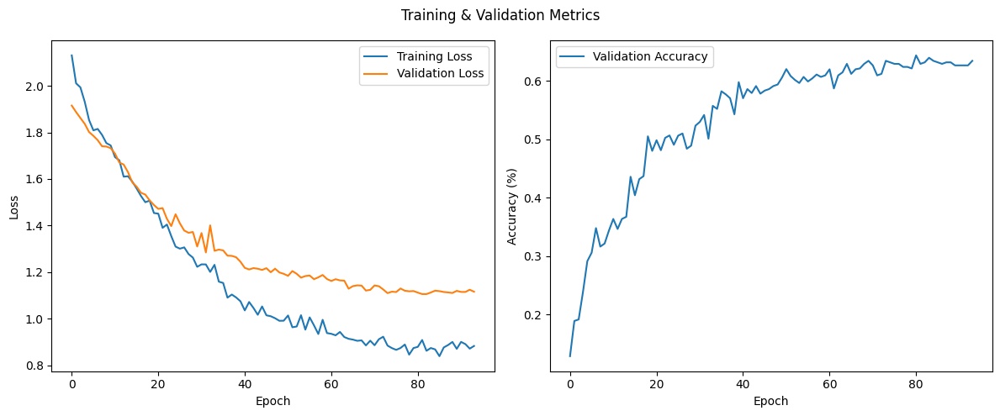

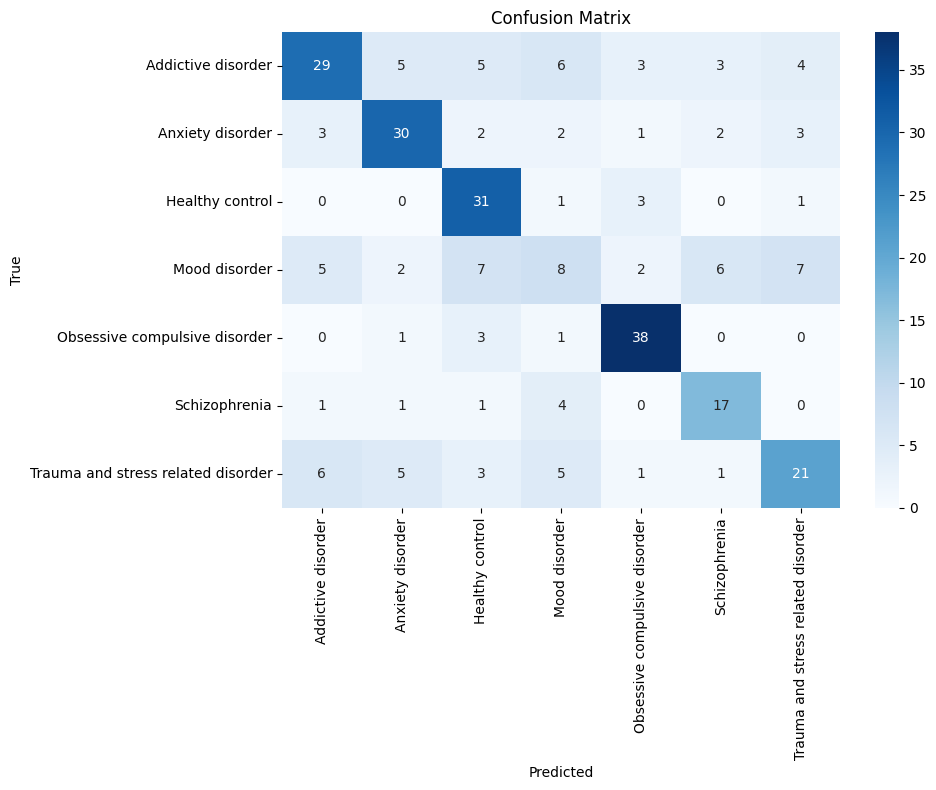

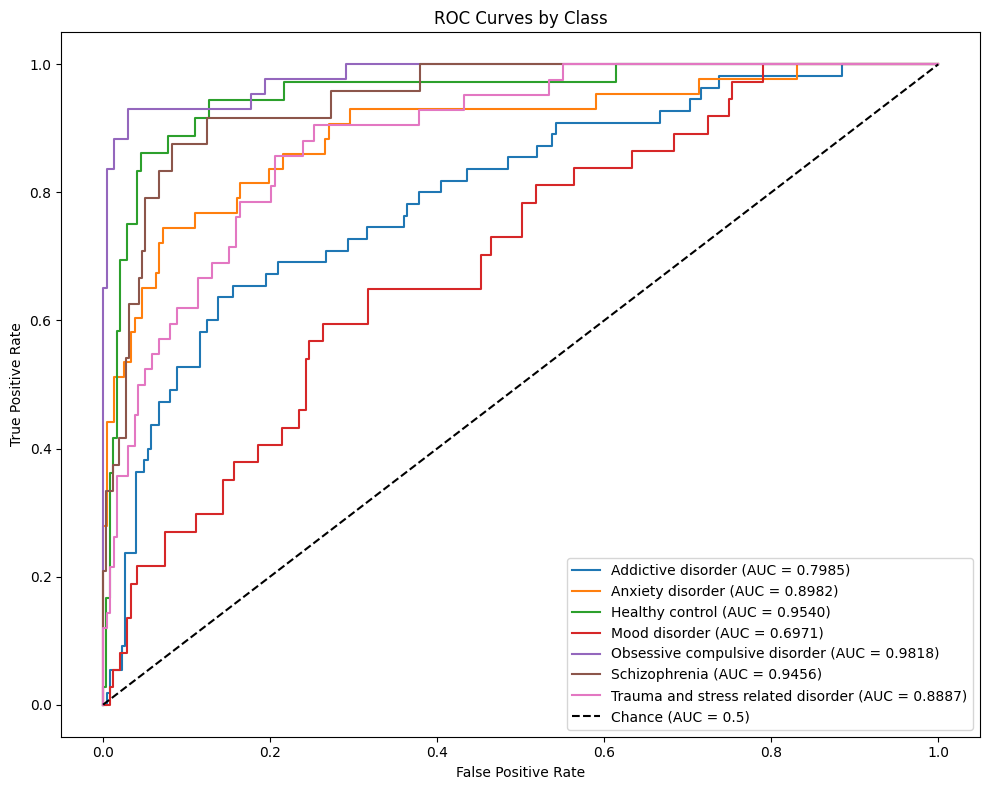

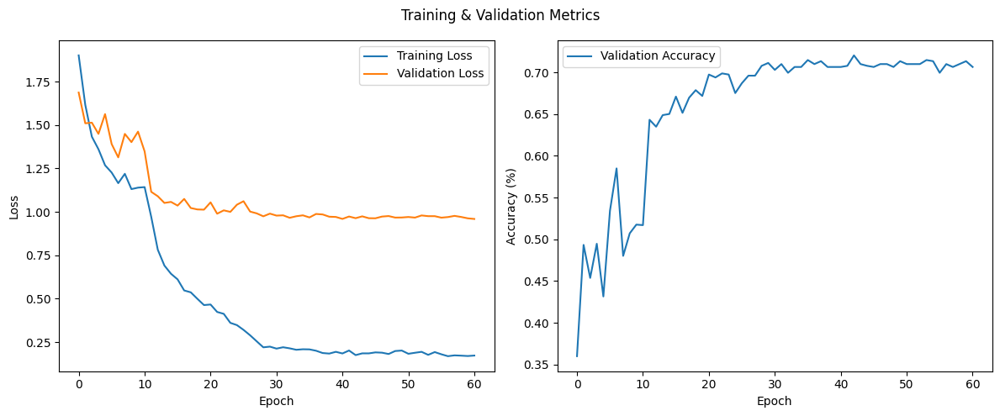

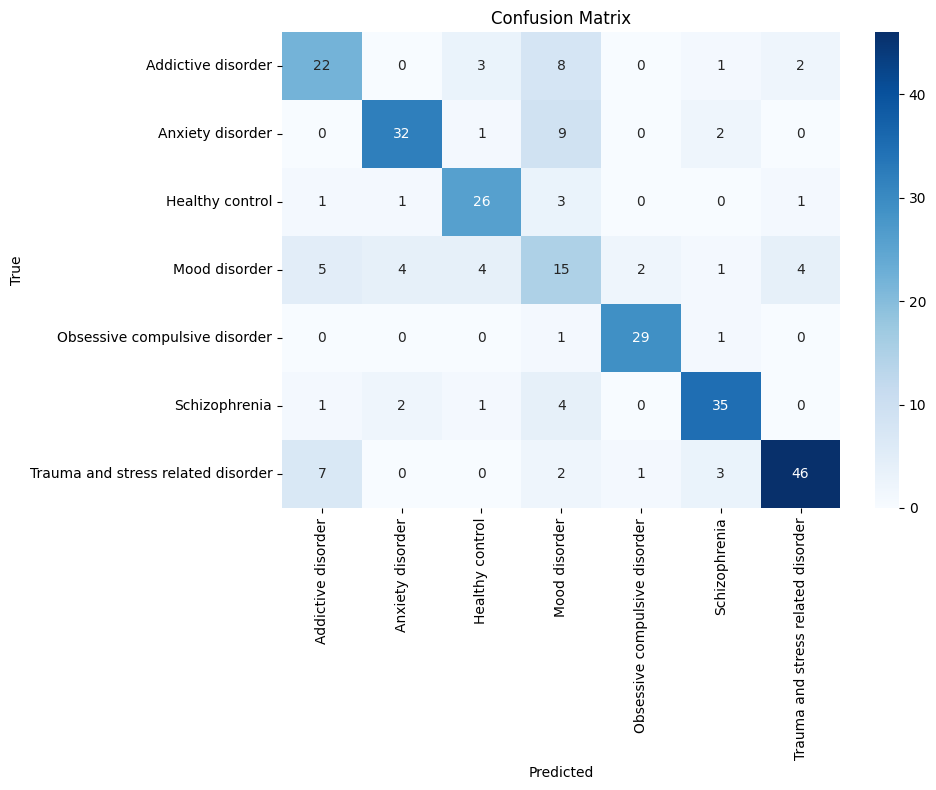

...

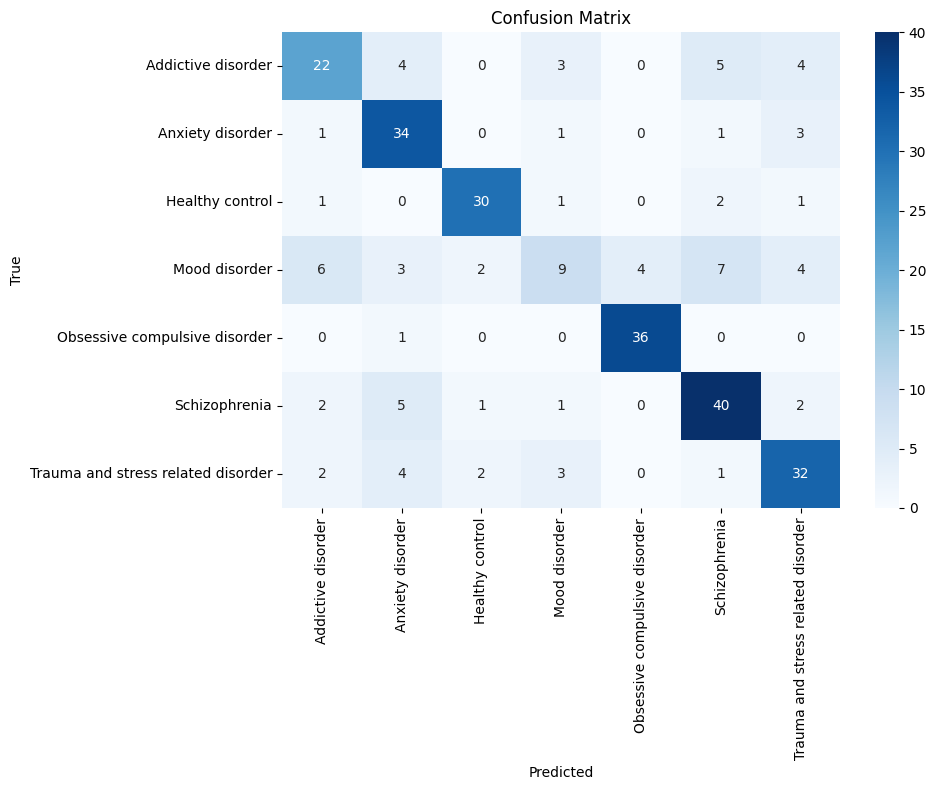

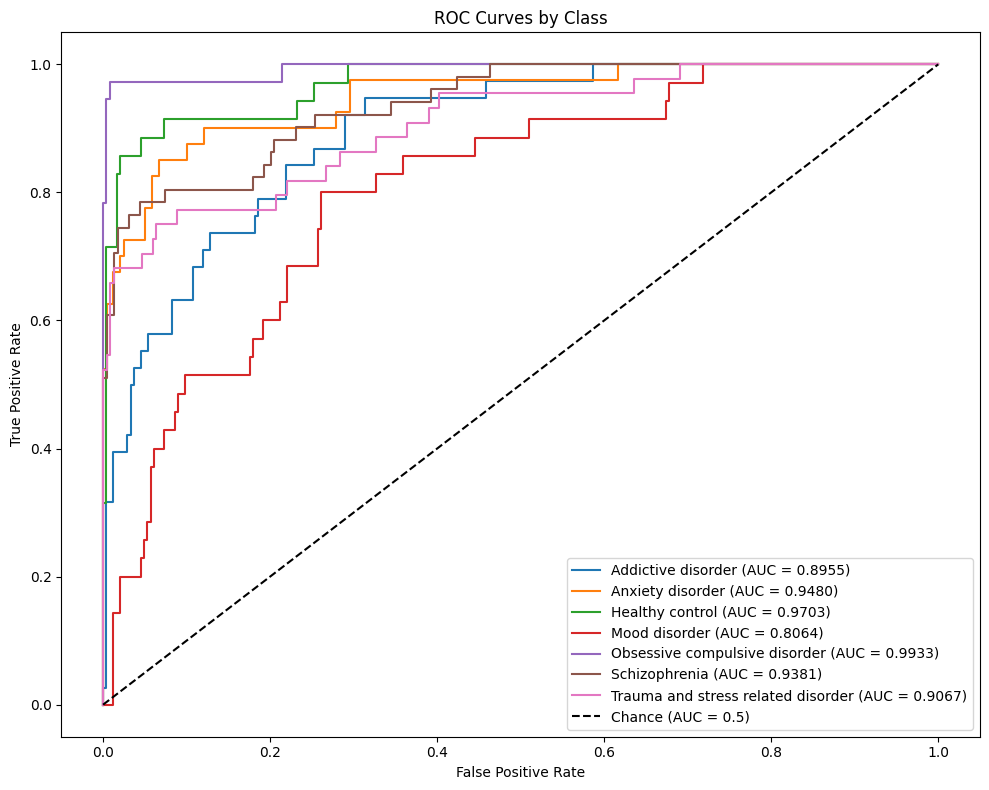

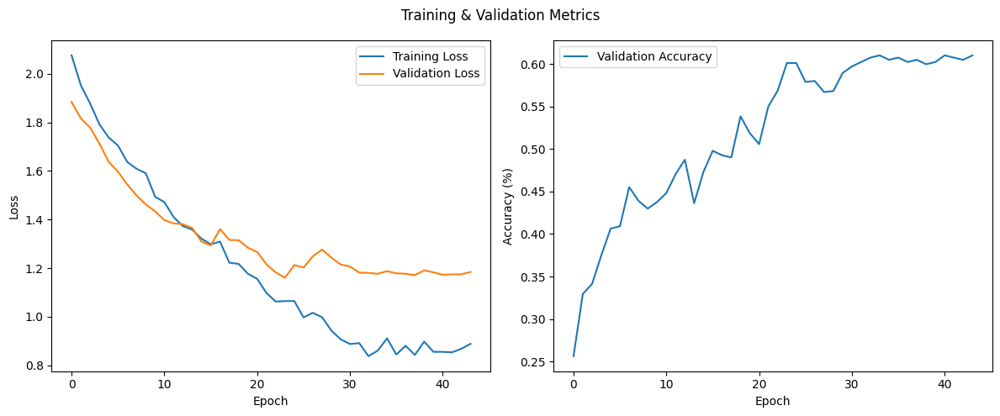

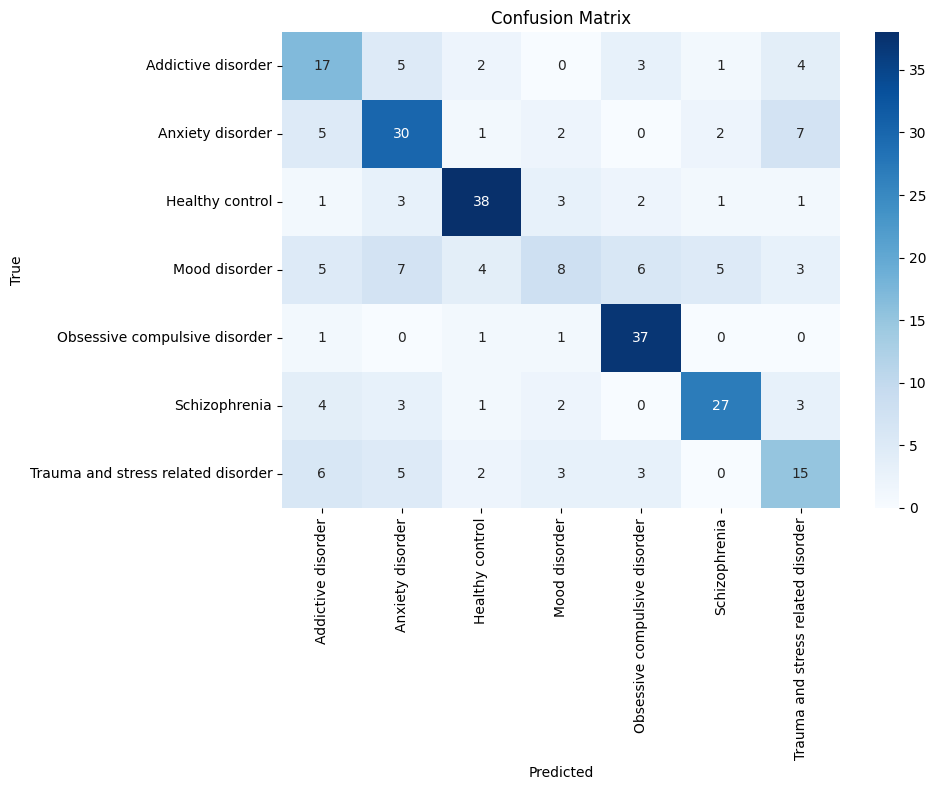

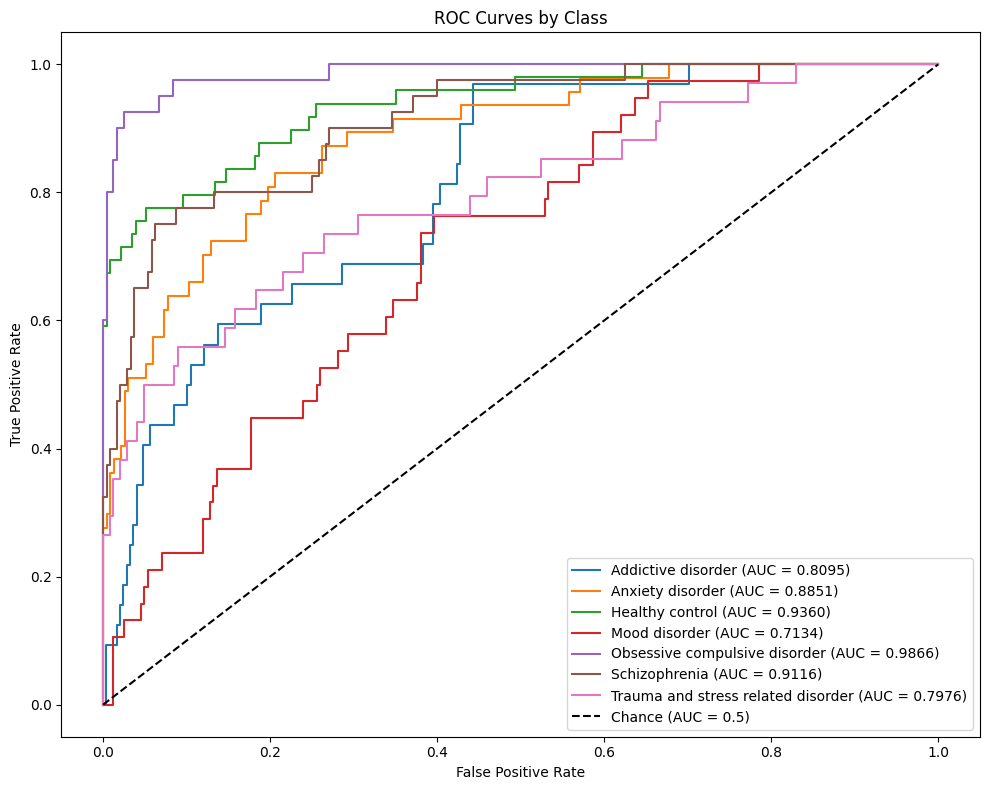

In [35]:
for group_name, result_dict in all_result_sets:
    for subset_name, data in result_dict.items():
        best_results = data["best_results"]
        
        fig_curves = best_results["fig_curves"]
        fig_conf_matrix = best_results["fig_conf_matrix"]
        fig_roc = best_results["fig_roc"]

        # fig_curves.savefig(f"{group_name}_{subset_name}_training_curves.png")
        # fig_conf_matrix.savefig(f"{group_name}_{subset_name}_confusion_matrix.png")
        # fig_roc.savefig(f"{group_name}_{subset_name}_roc_curve.png")
        
        display(HTML("<hr>"))
        display(HTML(f"<h2>{group_name} - {subset_name}</h2>"))
        display(fig_curves)
        display(fig_conf_matrix)
        display(fig_roc)

## | 7. Conclusions, Problems, and Limitations

[need to update]

* The class imbalance is evident for the multiclasses of the main.disorder variable. The SMOTE technique was applied to balance the classes and perform data augmentation.

* The data pre-processed with PSD and FC generated 1140 features. PCA with 99% variance was applied to the data, and thus 223 principal components were extracted.

* To avoid overfitting, techniques such as dropout, batch normalization, and early stopping were applied.

* The weights were initialized in the network with xavier_uniform.

* The network has convergence issues due to the high variability of the data. Despite using PCA, there were no significant improvements in performance compared to using all features from PSD and FC.

* Due to the enrichment of the data, the minority class obsessive compulsive disorder shows a tendency to overfitting, as the original data was 46 and increased to 266 with Euclidean distance.